# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
import math

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

df = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data, drop=None):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  if drop != None:
    D = ', '.join(drop)
    data = data.drop(columns=drop)
    print(f"훈련에 제외된 변수 들 : {D}")

  return data

In [11]:
df.columns

Index(['DATE', 'winner', 'loser', 'wml', 'mvol_cum6', 'mvol_t_1', 'mvol_t_2',
       'mvol_t_3', 'mvol_t_4', 'mvol_t_5', 'mvol_t_6', 'form_date',
       'cum_loser', 'cum_winner', 'cum_loser_t_2_4', 'cum_winner_t_2_4',
       'cum_loser_t_5_8', 'cum_winner_t_5_8', 'cum_loser_t_9_12',
       'cum_winner_t_9_12'],
      dtype='object')

In [12]:
drop = ['cum_loser', 'cum_winner', 'cum_loser_t_2_4', 'cum_winner_t_2_4',
       'cum_loser_t_5_8', 'cum_winner_t_5_8', 'cum_loser_t_9_12',
       'cum_winner_t_9_12']
df = preprocessing(df, drop)

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')
훈련에 제외된 변수 들 : cum_loser, cum_winner, cum_loser_t_2_4, cum_winner_t_2_4, cum_loser_t_5_8, cum_winner_t_5_8, cum_loser_t_9_12, cum_winner_t_9_12


In [13]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0
  WML = df[['wml']]

  df.drop(columns=['wml'], inplace=True)

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df, WML

In [14]:
dynmom, WML = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [15]:
def Roling_Windows(data, window_size, method, model, model_name, plot=True, plot_feature=True):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
    'TRAIN_START_DATE':[],
    'TRAIN_END_DATE':[],
    'TEST_DATE':[],
    'Actual_POS_WML':[],
    f'{model_name}_PRED_POS_WML':[],
    f'{model_name}_PROB_POS_WML':[]
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print(f'\n{model_name} Model의 Rolling {method} Window를 실행합니다\n')
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml'])
    y_test = test['pos_wml'] 

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict[f'{model_name}_PRED_POS_WML'].append(pred_test[0])
    result_dict[f'{model_name}_PROB_POS_WML'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 모델 성능 시각화
  if plot == True:
    plot_result(result, method, model_name)
  
  # 모델의 변수 중요도 시각화
  if plot_feature == True:
    plot_feature_importances(result, model_name)
    print()

  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

In [16]:
def plot_result(data, method, model_name):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  precision = precision_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  recall = recall_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  F1_score = f1_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Performance results {method} of the {model_name} model')
  
  plt.show()

In [17]:
def plot_feature_importances(data, model_name):

  data = data.drop(columns=['TRAIN_START_DATE', 'TRAIN_END_DATE', 'Actual_POS_WML',
                           f'{model_name}_PRED_POS_WML', f'{model_name}_PROB_POS_WML'])

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [18]:
def display_feature_importance(data, method):
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [19]:
def slice_feature_importance(data, num, method, model_name):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data, method, model_name)
      plot_feature_importances(sliced_data, model_name)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data, method, model_name)
    plot_feature_importances(sliced_data)

In [20]:
def cumm_return_by_dynamic(data, wml, weight, A0_P1, A1_P0,  plot=True):

  start_index = data.index[0]
  wml = wml.loc[start_index:]

  df = pd.DataFrame(wml['wml'] * data[weight])
  df.columns = ['cum_return']
  df['cum_return'] = (1 + df.cum_return).cumprod() - 1 
  
  S = df['cum_return'].mean()/df['cum_return'].std()

  print('Sharpe Ratio : {:0.5f}\n'.format(S))

  print('최근 누적 수익률\n')
  latly_10 = df.sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = df.sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  TEST_WML = wml.copy()
  TEST_WML['wml'] = (1 + TEST_WML.wml).cumprod() - 1
  TEST_WML.columns = ['cum_return'] 

  if plot == True:

    plt.figure(figsize=(13, 6))
    sns.lineplot(data=df, x=df.index, y=df['cum_return'], label='With_ML')
    sns.lineplot(data=TEST_WML, x=TEST_WML.index, y=TEST_WML['cum_return'], label='Original')
    plt.xticks([df.index[i] for i in range(0,len(df.index), 12)])
    plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=5,
                    width=5)
    for i in A0_P1:
      plt.vlines(i, -80000, 0, color='pink', linewidth=0.4, alpha=1)

    for i in A1_P0:
      plt.vlines(i, 80000, 0, color='pink', linewidth=0.4, alpha=1)

    plt.legend(fontsize=10)
    plt.show() 

  return df

In [21]:
def What_Pred(data, WML, model_name):

  start_index = data.index[0]
  WML = WML.loc[start_index:]
  WML.index.name = 'TEST_DATE'

  Q1 = WML.quantile(0.25)
  Q3 = WML.quantile(0.75)
  IQR = Q3 - Q1

  Upper = Q3 + (1.5*IQR)
  Lower = Q1 - (1.5*IQR)

  print('\nIQR 기준 WML 이상치 (Maximum 미만) 개수\n')

  cond_U = (WML['wml']>Upper[0])  
  WML_U = WML.loc[cond_U]
  
  print(f'Number of Outlier by IQR (Maximum) : {WML_U.shape[0]}')
  print(f'Maximum by IQR : {Upper[0]}')
  print(f"Max Outlier : {WML_U['wml'].max()}")
  print(f"Min Outlier : {WML_U['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_1 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_1 = Result.loc[cond_1]
  print('\nACTUAL = PRED = 1\n')
  sns.boxplot(data=R_1, x='wml')
  plt.show()
  display(R_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  print('\nIQR 기준 WML 이상치 (Minimum 미만) 개수\n')

  cond_L = (WML['wml']<Lower[0])  
  WML_L = WML.loc[cond_L]
  
  print(f'Number of Outlier by IQR (Minimum) : {WML_L.shape[0]}')
  print(f'Minimun by IQR : {Lower[0]}')
  print(f"Max Outlier : {WML_L['wml'].max()}")
  print(f"Min Outlier : {WML_L['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_0 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_0 = Result.loc[cond_0]
  print('\nACTUAL = PRED = 0\n')
  sns.boxplot(data=R_0, x='wml')
  plt.show()
  display(R_0[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_0_1 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_0_1 = Result.loc[cond_0_1]
  print('\nACTUAL = 0 &  PRED = 1\n')
  sns.boxplot(data=R_0_1, x='wml')
  plt.show()
  sns.barplot(data=R_0_1.sort_values(by='wml', ascending=True), x=R_0_1.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_0_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_1_0 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_1_0 = Result.loc[cond_1_0]
  print('\nACTUAL = 1 &  PRED = 0\n')
  sns.boxplot(data=R_1_0, x='wml')
  plt.show()
  sns.barplot(data=R_1_0.sort_values(by='wml', ascending=True), x=R_1_0.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_1_0[['wml']].describe().T)

  return list(R_0_1.index), list(R_1_0.index)

## Rolling Fixed Windows

### Random Forest

In [22]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.29      0.34       316
         1.0       0.67      0.78      0.72       590

    accuracy                           0.61       906
   macro avg       0.55      0.54      0.53       906
weighted avg       0.58      0.61      0.59       906


accuracy : 0.6114790286975718

precision : 0.673469387755102

recall : 0.7830508474576271

F1-Score : 0.7241379310344828



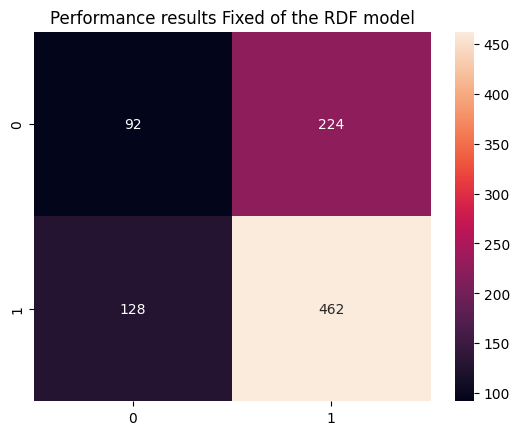


Feature Importance of the model



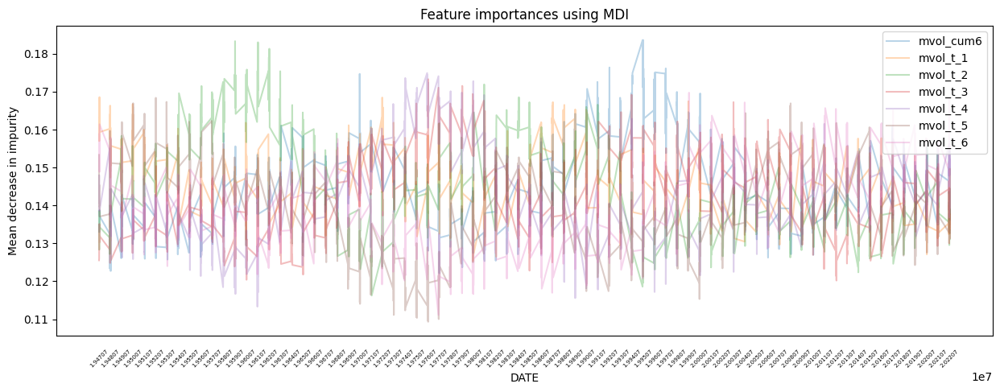

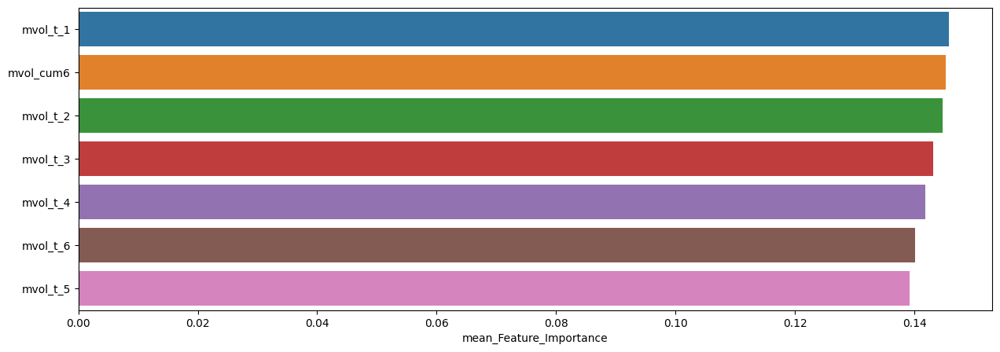

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.145748,0.168562,0.125312
mvol_cum6,0.145299,0.183611,0.122121
mvol_t_2,0.144701,0.183317,0.116244
mvol_t_3,0.143129,0.173283,0.120196
mvol_t_4,0.141864,0.174907,0.113317
mvol_t_6,0.140062,0.169741,0.111144
mvol_t_5,0.139197,0.168378,0.109337


In [23]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF, # 사용할 모델
                                  model_name='RDF', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.23      0.27        75
         1.0       0.67      0.79      0.73       151

    accuracy                           0.60       226
   macro avg       0.51      0.51      0.50       226
weighted avg       0.56      0.60      0.58       226


accuracy : 0.6017699115044248

precision : 0.672316384180791

recall : 0.7880794701986755

F1-Score : 0.7256097560975611



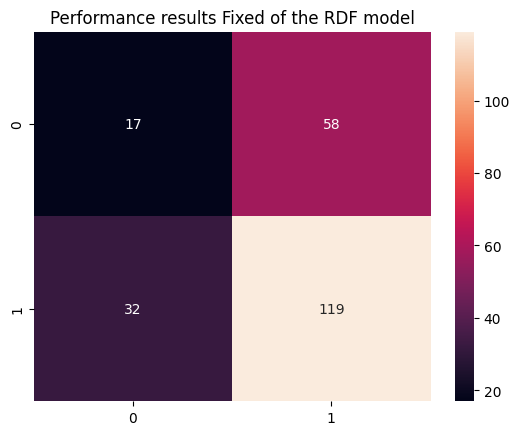


Feature Importance of the model



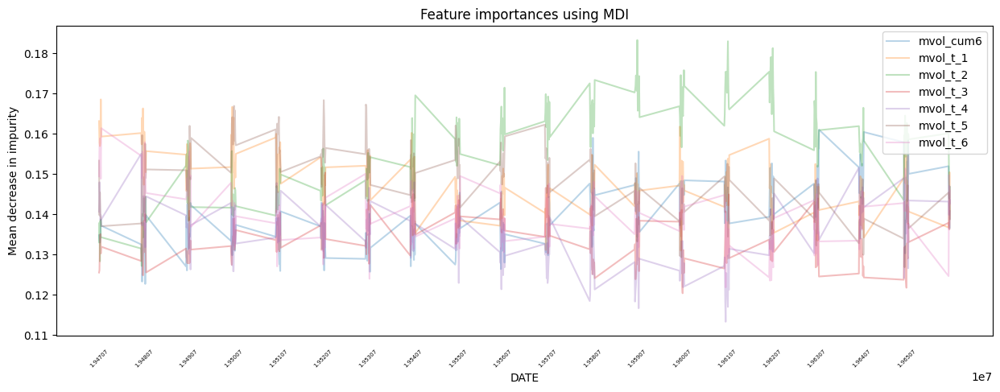

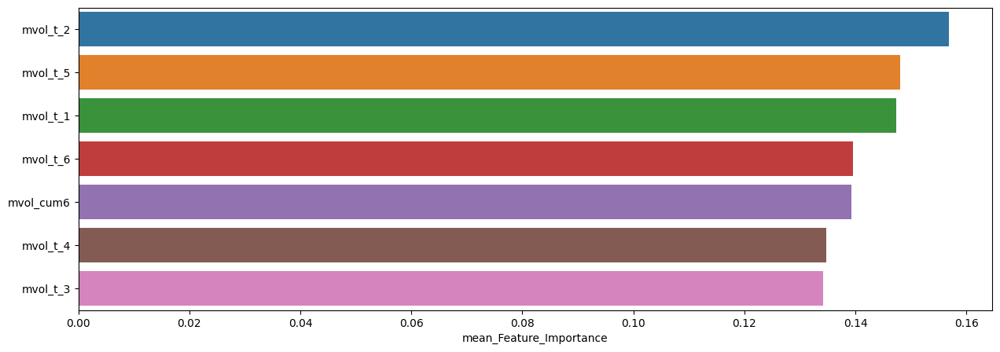

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.156805,0.183317,0.127188
mvol_t_5,0.147997,0.168378,0.126863
mvol_t_1,0.147367,0.168562,0.130997
mvol_t_6,0.139613,0.161410,0.121859
mvol_cum6,0.139243,0.161045,0.122722
mvol_t_4,0.134781,0.155067,0.113317
mvol_t_3,0.134195,0.150387,0.120406



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.47      0.36      0.41        75
         1.0       0.71      0.79      0.75       151

    accuracy                           0.65       226
   macro avg       0.59      0.58      0.58       226
weighted avg       0.63      0.65      0.64       226


accuracy : 0.6504424778761062

precision : 0.7142857142857143

recall : 0.7947019867549668

F1-Score : 0.7523510971786833



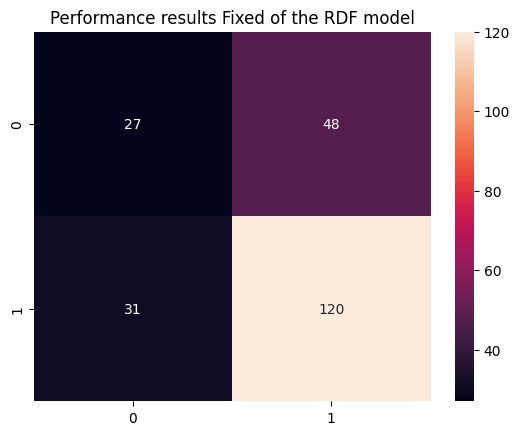


Feature Importance of the model



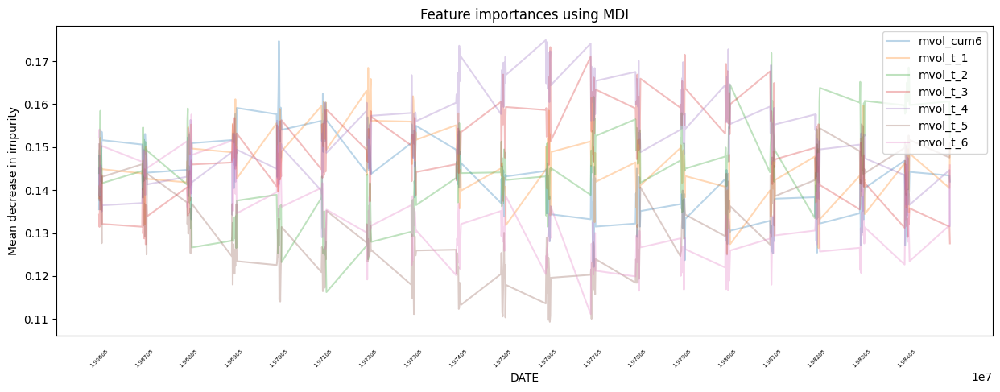

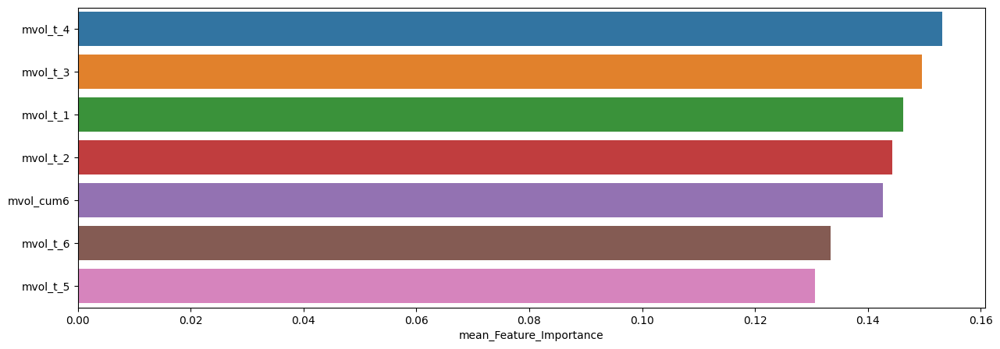

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_4,0.153135,0.174907,0.128997
mvol_t_3,0.149520,0.173283,0.127384
mvol_t_1,0.146271,0.168464,0.125312
mvol_t_2,0.144381,0.171913,0.116244
mvol_cum6,0.142699,0.174684,0.122121
mvol_t_6,0.133370,0.157591,0.111144
mvol_t_5,0.130624,0.155327,0.109337



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.34      0.37        70
         1.0       0.72      0.78      0.75       156

    accuracy                           0.64       226
   macro avg       0.57      0.56      0.56       226
weighted avg       0.63      0.64      0.63       226


accuracy : 0.6415929203539823

precision : 0.7245508982035929

recall : 0.7756410256410257

F1-Score : 0.7492260061919503



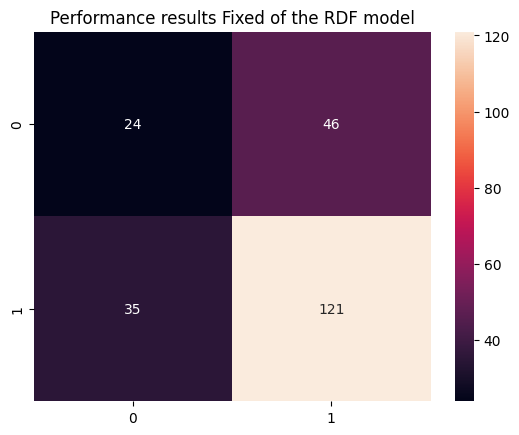


Feature Importance of the model



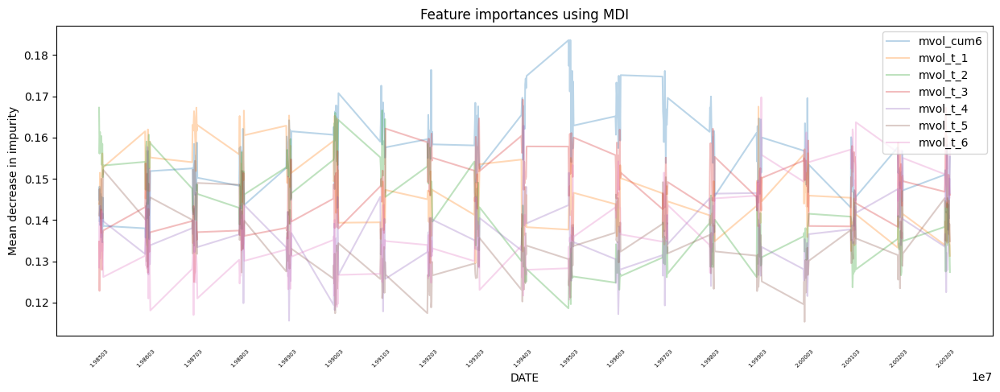

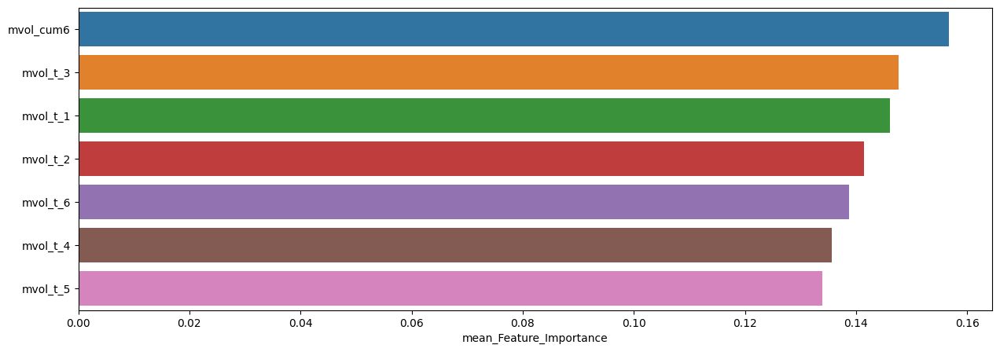

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.156665,0.183611,0.134589
mvol_t_3,0.147653,0.169193,0.122816
mvol_t_1,0.146073,0.167470,0.129519
mvol_t_2,0.141432,0.167220,0.118593
mvol_t_6,0.138669,0.169741,0.116972
mvol_t_4,0.135604,0.162852,0.115582
mvol_t_5,0.133903,0.154326,0.115328



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.25      0.32        96
         1.0       0.59      0.77      0.67       132

    accuracy                           0.55       228
   macro avg       0.52      0.51      0.49       228
weighted avg       0.53      0.55      0.52       228


accuracy : 0.5526315789473685

precision : 0.5862068965517241

recall : 0.7727272727272727

F1-Score : 0.6666666666666667



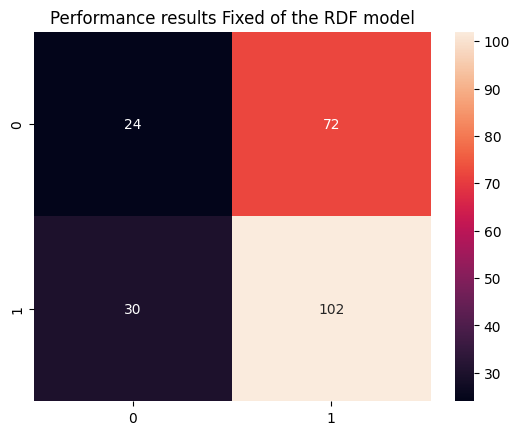


Feature Importance of the model



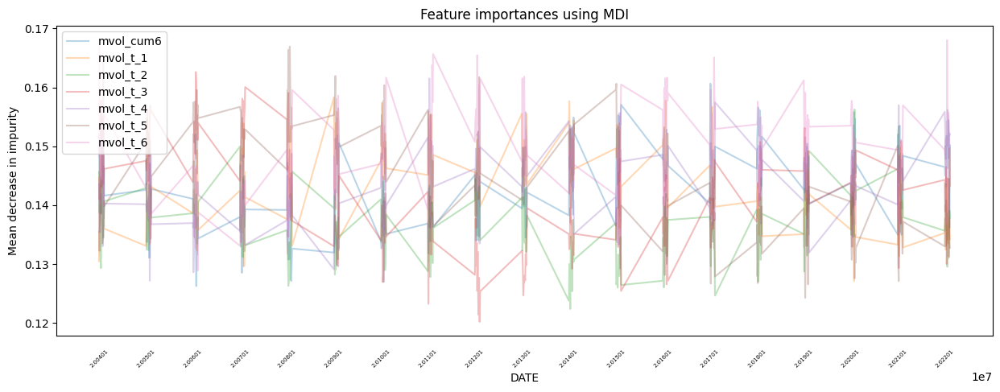

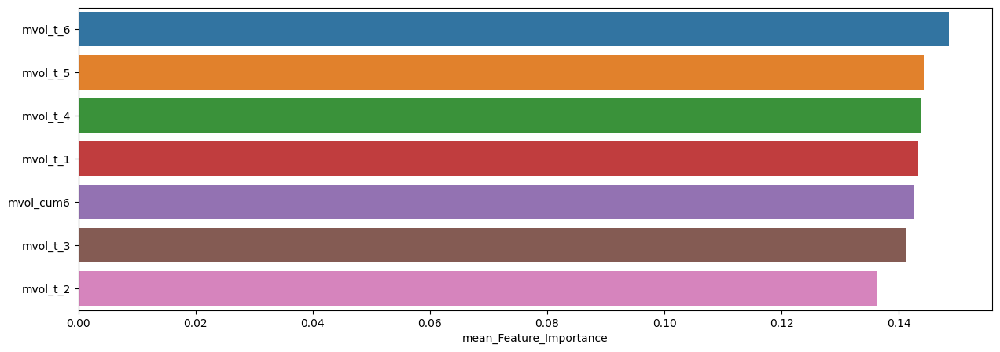

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_6,0.148520,0.168025,0.128898
mvol_t_5,0.144220,0.166920,0.124279
mvol_t_4,0.143917,0.161517,0.127157
mvol_t_1,0.143303,0.158322,0.127106
mvol_cum6,0.142612,0.160649,0.126252
mvol_t_3,0.141167,0.162609,0.120196
mvol_t_2,0.136262,0.156256,0.122376


In [24]:
slice_feature_importance(Fixed_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



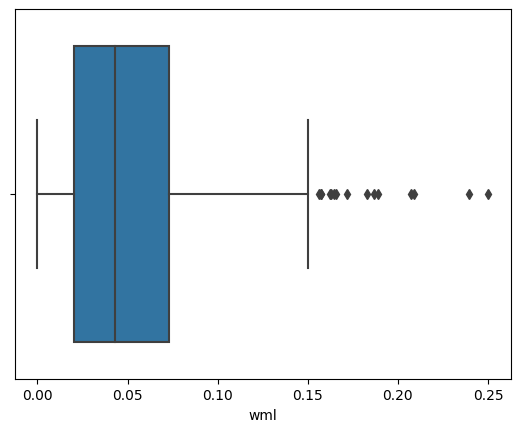

,count,mean,std,min,25%,50%,75%,max
wml,462.0,0.052741,0.042669,0.000007,0.020499,0.042982,0.073142,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



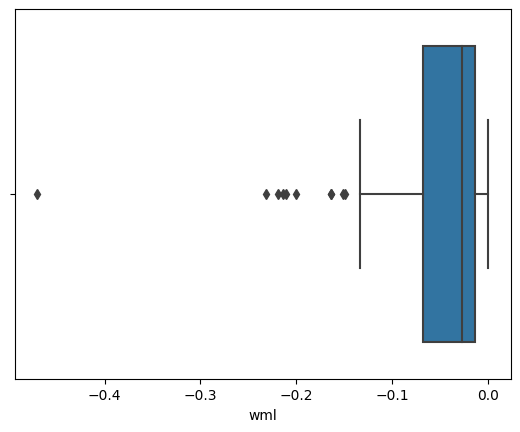

,count,mean,std,min,25%,50%,75%,max
wml,92.0,-0.055451,0.071353,-0.469903,-0.06795,-0.027861,-0.013763,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



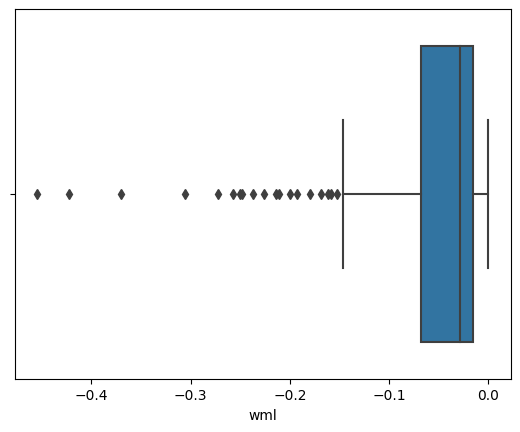

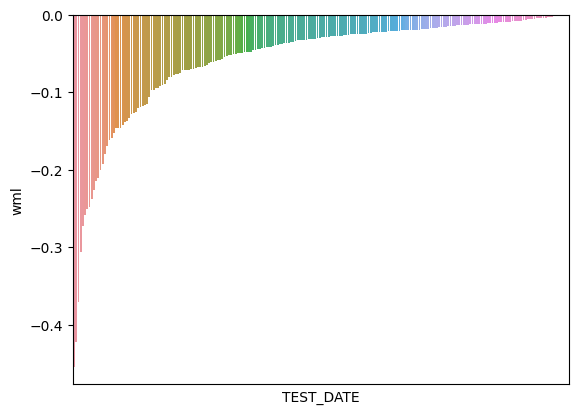

,count,mean,std,min,25%,50%,75%,max
wml,224.0,-0.056664,0.071344,-0.454349,-0.068119,-0.029076,-0.015243,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



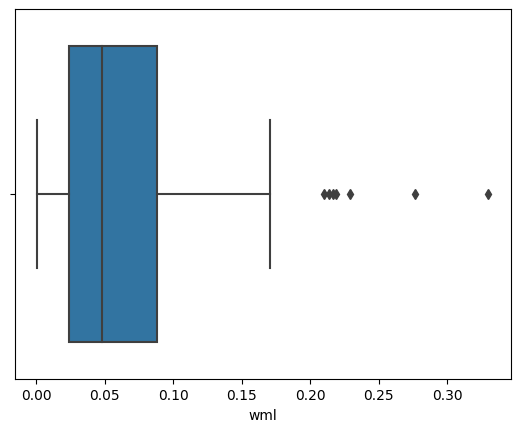

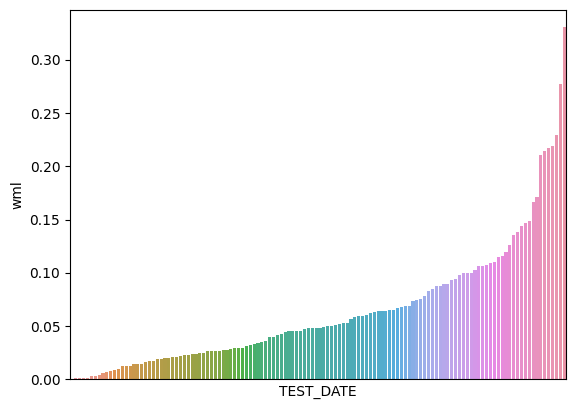

,count,mean,std,min,25%,50%,75%,max
wml,128.0,0.064306,0.058723,0.000805,0.023628,0.048303,0.088032,0.330163


In [25]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Fixed_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.76962

최근 누적 수익률

  2022년-12월 -> 14148.84
  2022년-11월 -> 14148.84
  2022년-10월 -> 14148.84
  2022년-09월 -> 12528.51
  2022년-08월 -> 12528.51

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 28580.47
  2등 : 2008년-11월 -> 26065.87
  3등 : 2009년-01월 -> 25448.89
  4등 : 2008년-12월 -> 25448.89
  5등 : 2002년-09월 -> 24043.82
  6등 : 2008년-10월 -> 23769.81
  7등 : 2008년-09월 -> 23769.81
  8등 : 2001년-09월 -> 21702.03
  9등 : 2008년-07월 -> 21187.92
  10등 : 2008년-08월 -> 21187.92



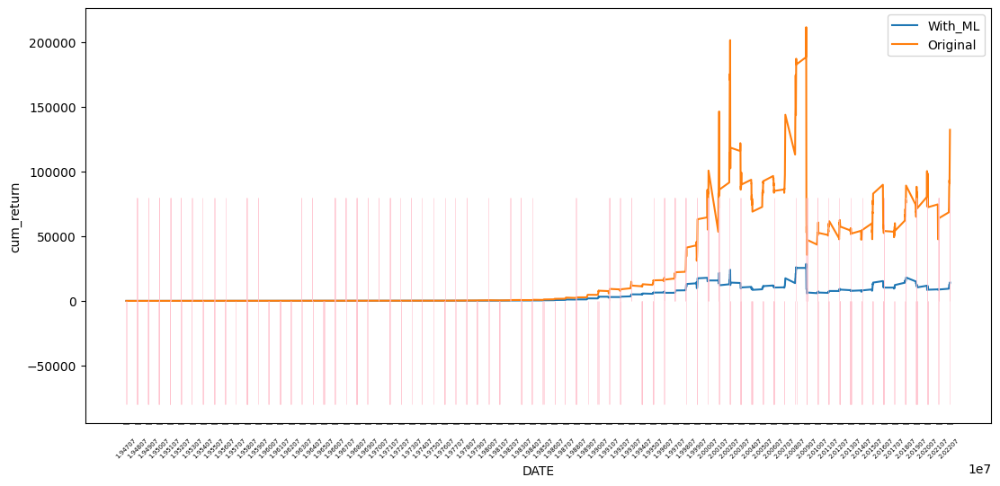

In [26]:
RDF_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.76718

최근 누적 수익률

  2022년-12월 -> 7741.78
  2022년-11월 -> 7384.64
  2022년-10월 -> 7328.25
  2022년-09월 -> 6816.86
  2022년-08월 -> 6612.01

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 7902.43
  2등 : 2022년-12월 -> 7741.78
  3등 : 2002년-09월 -> 7481.91
  4등 : 2008년-11월 -> 7424.97
  5등 : 2022년-11월 -> 7384.64
  6등 : 2009년-01월 -> 7350.62
  7등 : 2022년-10월 -> 7328.25
  8등 : 2008년-12월 -> 7256.23
  9등 : 2008년-10월 -> 6917.11
  10등 : 2022년-09월 -> 6816.86



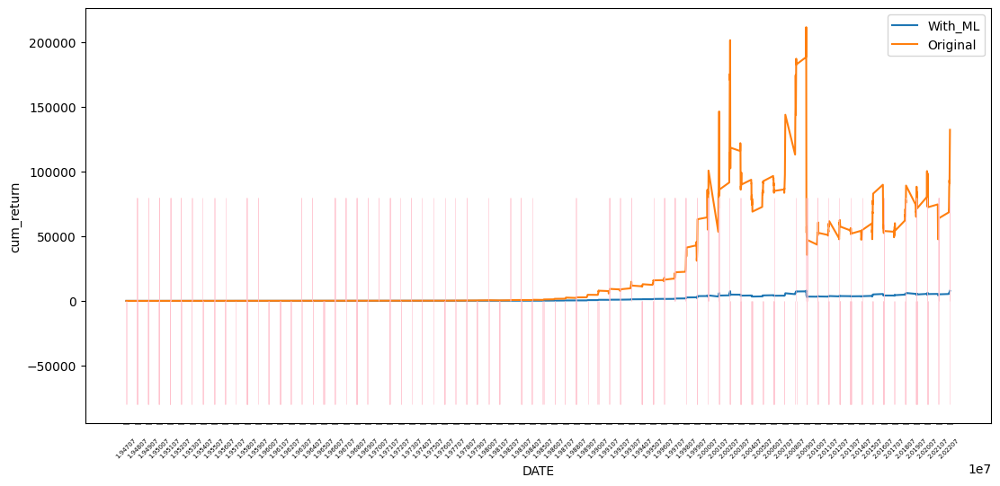

In [27]:
RDF_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [28]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.30      0.33       316
         1.0       0.66      0.73      0.70       590

    accuracy                           0.58       906
   macro avg       0.52      0.52      0.51       906
weighted avg       0.56      0.58      0.57       906


accuracy : 0.5816777041942605

precision : 0.6615620214395099

recall : 0.7322033898305085

F1-Score : 0.6950925181013676



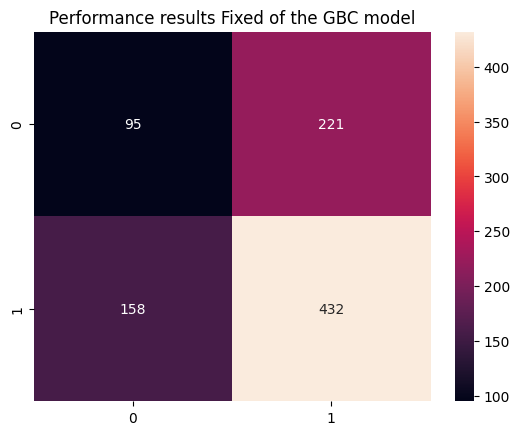


Feature Importance of the model



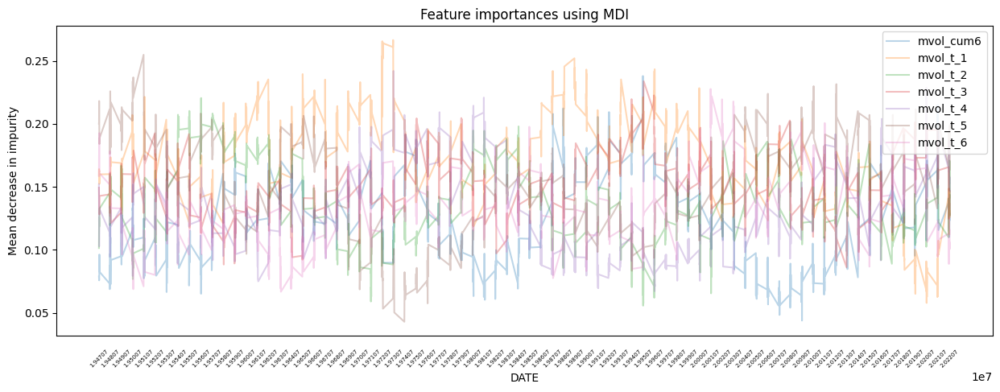

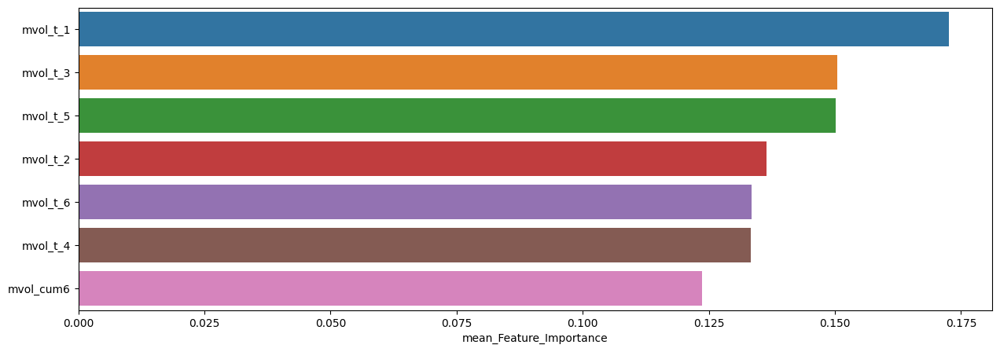

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.172548,0.266456,0.057960
mvol_t_3,0.150447,0.233787,0.086233
mvol_t_5,0.150078,0.254794,0.043032
mvol_t_2,0.136449,0.220476,0.055789
mvol_t_6,0.133438,0.227662,0.066817
mvol_t_4,0.133378,0.241945,0.067229
mvol_cum6,0.123662,0.237951,0.043969


In [29]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC, # 사용할 모델
                                  model_name='GBC', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.32      0.24      0.27        75
         1.0       0.66      0.74      0.70       151

    accuracy                           0.58       226
   macro avg       0.49      0.49      0.49       226
weighted avg       0.55      0.58      0.56       226


accuracy : 0.5752212389380531

precision : 0.6627218934911243

recall : 0.7417218543046358

F1-Score : 0.7000000000000001



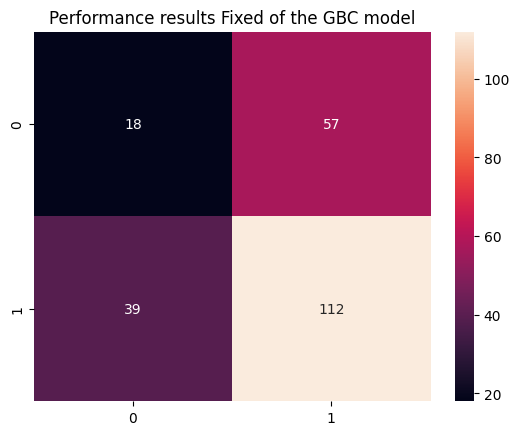


Feature Importance of the model



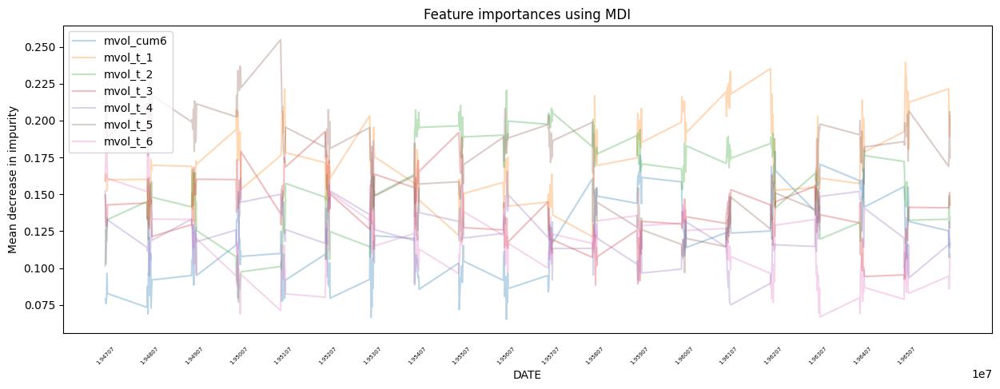

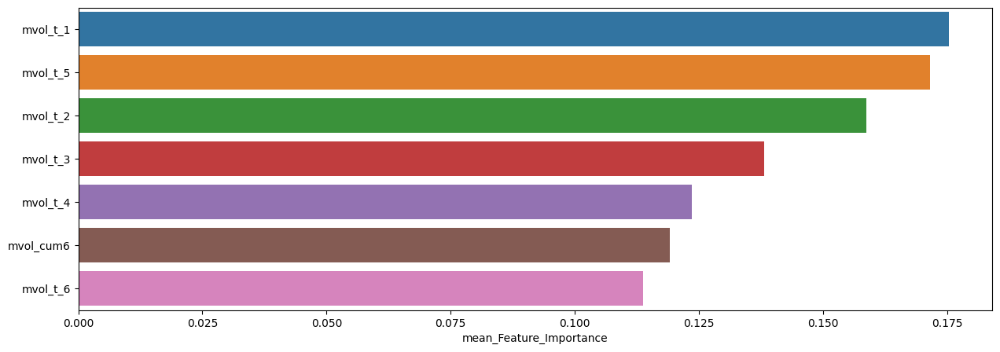

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.175317,0.239459,0.117464
mvol_t_5,0.171546,0.254794,0.096862
mvol_t_2,0.158708,0.220476,0.076871
mvol_t_3,0.138084,0.192579,0.088415
mvol_t_4,0.123534,0.186248,0.075080
mvol_cum6,0.119077,0.179150,0.065219
mvol_t_6,0.113733,0.192693,0.066817



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.41      0.43        75
         1.0       0.72      0.74      0.73       151

    accuracy                           0.63       226
   macro avg       0.58      0.58      0.58       226
weighted avg       0.63      0.63      0.63       226


accuracy : 0.6327433628318584

precision : 0.717948717948718

recall : 0.7417218543046358

F1-Score : 0.729641693811075



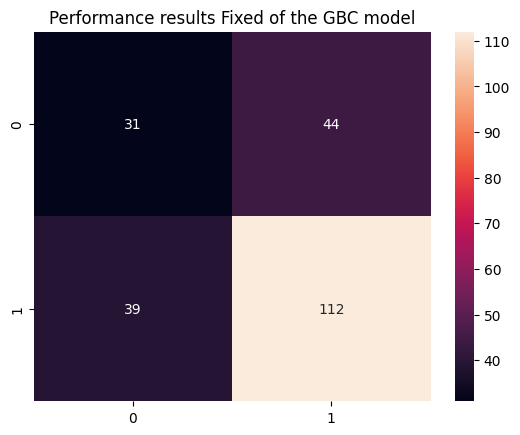


Feature Importance of the model



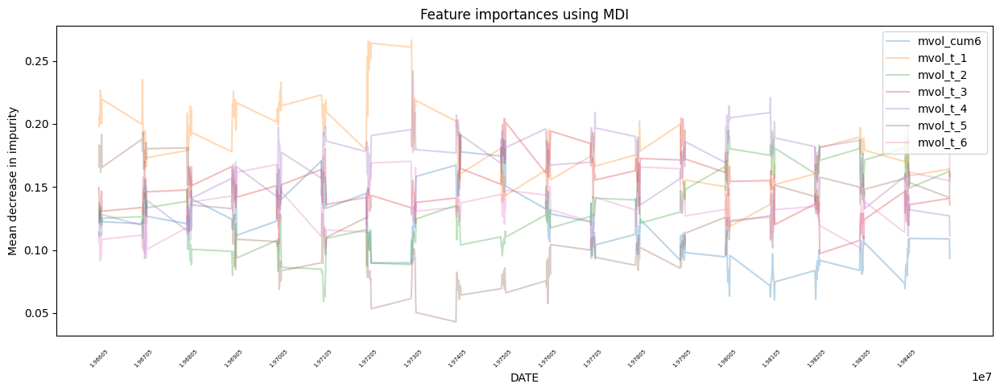

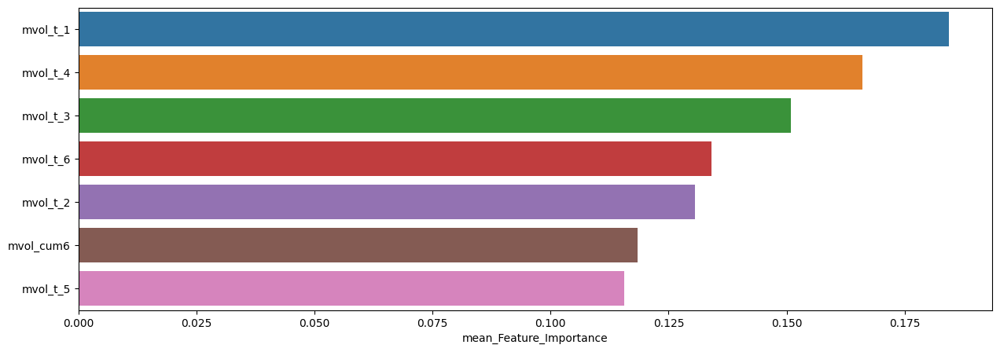

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.184323,0.266456,0.118770
mvol_t_4,0.166135,0.241945,0.093141
mvol_t_3,0.150961,0.204588,0.097223
mvol_t_6,0.134029,0.182063,0.091561
mvol_t_2,0.130606,0.197991,0.059097
mvol_cum6,0.118378,0.191362,0.060452
mvol_t_5,0.115568,0.193608,0.043032



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.33      0.35        70
         1.0       0.71      0.75      0.73       156

    accuracy                           0.62       226
   macro avg       0.54      0.54      0.54       226
weighted avg       0.61      0.62      0.61       226


accuracy : 0.6194690265486725

precision : 0.7134146341463414

recall : 0.75

F1-Score : 0.73125



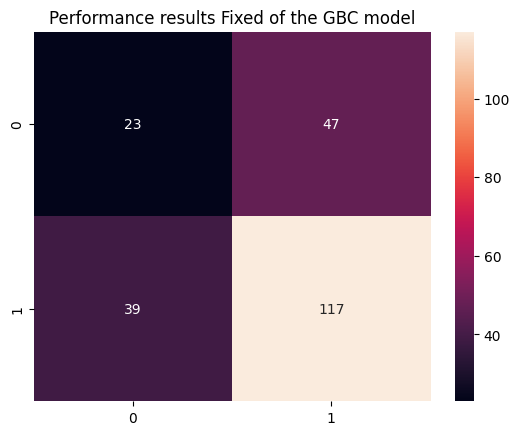


Feature Importance of the model



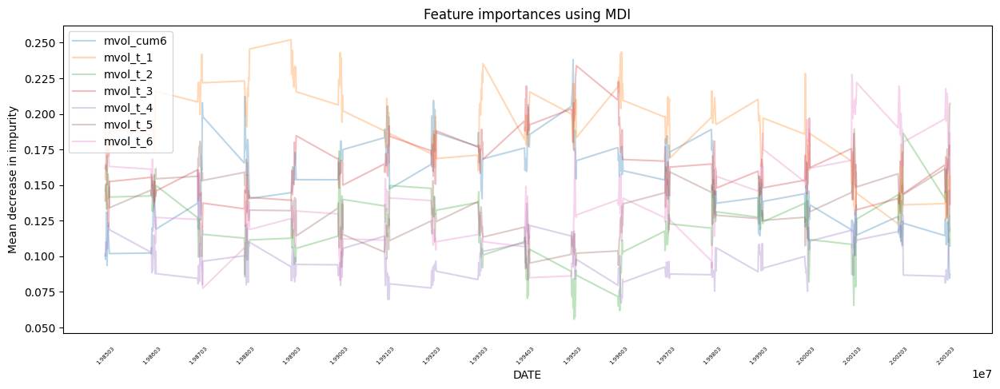

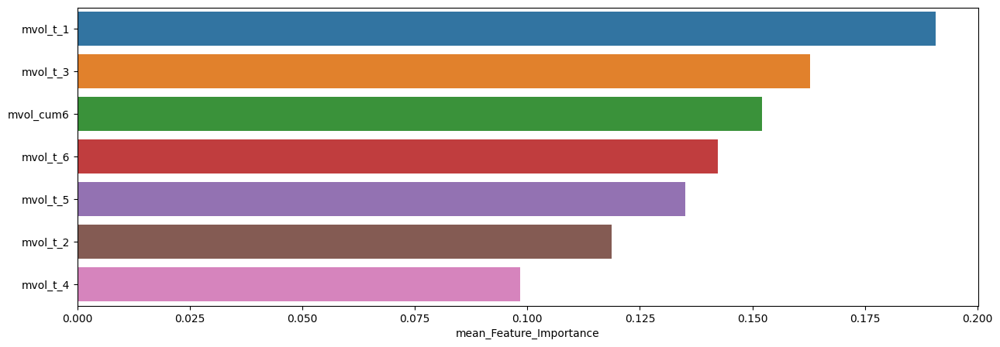

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.190675,0.252020,0.122793
mvol_t_3,0.162885,0.233787,0.119849
mvol_cum6,0.152135,0.237951,0.084691
mvol_t_6,0.142244,0.227662,0.077607
mvol_t_5,0.135074,0.207217,0.083448
mvol_t_2,0.118666,0.186349,0.055789
mvol_t_4,0.098322,0.146295,0.067229



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.24      0.29        96
         1.0       0.55      0.69      0.61       132

    accuracy                           0.50       228
   macro avg       0.46      0.46      0.45       228
weighted avg       0.47      0.50      0.48       228


accuracy : 0.5

precision : 0.5548780487804879

recall : 0.6893939393939394

F1-Score : 0.6148648648648649



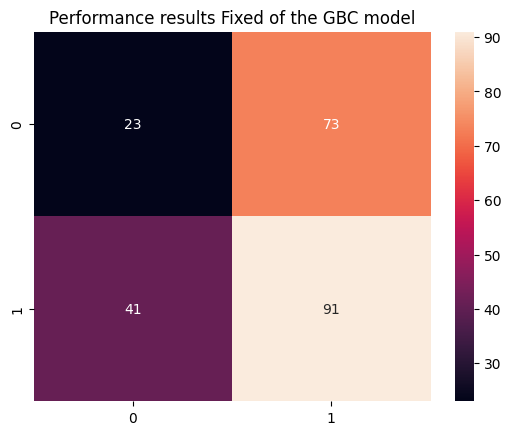


Feature Importance of the model



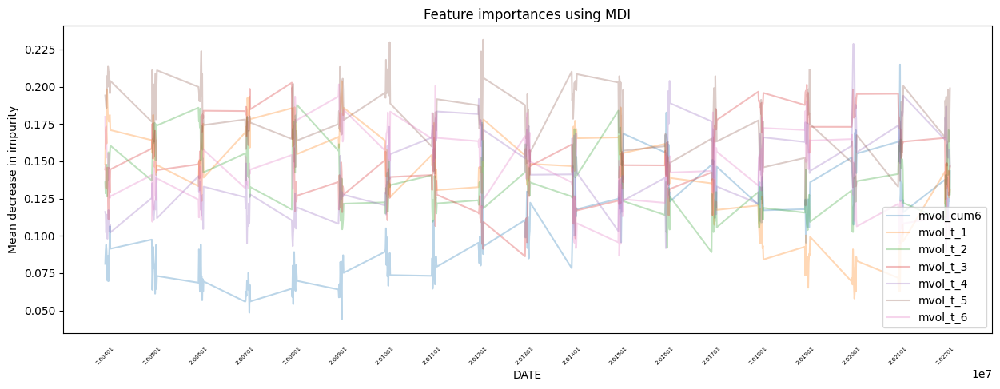

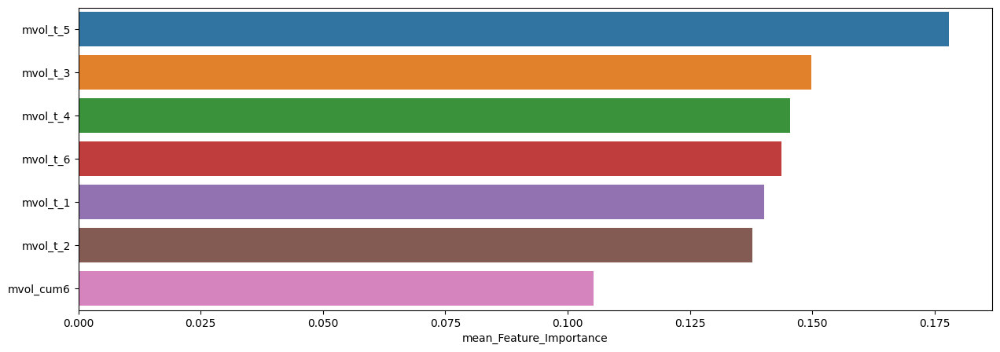

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.177878,0.231466,0.120326
mvol_t_3,0.149864,0.202678,0.086233
mvol_t_4,0.145414,0.228711,0.091695
mvol_t_6,0.143655,0.201550,0.086733
mvol_t_1,0.140163,0.203761,0.057960
mvol_t_2,0.137804,0.187797,0.089022
mvol_cum6,0.105222,0.214839,0.043969


In [30]:
slice_feature_importance(Fixed_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



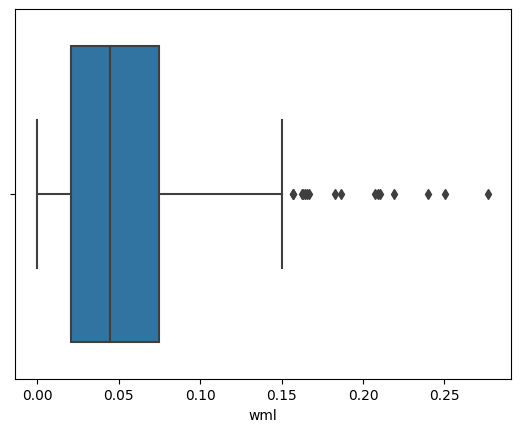

,count,mean,std,min,25%,50%,75%,max
wml,432.0,0.053957,0.044384,0.000007,0.020602,0.044699,0.074961,0.276912



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



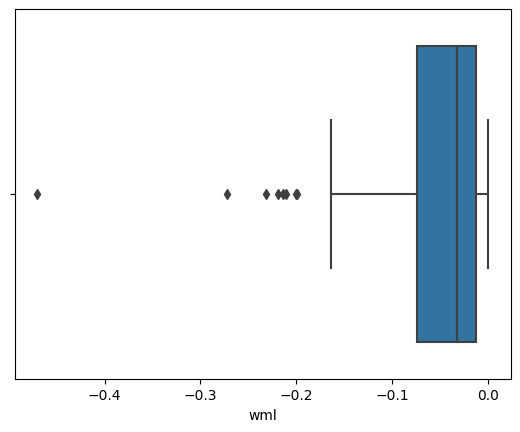

,count,mean,std,min,25%,50%,75%,max
wml,95.0,-0.058919,0.074922,-0.469903,-0.074194,-0.03264,-0.013291,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



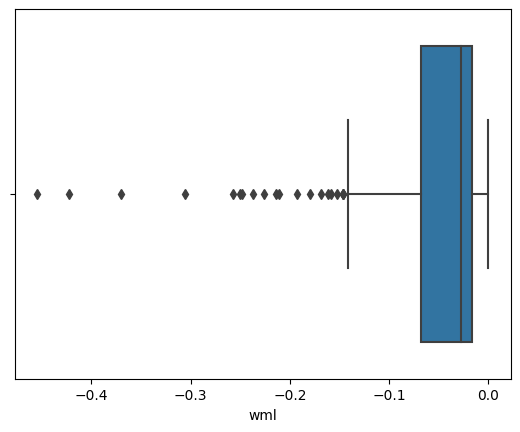

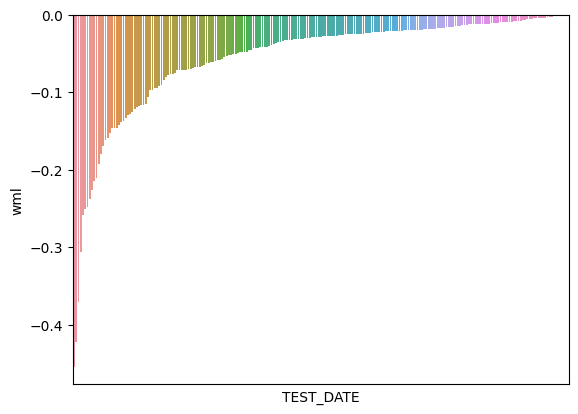

,count,mean,std,min,25%,50%,75%,max
wml,221.0,-0.05519,0.069735,-0.454349,-0.06765,-0.028115,-0.016495,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



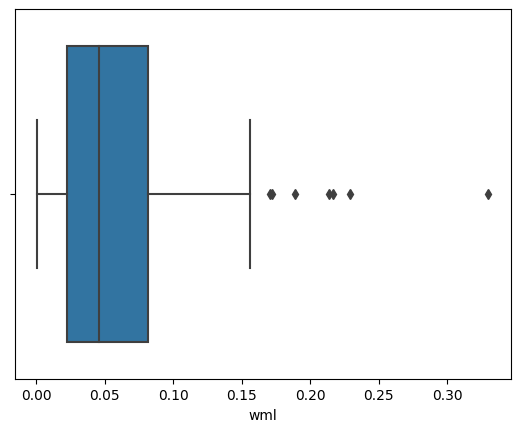

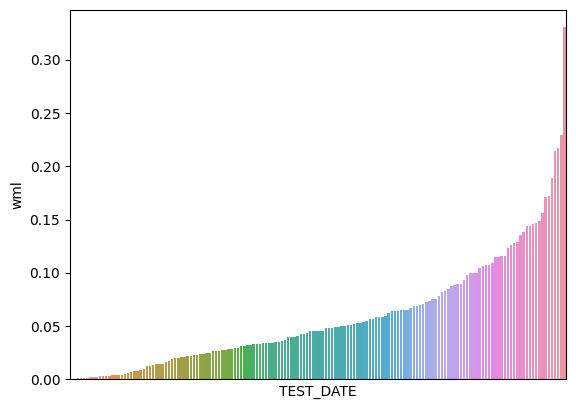

,count,mean,std,min,25%,50%,75%,max
wml,158.0,0.058784,0.052874,0.000692,0.02262,0.04546,0.081177,0.330163


In [31]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Fixed_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.72935

최근 누적 수익률

  2022년-12월 -> 8744.02
  2022년-11월 -> 7878.11
  2022년-10월 -> 7878.11
  2022년-09월 -> 6975.85
  2022년-08월 -> 6975.85

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 25862.29
  2등 : 2001년-09월 -> 22588.09
  3등 : 2002년-07월 -> 22520.45
  4등 : 2002년-06월 -> 22520.45
  5등 : 2002년-08월 -> 21867.98
  6등 : 2002년-10월 -> 20866.88
  7등 : 2008년-11월 -> 19839.92
  8등 : 2009년-02월 -> 19370.31
  9등 : 2008년-12월 -> 19370.31
  10등 : 2009년-01월 -> 19370.31



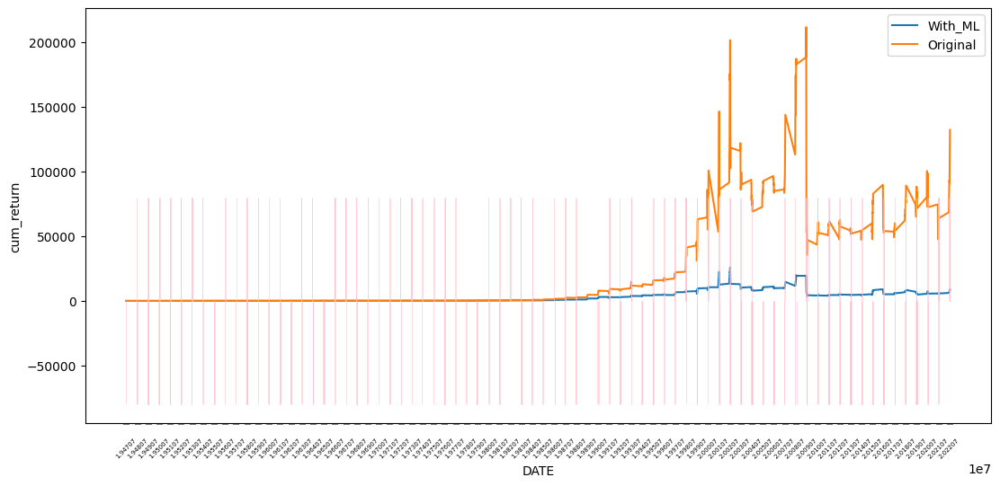

In [32]:
GBC_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.74511

최근 누적 수익률

  2022년-12월 -> 7885.20
  2022년-11월 -> 7247.28
  2022년-10월 -> 7181.97
  2022년-09월 -> 6651.88
  2022년-08월 -> 6445.95

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 11958.05
  2등 : 2009년-02월 -> 11732.19
  3등 : 2008년-11월 -> 11719.50
  4등 : 2009년-01월 -> 11521.70
  5등 : 2008년-12월 -> 11450.82
  6등 : 2008년-10월 -> 10755.30
  7등 : 2002년-07월 -> 10425.09
  8등 : 2008년-09월 -> 10302.78
  9등 : 2002년-08월 -> 10178.28
  10등 : 2002년-06월 -> 10152.93



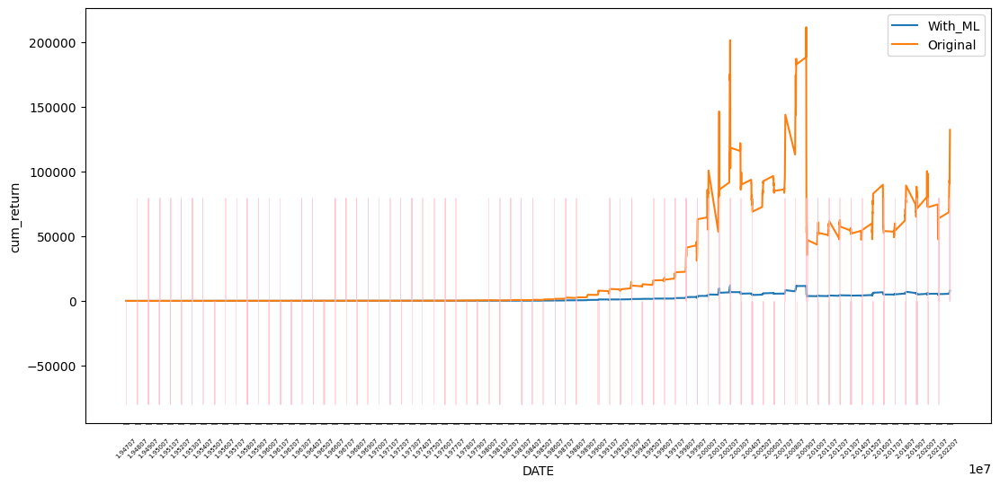

In [33]:
GBC_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PROB_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

### XGB

In [34]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
 

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.36      0.39       316
         1.0       0.68      0.73      0.70       590

    accuracy                           0.60       906
   macro avg       0.55      0.54      0.54       906
weighted avg       0.59      0.60      0.59       906


accuracy : 0.5993377483443708

precision : 0.6798732171156894

recall : 0.7271186440677966

F1-Score : 0.7027027027027026



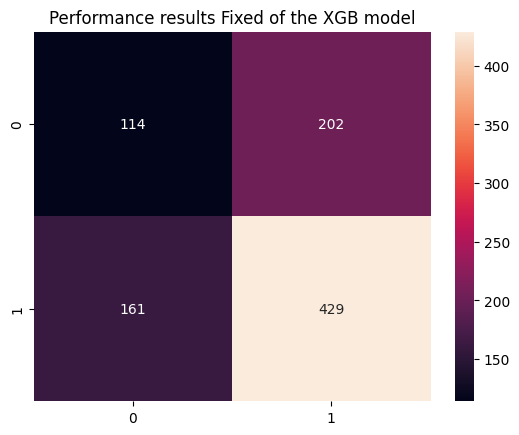


Feature Importance of the model



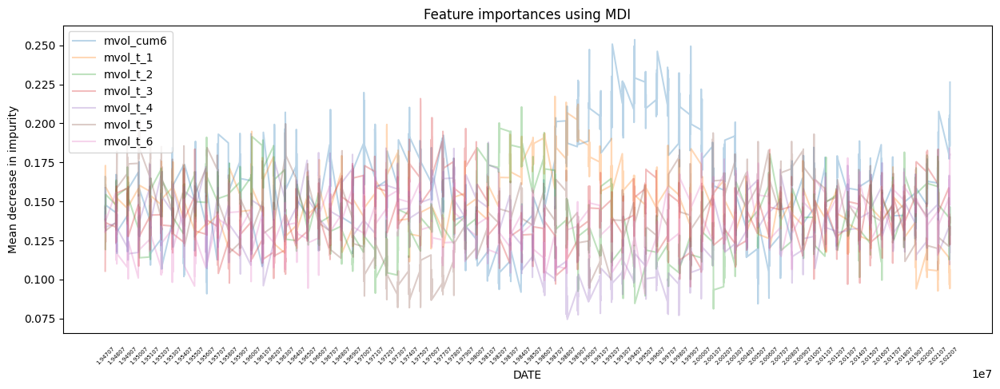

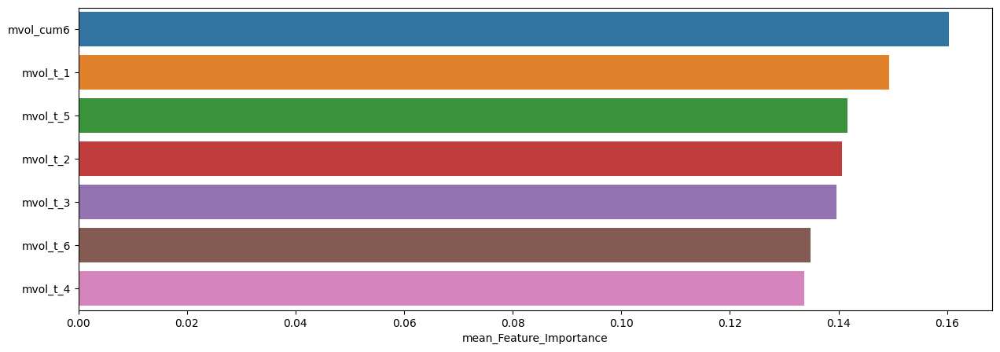

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.160289,0.253634,0.084400
mvol_t_1,0.149380,0.217327,0.092622
mvol_t_5,0.141580,0.202467,0.081904
mvol_t_2,0.140665,0.210563,0.081128
mvol_t_3,0.139636,0.215873,0.095334
mvol_t_6,0.134785,0.184123,0.090705
mvol_t_4,0.133663,0.187872,0.074435


In [35]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.35      0.37        75
         1.0       0.70      0.75      0.72       151

    accuracy                           0.62       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.60      0.62      0.61       226


accuracy : 0.6150442477876106

precision : 0.6975308641975309

recall : 0.7483443708609272

F1-Score : 0.7220447284345048



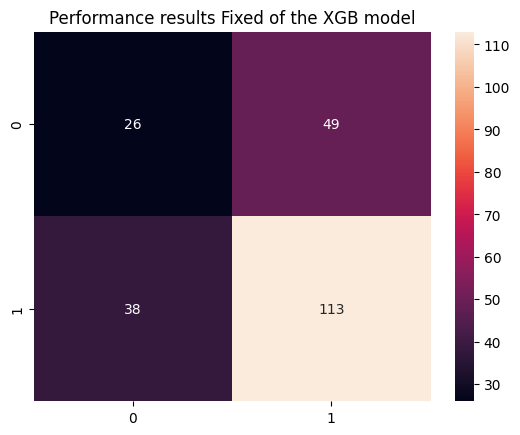


Feature Importance of the model



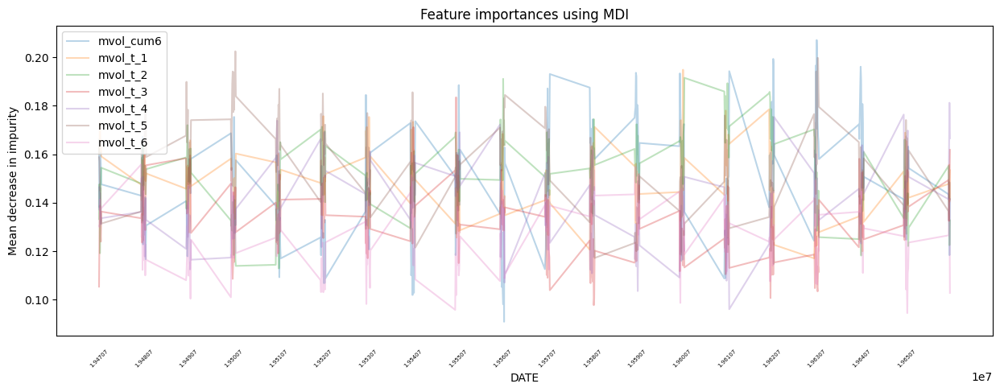

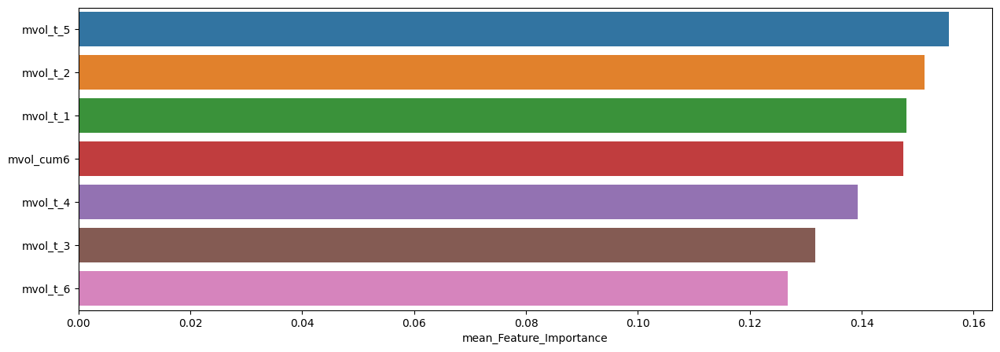

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.155541,0.202467,0.114712
mvol_t_2,0.151200,0.191517,0.112843
mvol_t_1,0.148055,0.194858,0.117013
mvol_cum6,0.147383,0.207117,0.090833
mvol_t_4,0.139331,0.181216,0.096016
mvol_t_3,0.131681,0.183497,0.097676
mvol_t_6,0.126809,0.161790,0.094400



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.47      0.40      0.43        75
         1.0       0.72      0.77      0.75       151

    accuracy                           0.65       226
   macro avg       0.60      0.59      0.59       226
weighted avg       0.64      0.65      0.64       226


accuracy : 0.6504424778761062

precision : 0.7222222222222222

recall : 0.7748344370860927

F1-Score : 0.7476038338658147



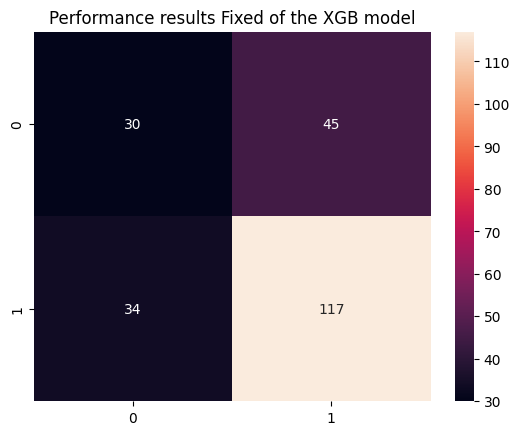


Feature Importance of the model



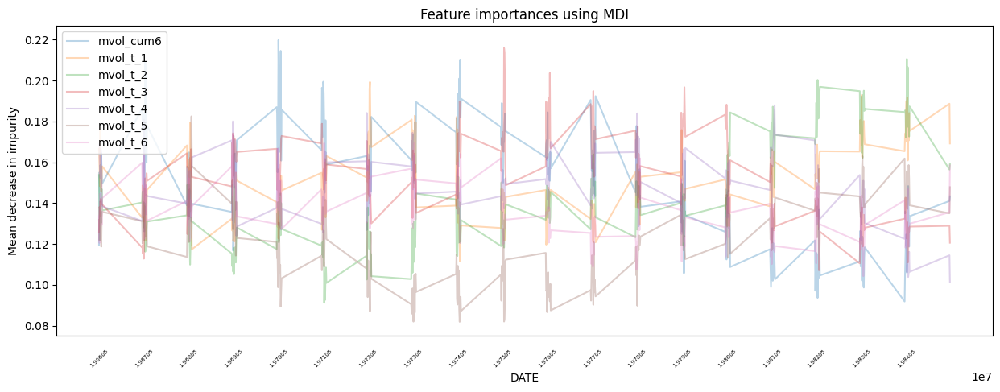

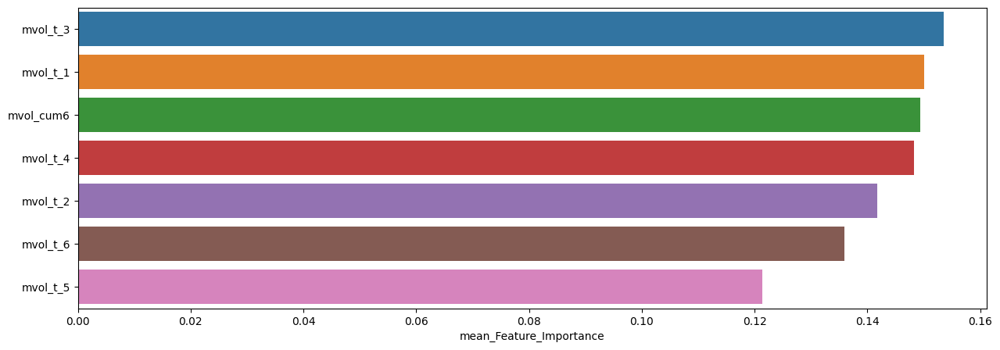

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.153485,0.215873,0.107113
mvol_t_1,0.149999,0.199294,0.111412
mvol_cum6,0.149332,0.219776,0.091856
mvol_t_4,0.148230,0.187872,0.101335
mvol_t_2,0.141790,0.210563,0.091178
mvol_t_6,0.135859,0.173746,0.104266
mvol_t_5,0.121304,0.182464,0.081904



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.34      0.35        70
         1.0       0.71      0.71      0.71       156

    accuracy                           0.60       226
   macro avg       0.53      0.53      0.53       226
weighted avg       0.60      0.60      0.60       226


accuracy : 0.5973451327433629

precision : 0.7070063694267515

recall : 0.7115384615384616

F1-Score : 0.7092651757188498



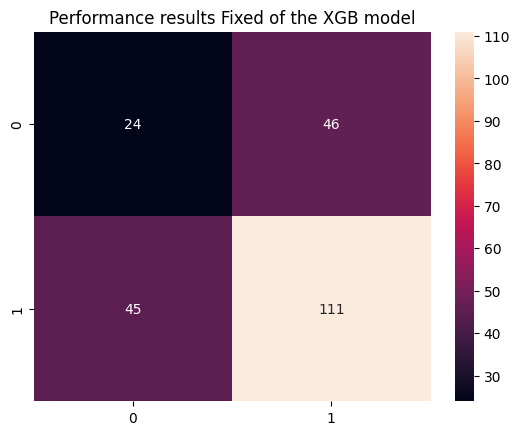


Feature Importance of the model



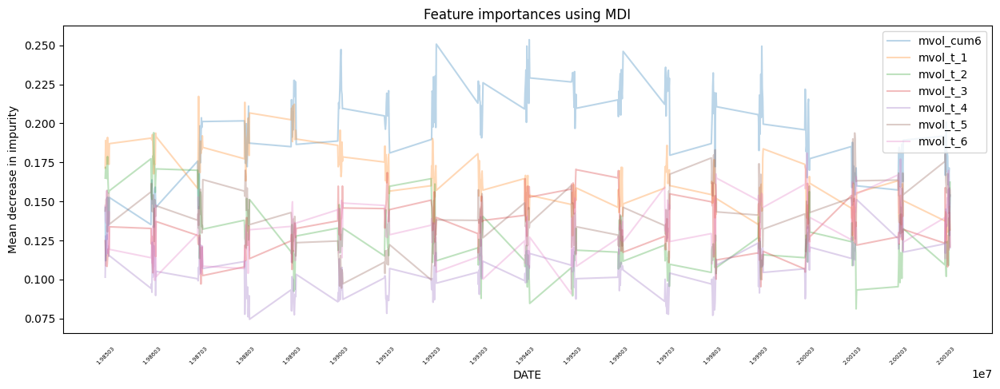

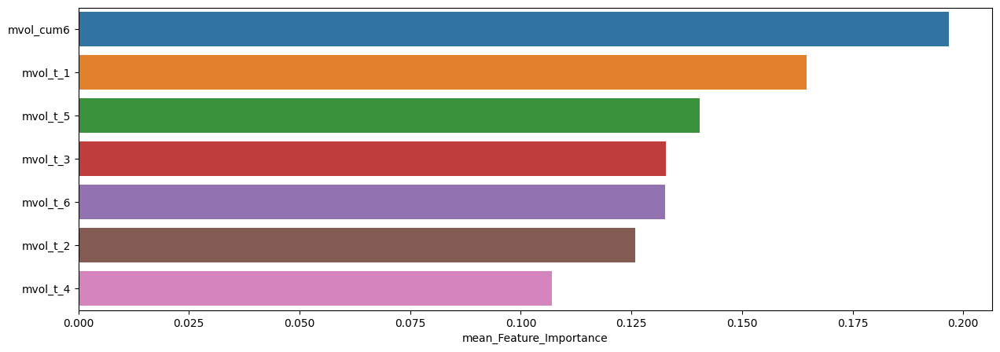

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.196702,0.253634,0.111984
mvol_t_1,0.164523,0.217327,0.123157
mvol_t_5,0.140347,0.193855,0.094448
mvol_t_3,0.132841,0.170611,0.095334
mvol_t_6,0.132596,0.180919,0.090705
mvol_t_2,0.125880,0.194085,0.081128
mvol_t_4,0.107110,0.158471,0.074435



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.35      0.39        96
         1.0       0.59      0.67      0.62       132

    accuracy                           0.54       228
   macro avg       0.51      0.51      0.51       228
weighted avg       0.52      0.54      0.53       228


accuracy : 0.5350877192982456

precision : 0.5866666666666667

recall : 0.6666666666666666

F1-Score : 0.6241134751773049



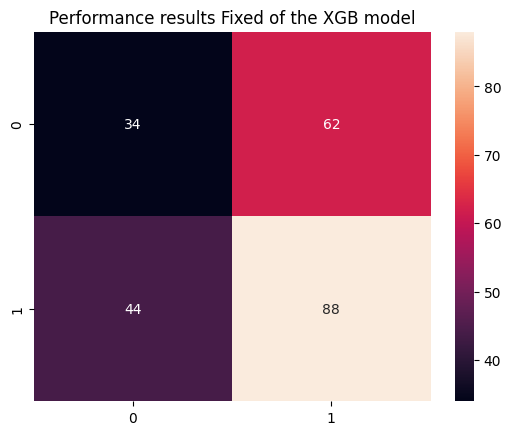


Feature Importance of the model



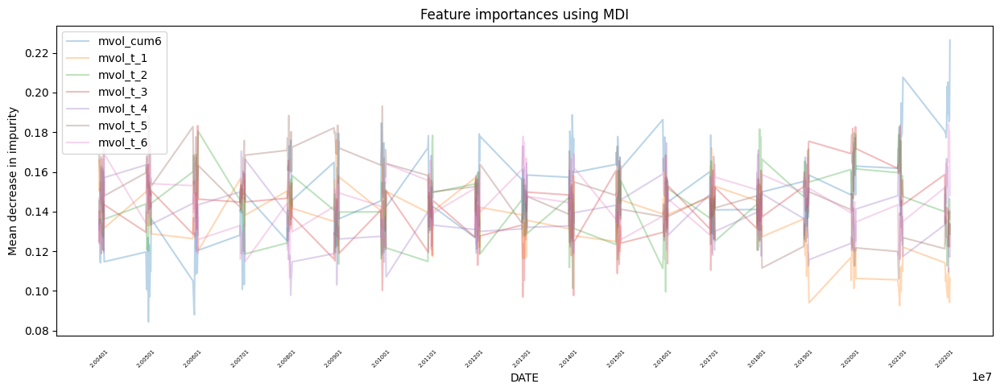

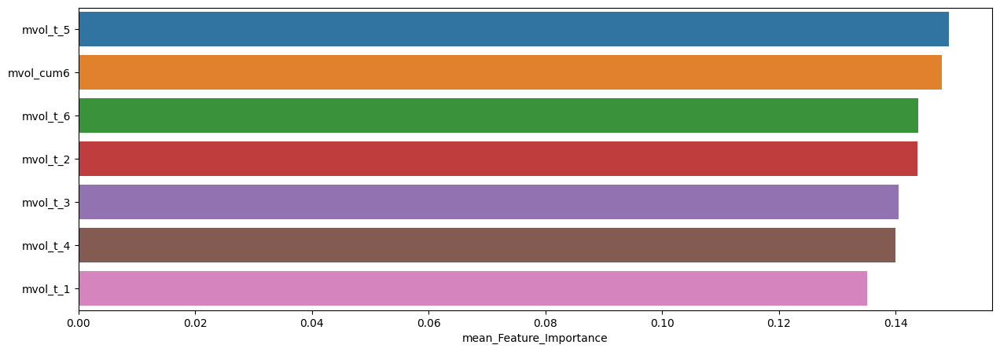

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.149063,0.193125,0.106092
mvol_cum6,0.147850,0.226409,0.084400
mvol_t_6,0.143797,0.184123,0.106387
mvol_t_2,0.143761,0.181534,0.099532
mvol_t_3,0.140530,0.183466,0.096927
mvol_t_4,0.139927,0.174696,0.097802
mvol_t_1,0.135071,0.176059,0.092622


In [36]:
slice_feature_importance(Fixed_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



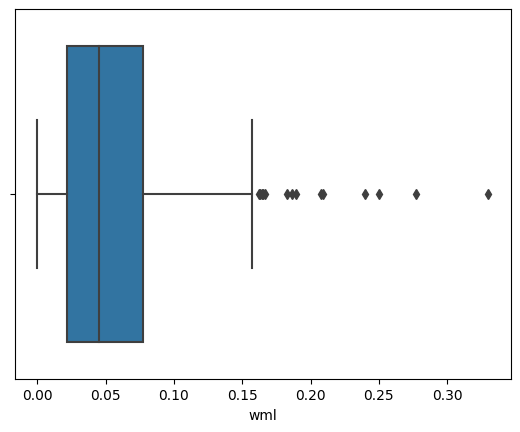

,count,mean,std,min,25%,50%,75%,max
wml,429.0,0.054882,0.045787,0.000007,0.021888,0.045038,0.077097,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



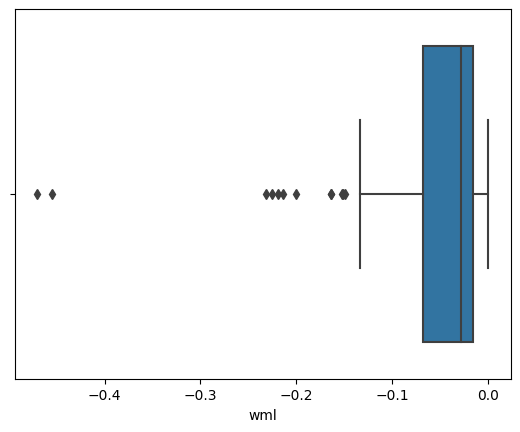

,count,mean,std,min,25%,50%,75%,max
wml,114.0,-0.057508,0.076039,-0.469903,-0.068203,-0.028699,-0.015951,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



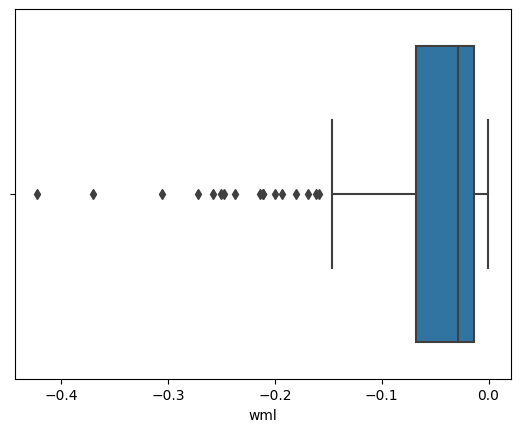

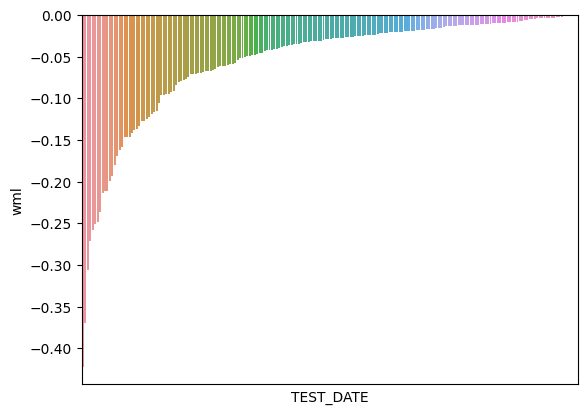

,count,mean,std,min,25%,50%,75%,max
wml,202.0,-0.055635,0.068561,-0.4224,-0.067796,-0.028501,-0.0134,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



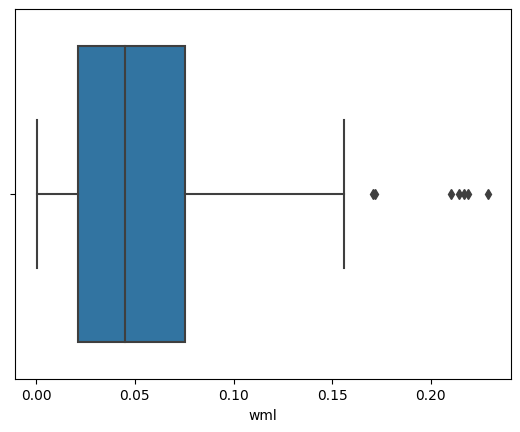

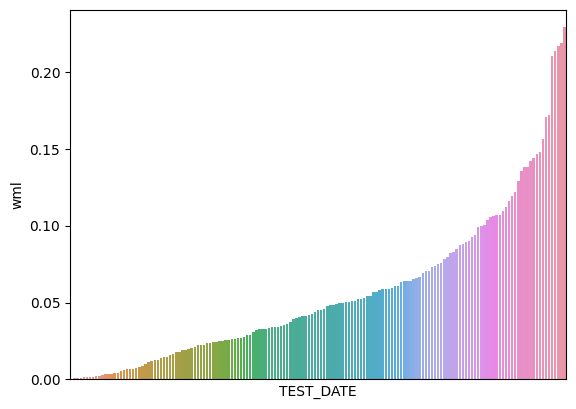

,count,mean,std,min,25%,50%,75%,max
wml,161.0,0.056229,0.049571,0.000577,0.021224,0.045141,0.075549,0.22913


In [37]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Fixed_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.72676

최근 누적 수익률

  2022년-12월 -> 31659.14
  2022년-11월 -> 28524.23
  2022년-10월 -> 28524.23
  2022년-09월 -> 25257.73
  2022년-08월 -> 25257.73

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 53490.19
  2등 : 2001년-09월 -> 52054.13
  3등 : 2002년-08월 -> 45229.06
  4등 : 2002년-07월 -> 45229.06
  5등 : 2002년-10월 -> 43158.55
  6등 : 2001년-08월 -> 43113.50
  7등 : 2002년-06월 -> 42883.16
  8등 : 2001년-10월 -> 39000.98
  9등 : 2002년-02월 -> 38471.82
  10등 : 2001년-07월 -> 37753.75



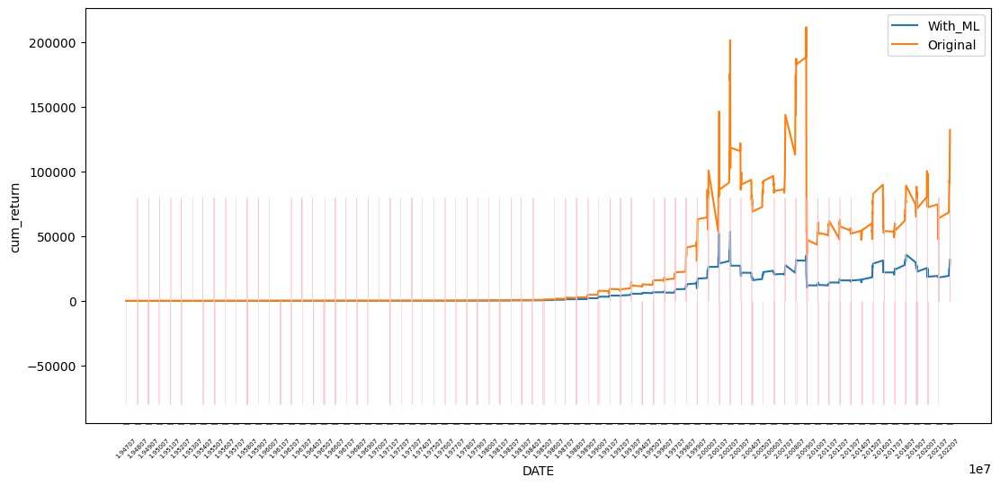

In [38]:
XGB_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.74956

최근 누적 수익률

  2022년-12월 -> 17122.97
  2022년-11월 -> 15674.89
  2022년-10월 -> 15652.41
  2022년-09월 -> 14489.34
  2022년-08월 -> 14446.44

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 27451.40
  2등 : 2001년-09월 -> 24940.23
  3등 : 2002년-07월 -> 23618.77
  4등 : 2002년-08월 -> 23287.35
  5등 : 2009년-02월 -> 23023.78
  6등 : 2002년-06월 -> 22987.58
  7등 : 2002년-10월 -> 22681.10
  8등 : 2008년-11월 -> 21685.79
  9등 : 2001년-08월 -> 21249.06
  10등 : 2009년-01월 -> 21202.21



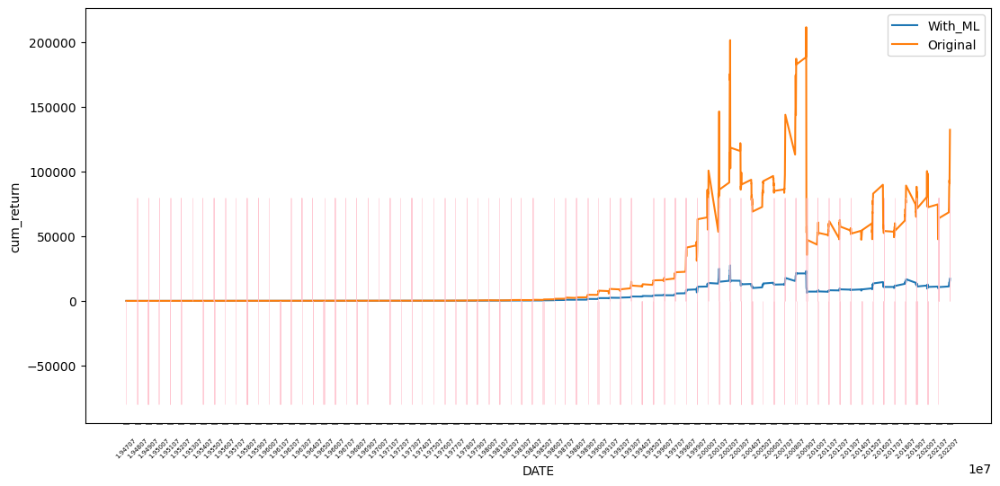

In [39]:
XGB_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [40]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.34      0.37       316
         1.0       0.68      0.74      0.70       590

    accuracy                           0.60       906
   macro avg       0.54      0.54      0.54       906
weighted avg       0.58      0.60      0.59       906


accuracy : 0.5982339955849889

precision : 0.67601246105919

recall : 0.735593220338983

F1-Score : 0.7045454545454545



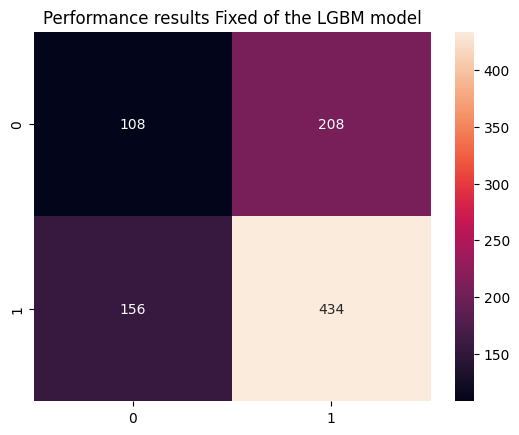


Feature Importance of the model



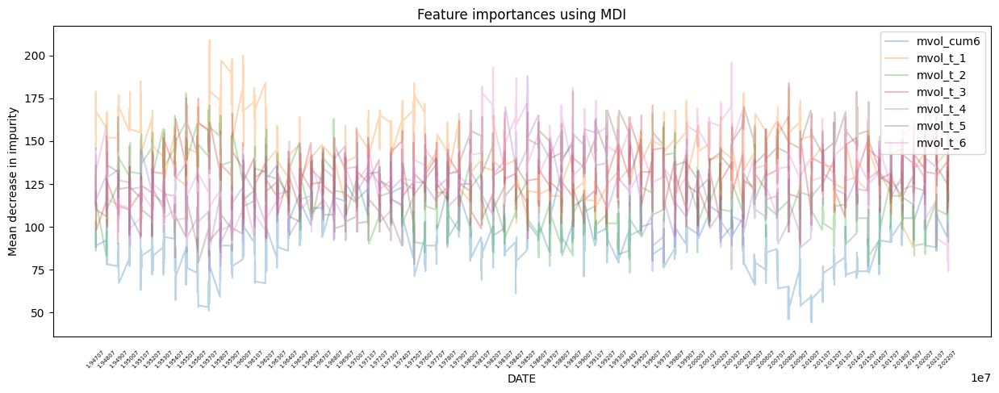

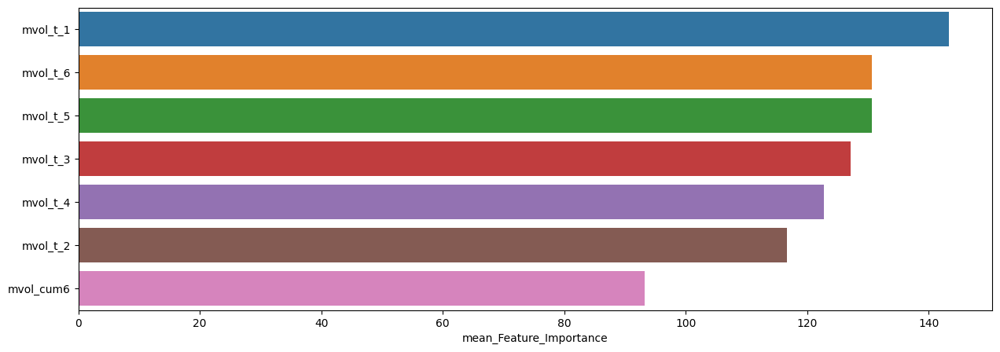

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,143.271523,209,88
mvol_t_6,130.633554,196,74
mvol_t_5,130.610375,184,78
mvol_t_3,127.098234,175,90
mvol_t_4,122.731788,188,74
mvol_t_2,116.605960,178,73
mvol_cum6,93.184327,149,44


In [41]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.35      0.36        75
         1.0       0.69      0.72      0.70       151

    accuracy                           0.59       226
   macro avg       0.53      0.53      0.53       226
weighted avg       0.58      0.59      0.59       226


accuracy : 0.5929203539823009

precision : 0.6878980891719745

recall : 0.7152317880794702

F1-Score : 0.7012987012987012



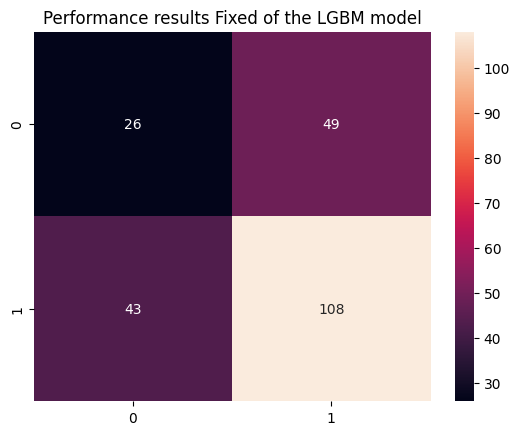


Feature Importance of the model



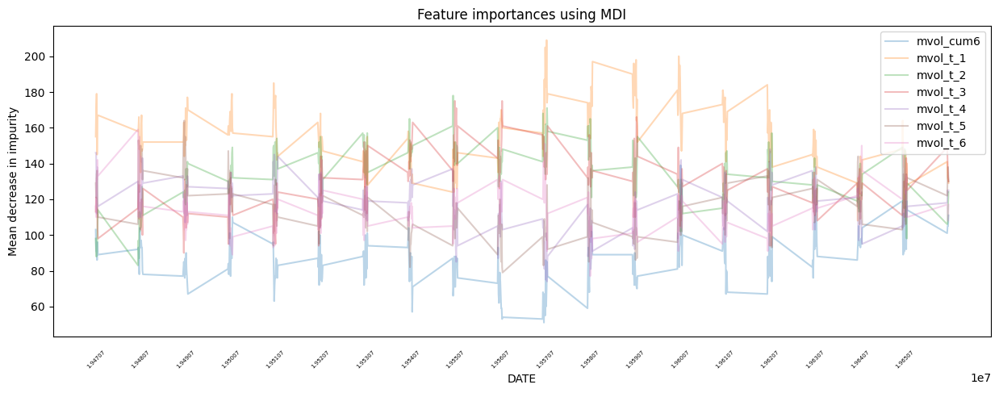

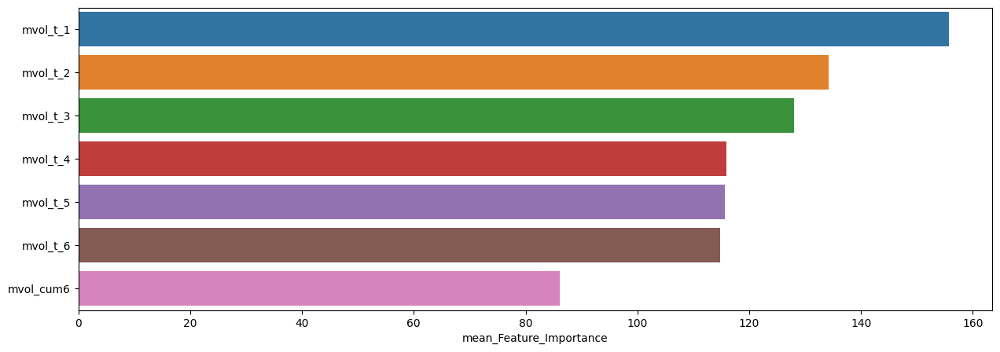

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,155.685841,209,108
mvol_t_2,134.190265,178,83
mvol_t_3,128.066372,175,90
mvol_t_4,115.920354,148,74
mvol_t_5,115.659292,164,79
mvol_t_6,114.805310,159,77
mvol_cum6,86.128319,139,51



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.33      0.36        75
         1.0       0.69      0.75      0.72       151

    accuracy                           0.61       226
   macro avg       0.55      0.54      0.54       226
weighted avg       0.59      0.61      0.60       226


accuracy : 0.6106194690265486

precision : 0.6932515337423313

recall : 0.7483443708609272

F1-Score : 0.7197452229299364



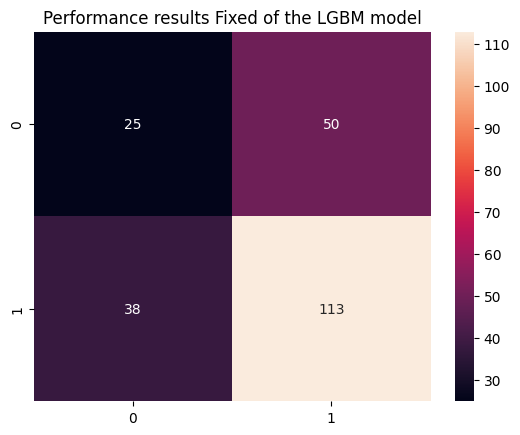


Feature Importance of the model



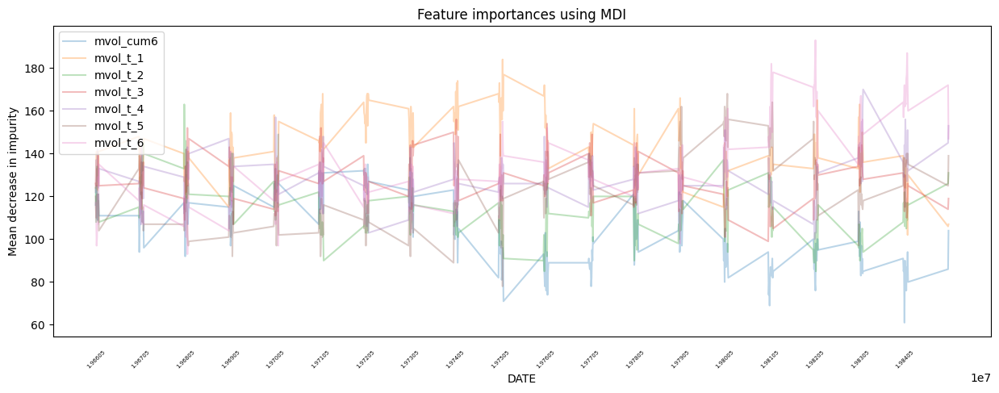

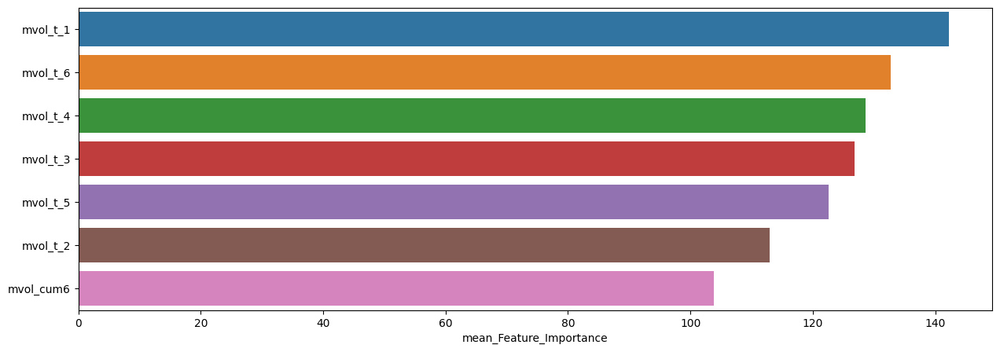

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,142.199115,184,102
mvol_t_6,132.769912,193,93
mvol_t_4,128.610619,170,100
mvol_t_3,126.840708,156,99
mvol_t_5,122.619469,168,78
mvol_t_2,112.889381,163,85
mvol_cum6,103.778761,149,61



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.36      0.39        70
         1.0       0.73      0.78      0.76       156

    accuracy                           0.65       226
   macro avg       0.58      0.57      0.57       226
weighted avg       0.64      0.65      0.64       226


accuracy : 0.6504424778761062

precision : 0.7305389221556886

recall : 0.782051282051282

F1-Score : 0.7554179566563467



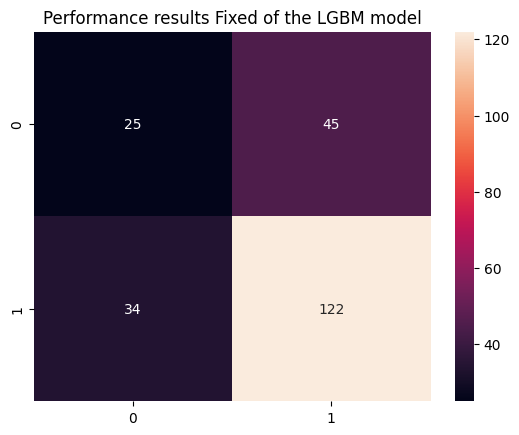


Feature Importance of the model



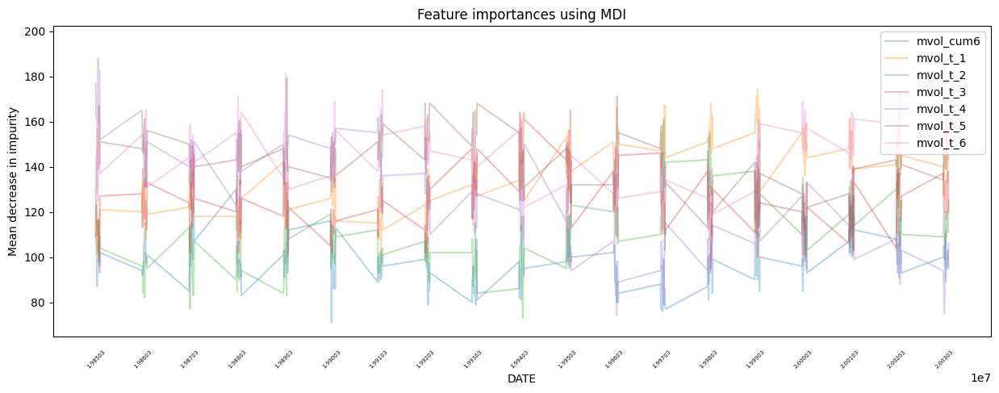

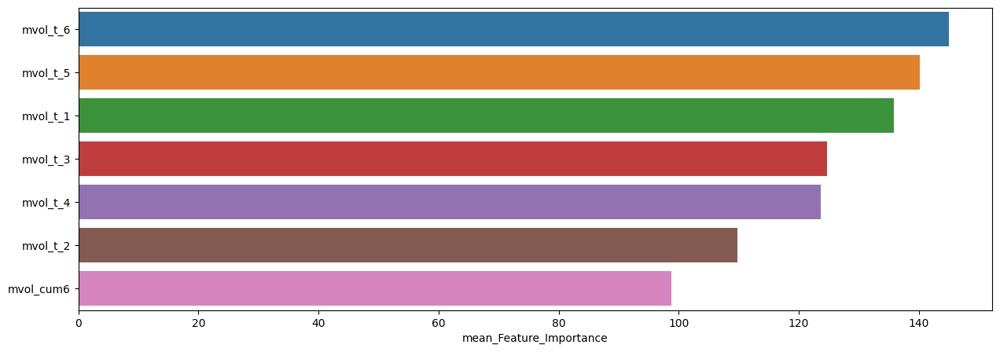

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_6,144.977876,196,106
mvol_t_5,140.123894,179,101
mvol_t_1,135.867257,174,100
mvol_t_3,124.650442,165,93
mvol_t_4,123.632743,188,74
mvol_t_2,109.796460,161,73
mvol_cum6,98.823009,130,71



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.33      0.38        96
         1.0       0.59      0.69      0.63       132

    accuracy                           0.54       228
   macro avg       0.51      0.51      0.51       228
weighted avg       0.52      0.54      0.53       228


accuracy : 0.5394736842105263

precision : 0.5870967741935483

recall : 0.6893939393939394

F1-Score : 0.6341463414634146



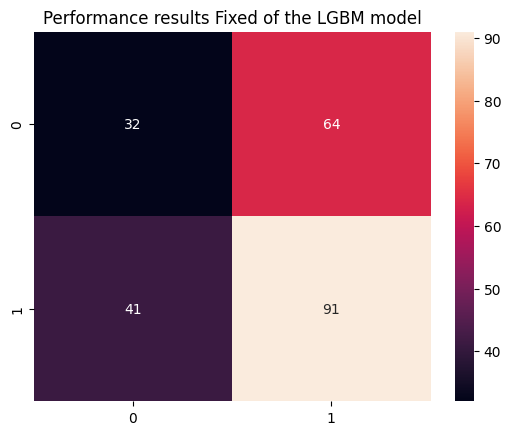


Feature Importance of the model



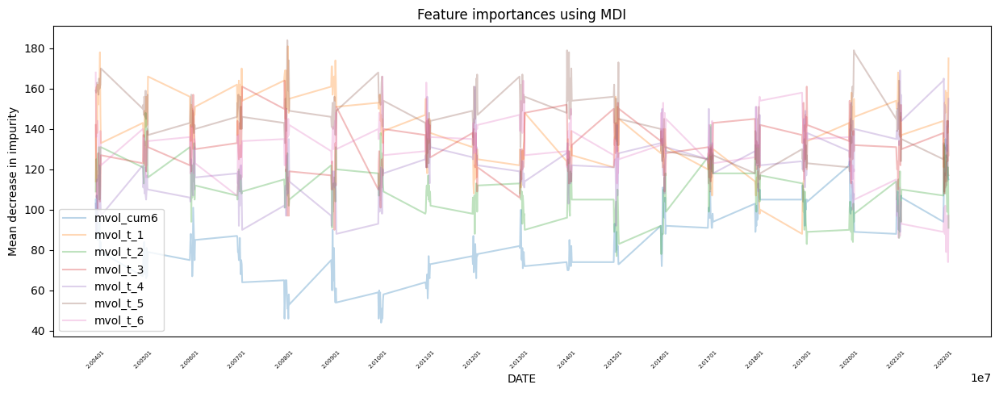

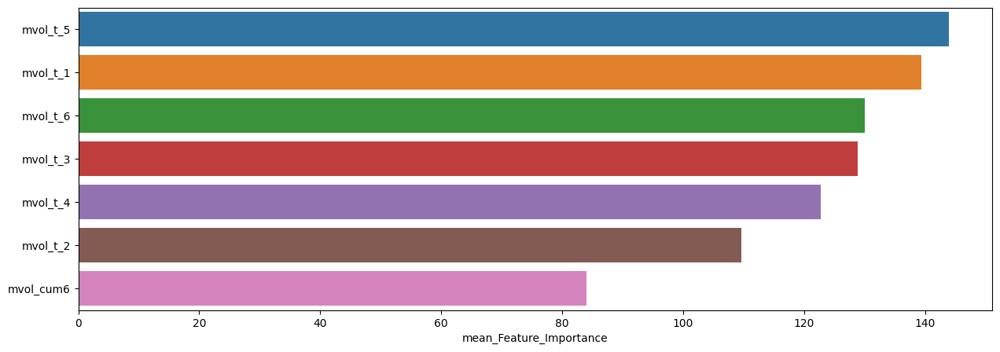

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,143.921053,184,109
mvol_t_1,139.368421,181,88
mvol_t_6,129.986842,168,74
mvol_t_3,128.820175,164,90
mvol_t_4,122.763158,169,88
mvol_t_2,109.609649,148,77
mvol_cum6,84.087719,135,44


In [42]:
slice_feature_importance(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Fixed', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



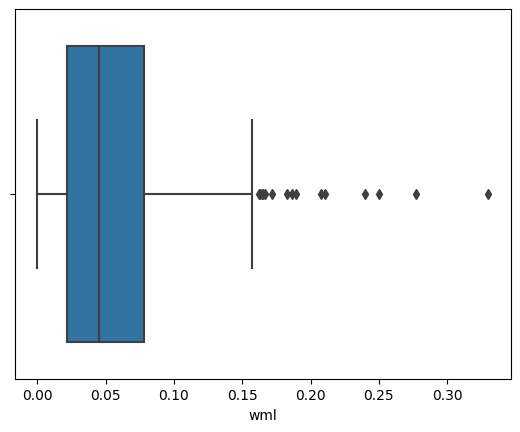

,count,mean,std,min,25%,50%,75%,max
wml,434.0,0.055384,0.046283,0.000007,0.022018,0.044955,0.07798,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



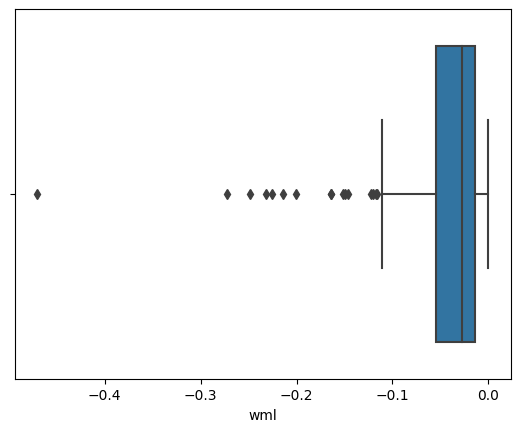

,count,mean,std,min,25%,50%,75%,max
wml,108.0,-0.054712,0.071214,-0.469903,-0.05438,-0.027861,-0.014364,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



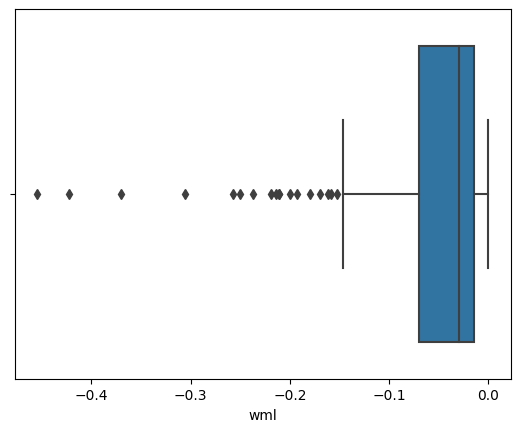

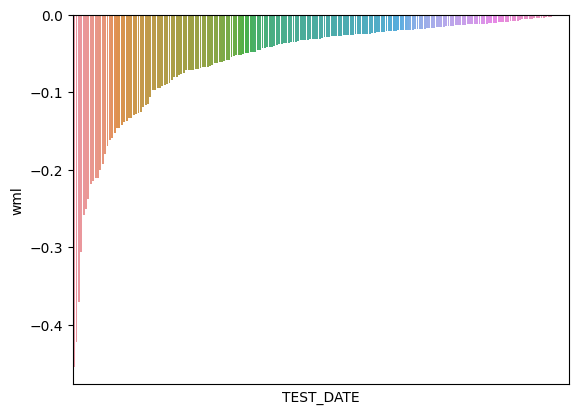

,count,mean,std,min,25%,50%,75%,max
wml,208.0,-0.057141,0.071404,-0.454349,-0.069468,-0.029971,-0.014988,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



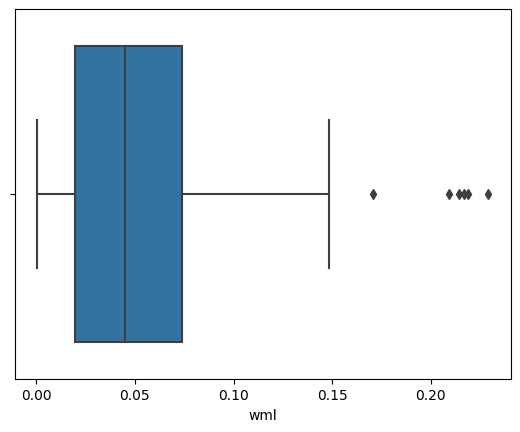

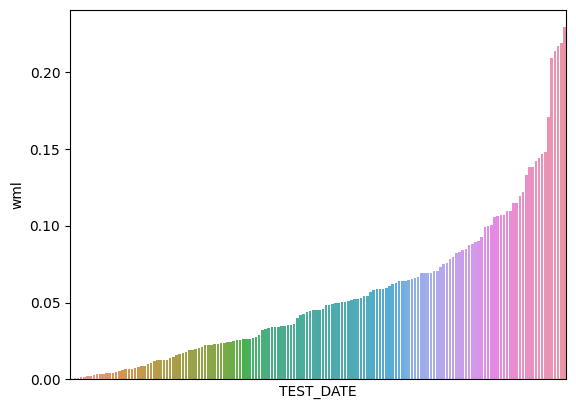

,count,mean,std,min,25%,50%,75%,max
wml,156.0,0.054876,0.048401,0.000577,0.019878,0.045171,0.073822,0.22913


In [43]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Fixed_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.65790

최근 누적 수익률

  2022년-12월 -> 23267.15
  2022년-11월 -> 23267.15
  2022년-10월 -> 23267.15
  2022년-09월 -> 20602.65
  2022년-08월 -> 20602.65

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 49173.40
  2등 : 2009년-01월 -> 43785.53
  3등 : 2008년-11월 -> 43499.93
  4등 : 2008년-12월 -> 42470.31
  5등 : 2002년-09월 -> 39711.82
  6등 : 2008년-07월 -> 39668.21
  7등 : 2008년-08월 -> 39668.21
  8등 : 2008년-09월 -> 39668.21
  9등 : 2008년-06월 -> 39668.21
  10등 : 2008년-10월 -> 39668.21



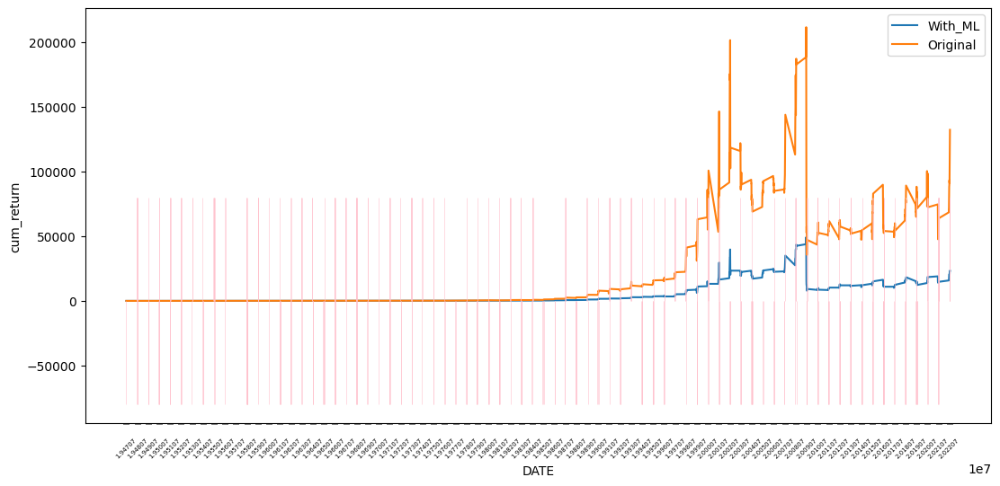

In [44]:
LGBM_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.73353

최근 누적 수익률

  2022년-12월 -> 15431.37
  2022년-11월 -> 14925.19
  2022년-10월 -> 14813.59
  2022년-09월 -> 13783.65
  2022년-08월 -> 13533.17

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 17562.44
  2등 : 2008년-11월 -> 16294.18
  3등 : 2009년-01월 -> 16199.77
  4등 : 2002년-09월 -> 16100.52
  5등 : 2008년-12월 -> 15922.84
  6등 : 2022년-12월 -> 15431.37
  7등 : 2008년-10월 -> 15410.23
  8등 : 2008년-06월 -> 15151.43
  9등 : 2008년-09월 -> 15139.17
  10등 : 2022년-11월 -> 14925.19



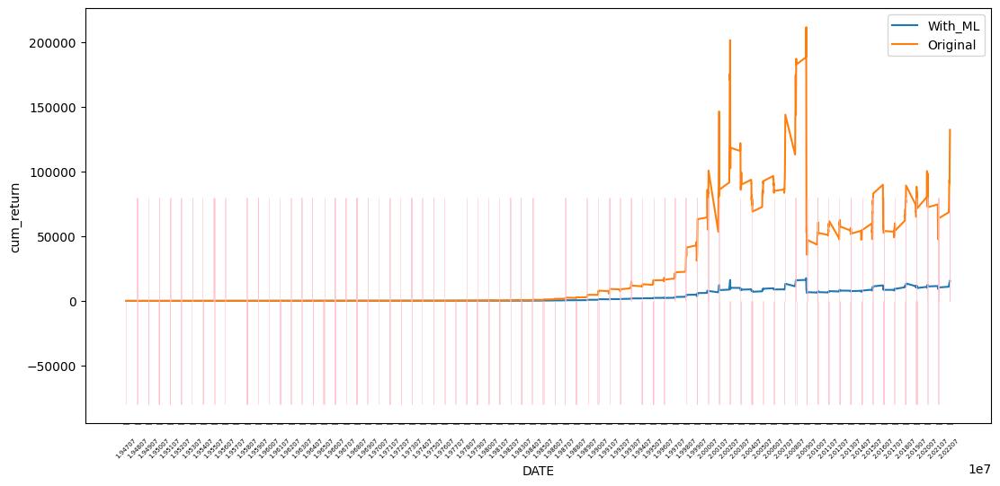

In [45]:
LGBM_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

## Rolling Expanding Windows

### Random Forest

In [46]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.27      0.33       316
         1.0       0.67      0.79      0.73       590

    accuracy                           0.61       906
   macro avg       0.54      0.53      0.53       906
weighted avg       0.58      0.61      0.59       906


accuracy : 0.6103752759381899

precision : 0.6700143472022956

recall : 0.7915254237288135

F1-Score : 0.7257187257187258



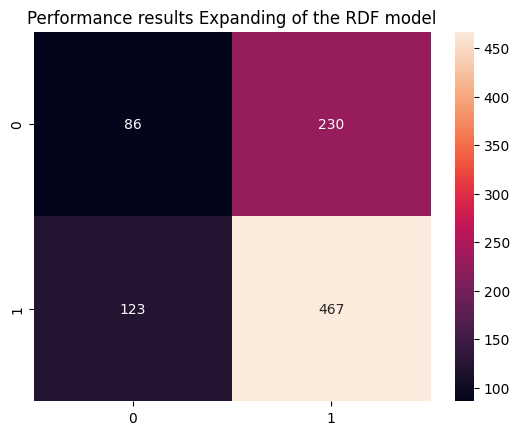


Feature Importance of the model



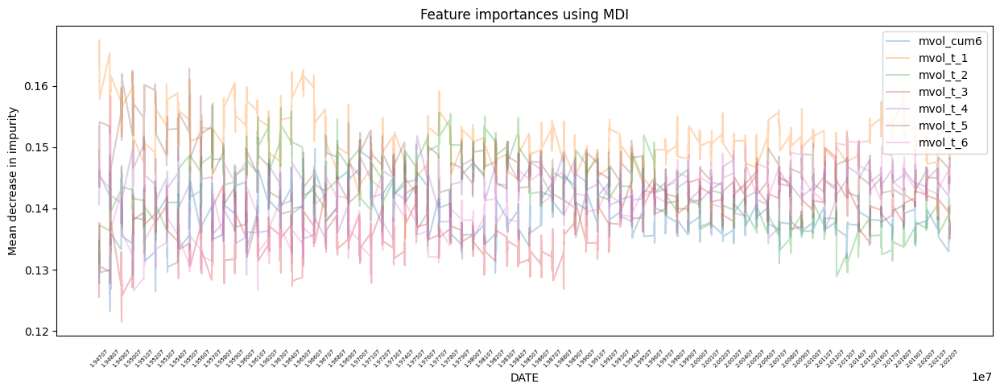

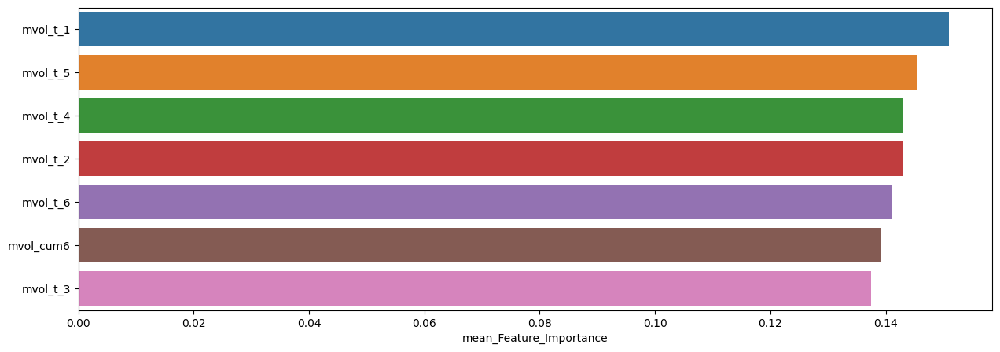

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.150921,0.167455,0.135112
mvol_t_5,0.145485,0.162827,0.132700
mvol_t_4,0.143086,0.151779,0.129141
mvol_t_2,0.142903,0.157119,0.128868
mvol_t_6,0.141087,0.158343,0.126556
mvol_cum6,0.139060,0.153999,0.123199
mvol_t_3,0.137457,0.149851,0.121495


In [47]:
Expanding_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=RDF, # 사용할 모델
                                      model_name='RDF', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.32      0.23      0.27        75
         1.0       0.66      0.76      0.71       151

    accuracy                           0.58       226
   macro avg       0.49      0.49      0.49       226
weighted avg       0.55      0.58      0.56       226


accuracy : 0.584070796460177

precision : 0.6647398843930635

recall : 0.7615894039735099

F1-Score : 0.7098765432098765



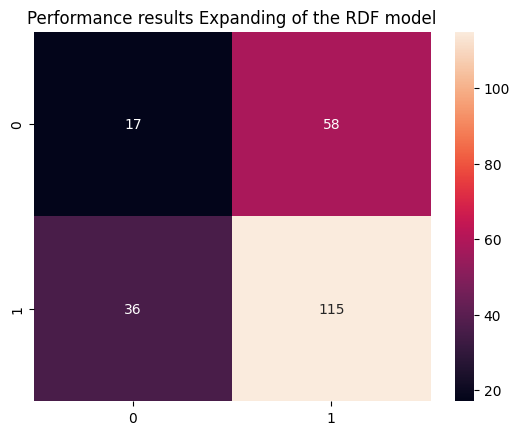


Feature Importance of the model



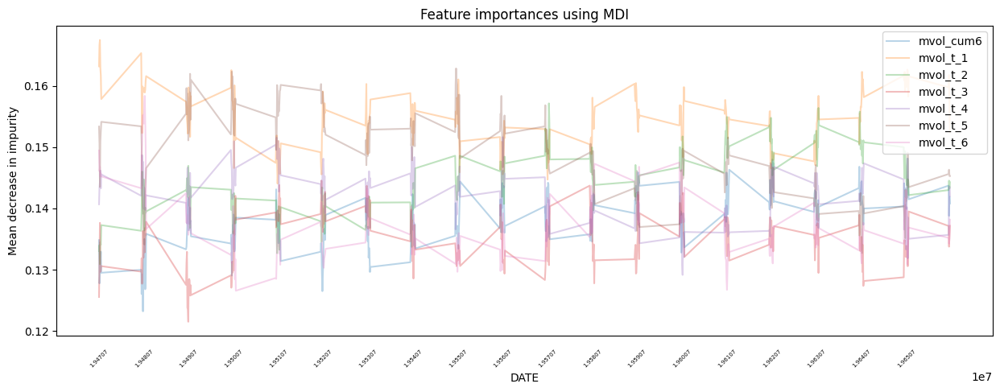

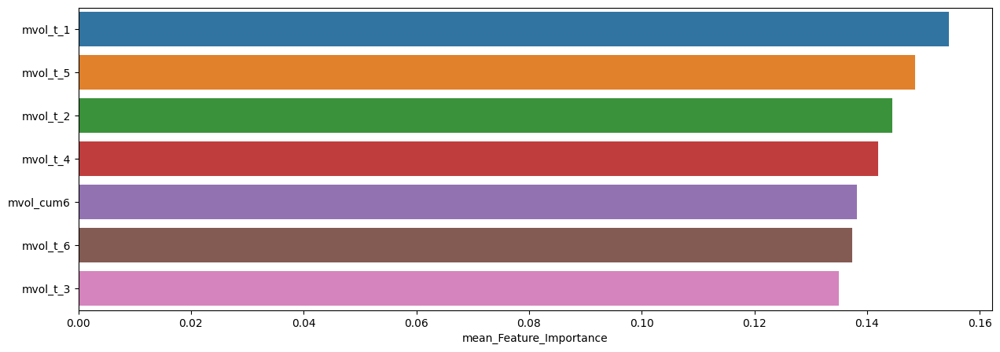

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.154482,0.167455,0.144021
mvol_t_5,0.148491,0.162827,0.132700
mvol_t_2,0.144503,0.157119,0.130905
mvol_t_4,0.142018,0.151620,0.129141
mvol_cum6,0.138126,0.148113,0.123199
mvol_t_6,0.137368,0.158343,0.126556
mvol_t_3,0.135012,0.144517,0.121495



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.29      0.35        75
         1.0       0.70      0.80      0.74       151

    accuracy                           0.63       226
   macro avg       0.56      0.55      0.55       226
weighted avg       0.61      0.63      0.61       226


accuracy : 0.6327433628318584

precision : 0.6954022988505747

recall : 0.8013245033112583

F1-Score : 0.7446153846153847



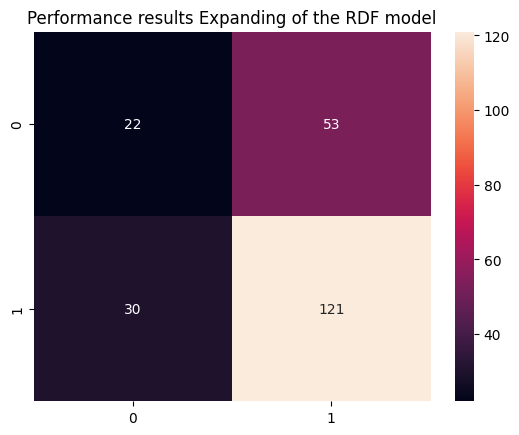


Feature Importance of the model



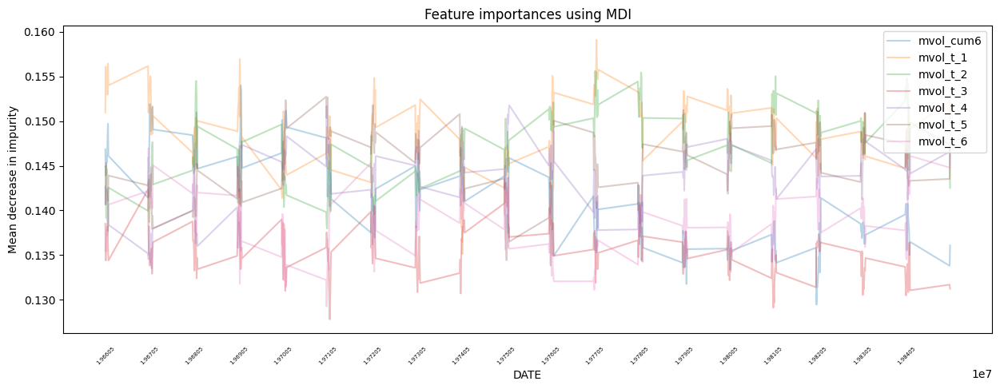

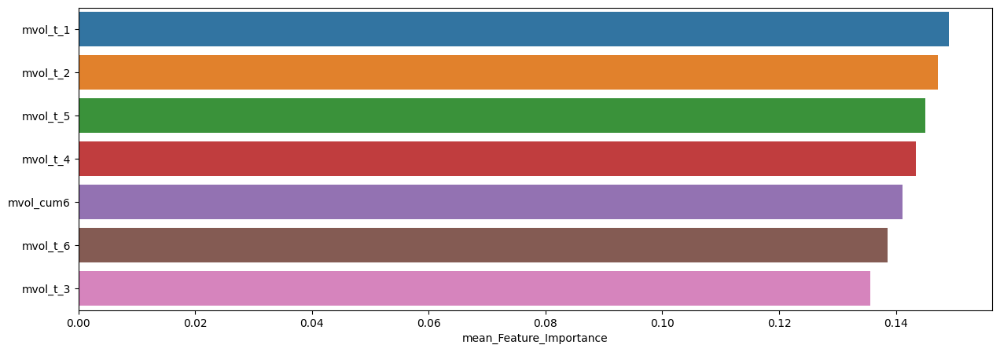

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.149040,0.159109,0.135112
mvol_t_2,0.147204,0.155606,0.137660
mvol_t_5,0.144991,0.152733,0.133825
mvol_t_4,0.143463,0.151779,0.133507
mvol_cum6,0.141079,0.153999,0.129446
mvol_t_6,0.138557,0.146954,0.129235
mvol_t_3,0.135666,0.143704,0.127794



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.43      0.31      0.36        70
         1.0       0.73      0.81      0.77       156

    accuracy                           0.66       226
   macro avg       0.58      0.56      0.57       226
weighted avg       0.63      0.66      0.64       226


accuracy : 0.6592920353982301

precision : 0.7257142857142858

recall : 0.8141025641025641

F1-Score : 0.7673716012084593



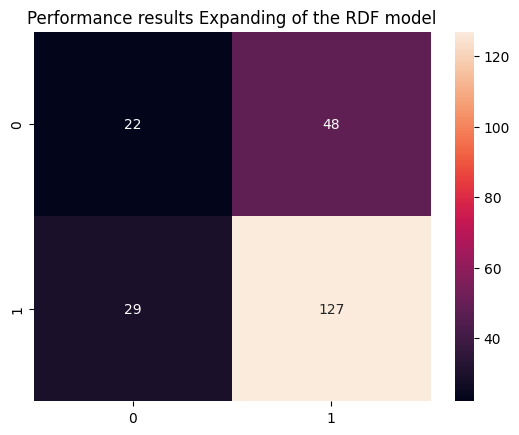


Feature Importance of the model



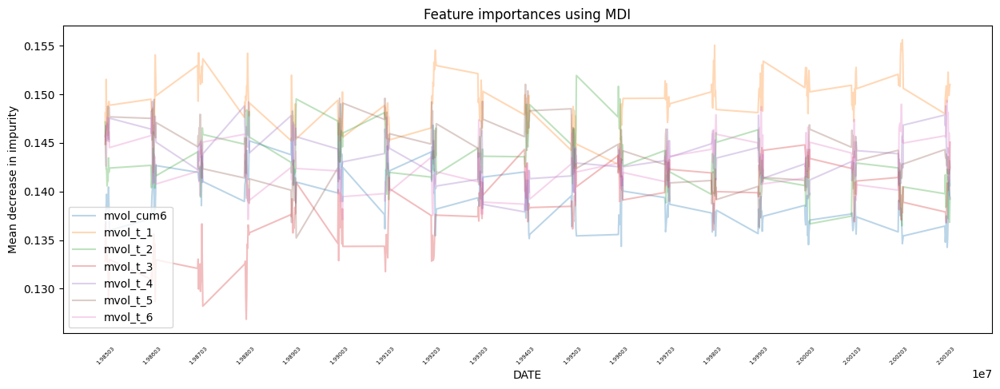

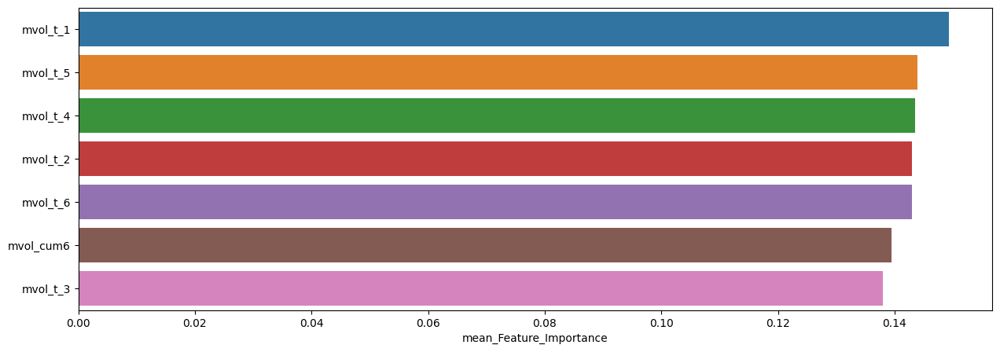

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.149274,0.155602,0.141942
mvol_t_5,0.143870,0.151014,0.135216
mvol_t_4,0.143452,0.149252,0.137899
mvol_t_2,0.142987,0.151925,0.136468
mvol_t_6,0.142930,0.149366,0.137100
mvol_cum6,0.139515,0.148997,0.134245
mvol_t_3,0.137971,0.145065,0.126850



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.47      0.26      0.34        96
         1.0       0.59      0.79      0.68       132

    accuracy                           0.57       228
   macro avg       0.53      0.52      0.51       228
weighted avg       0.54      0.57      0.53       228


accuracy : 0.5657894736842105

precision : 0.5942857142857143

recall : 0.7878787878787878

F1-Score : 0.6775244299674267



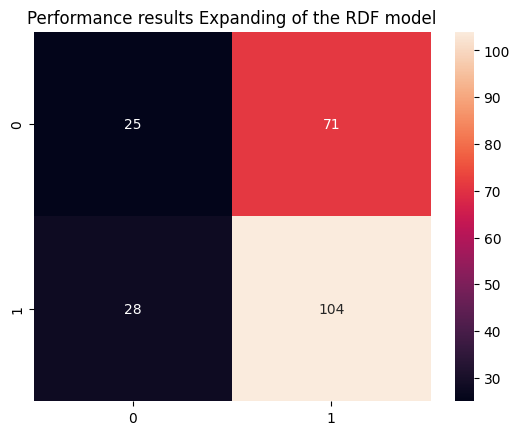


Feature Importance of the model



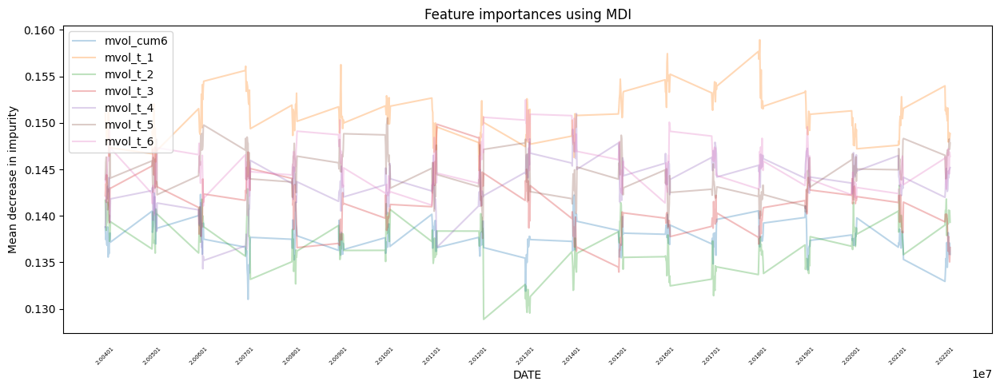

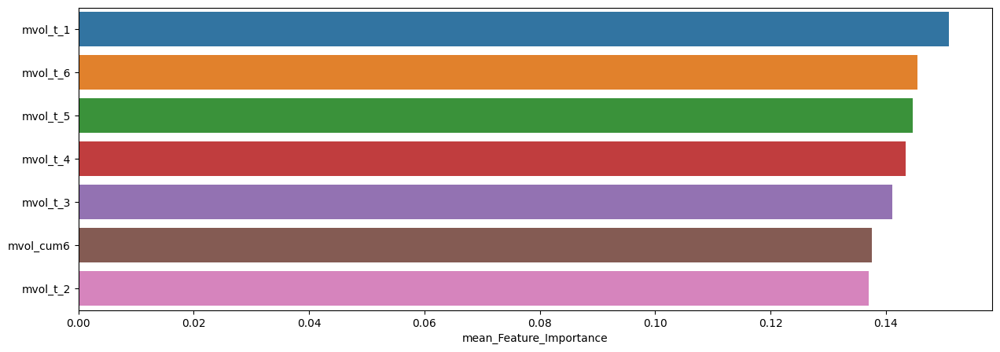

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.150888,0.158931,0.144886
mvol_t_6,0.145456,0.152482,0.140046
mvol_t_5,0.144597,0.150523,0.137581
mvol_t_4,0.143410,0.150999,0.134315
mvol_t_3,0.141149,0.149851,0.133956
mvol_cum6,0.137533,0.142448,0.131021
mvol_t_2,0.136968,0.143267,0.128868


In [48]:
slice_feature_importance(Expanding_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



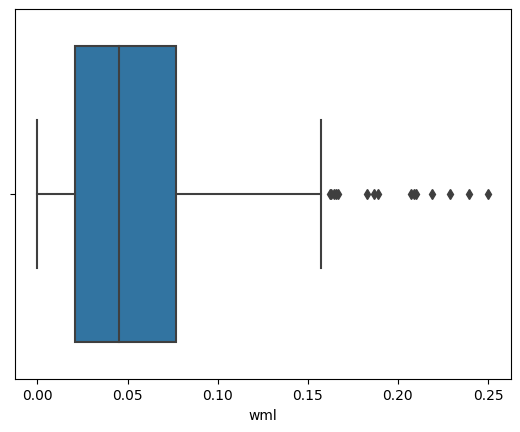

,count,mean,std,min,25%,50%,75%,max
wml,467.0,0.05482,0.044682,0.000007,0.020806,0.045201,0.076866,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



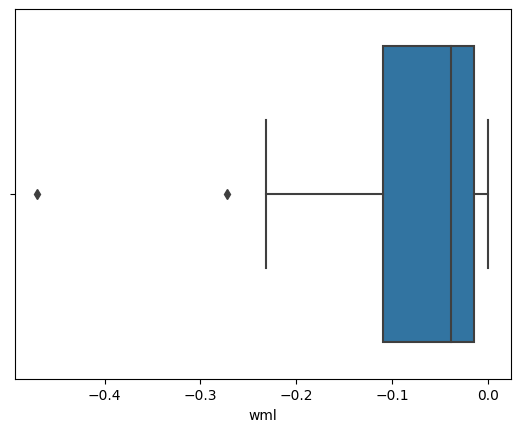

,count,mean,std,min,25%,50%,75%,max
wml,86.0,-0.07019,0.079226,-0.469903,-0.110216,-0.039343,-0.014831,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



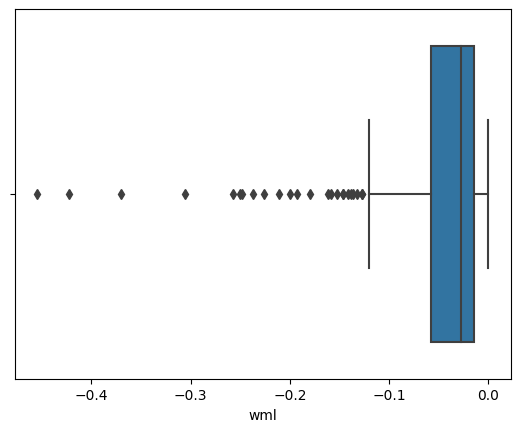

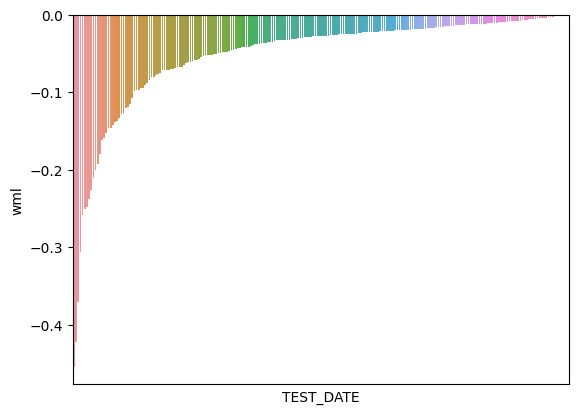

,count,mean,std,min,25%,50%,75%,max
wml,230.0,-0.051121,0.067461,-0.454349,-0.058177,-0.027297,-0.014757,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



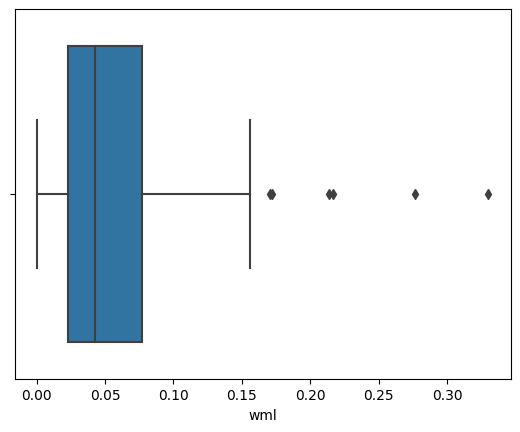

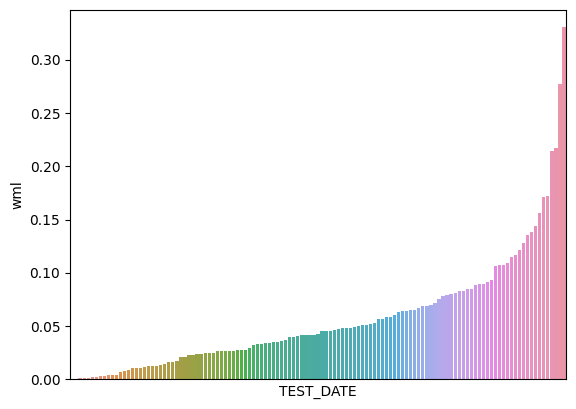

,count,mean,std,min,25%,50%,75%,max
wml,123.0,0.05688,0.054315,0.000577,0.023229,0.042611,0.076854,0.330163


In [49]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Expanding_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.57170

최근 누적 수익률

  2022년-12월 -> 127595.49
  2022년-11월 -> 114961.21
  2022년-10월 -> 114961.21
  2022년-09월 -> 101796.57
  2022년-08월 -> 92548.14

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 127595.49
  2등 : 2022년-11월 -> 114961.21
  3등 : 2022년-10월 -> 114961.21
  4등 : 2022년-09월 -> 101796.57
  5등 : 2022년-07월 -> 94616.06
  6등 : 2022년-08월 -> 92548.14
  7등 : 2022년-06월 -> 90653.28
  8등 : 2022년-05월 -> 90653.28
  9등 : 2022년-04월 -> 85030.97
  10등 : 2022년-03월 -> 74194.71



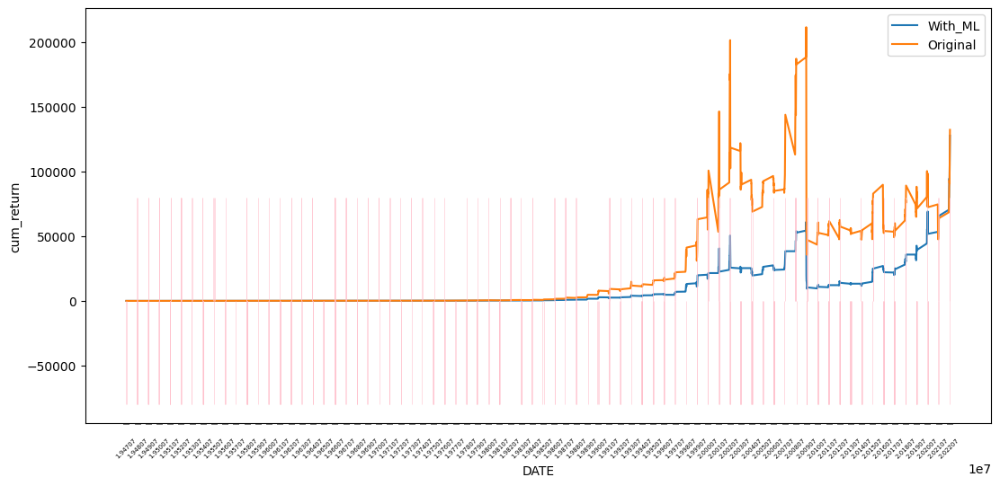

In [50]:
RDF_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.70984

최근 누적 수익률

  2022년-12월 -> 10135.57
  2022년-11월 -> 9498.72
  2022년-10월 -> 9284.41
  2022년-09월 -> 8483.43
  2022년-08월 -> 8064.33

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 10135.57
  2등 : 2022년-11월 -> 9498.72
  3등 : 2009년-02월 -> 9334.01
  4등 : 2022년-10월 -> 9284.41
  5등 : 2008년-11월 -> 8636.56
  6등 : 2009년-01월 -> 8583.99
  7등 : 2022년-09월 -> 8483.43
  8등 : 2008년-12월 -> 8450.51
  9등 : 2022년-07월 -> 8169.69
  10등 : 2022년-08월 -> 8064.33



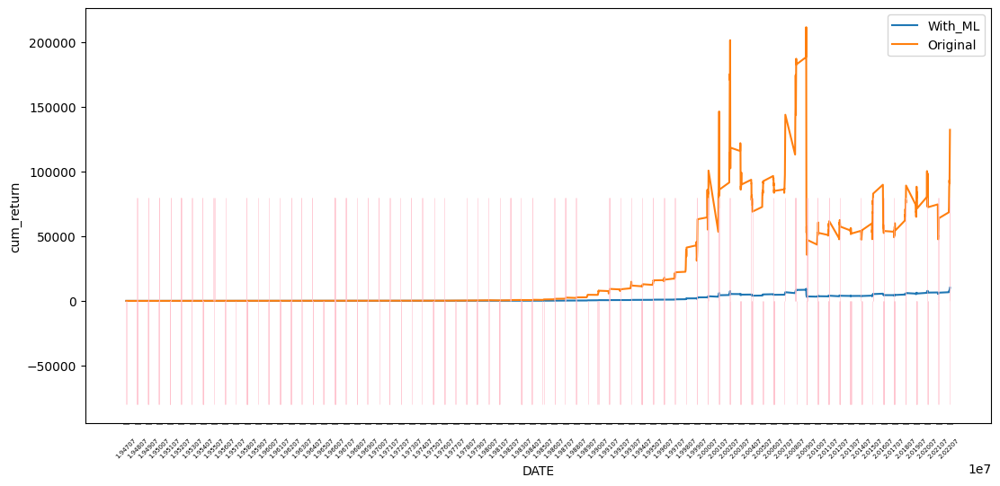

In [51]:
RDF_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [52]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.25      0.31       316
         1.0       0.67      0.81      0.73       590

    accuracy                           0.61       906
   macro avg       0.54      0.53      0.52       906
weighted avg       0.58      0.61      0.59       906


accuracy : 0.6147902869757175

precision : 0.6690042075736325

recall : 0.8084745762711865

F1-Score : 0.7321565617805067



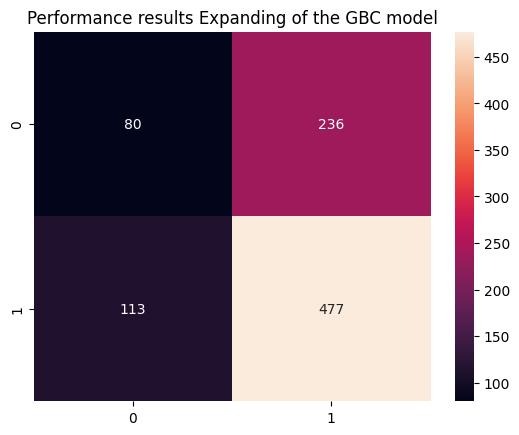


Feature Importance of the model



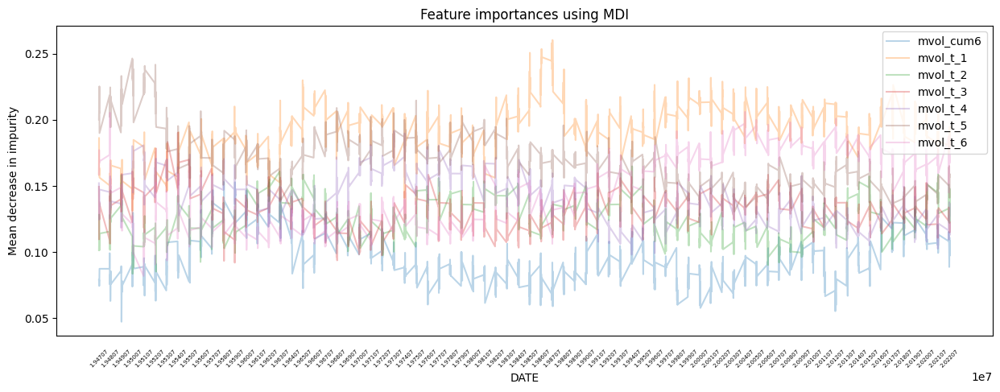

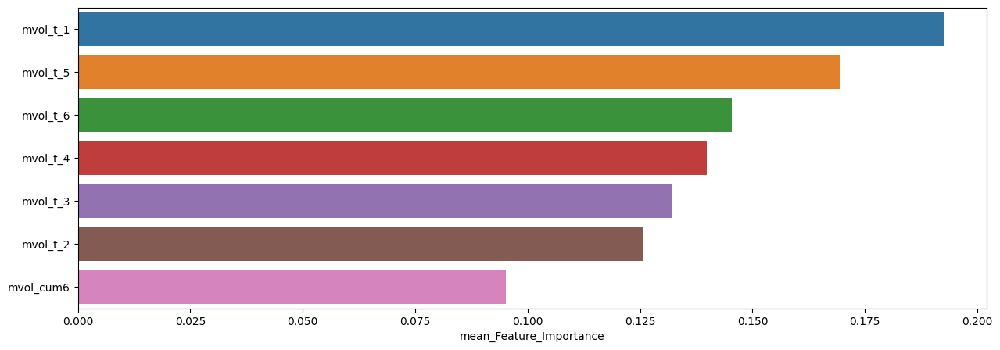

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.192476,0.260297,0.130464
mvol_t_5,0.169372,0.246388,0.124639
mvol_t_6,0.145426,0.206059,0.081935
mvol_t_4,0.139770,0.191523,0.098056
mvol_t_3,0.132113,0.190295,0.092009
mvol_t_2,0.125720,0.164841,0.083640
mvol_cum6,0.095122,0.153133,0.047361


In [53]:
Expanding_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=GBC, # 사용할 모델
                                      model_name='GBC', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.28      0.32        75
         1.0       0.68      0.76      0.72       151

    accuracy                           0.60       226
   macro avg       0.52      0.52      0.52       226
weighted avg       0.58      0.60      0.59       226


accuracy : 0.6017699115044248

precision : 0.6804733727810651

recall : 0.7615894039735099

F1-Score : 0.71875



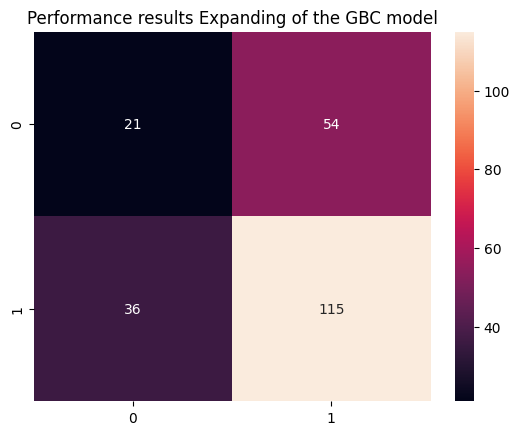


Feature Importance of the model



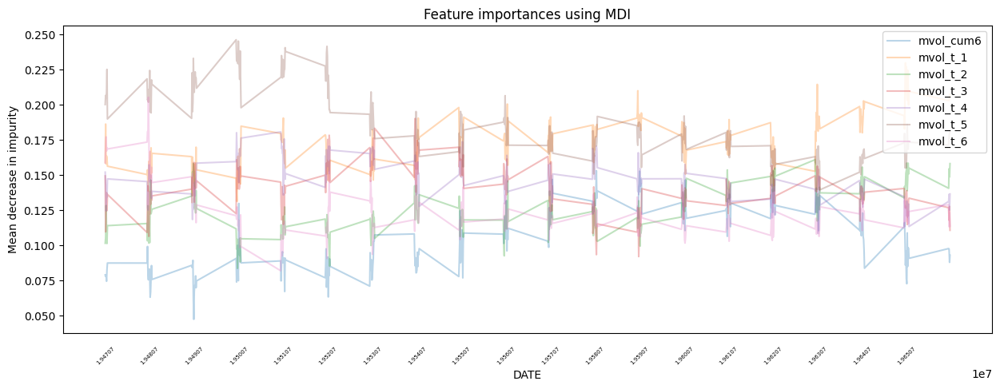

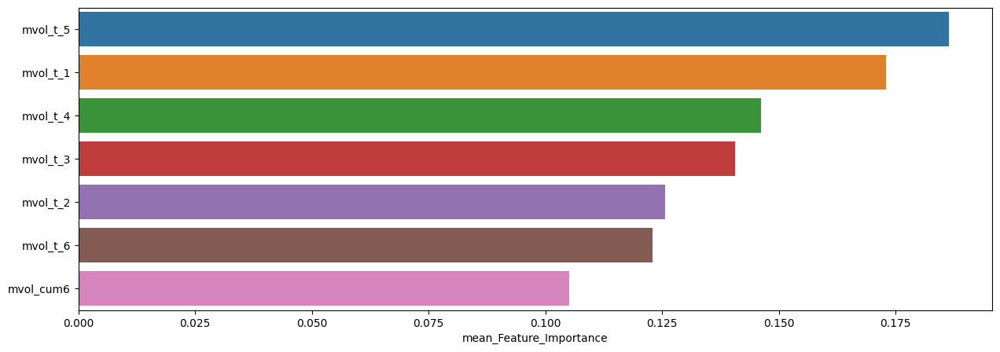

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.186398,0.246388,0.139545
mvol_t_1,0.172913,0.229910,0.130464
mvol_t_4,0.146221,0.180780,0.108412
mvol_t_3,0.140700,0.190295,0.092009
mvol_t_2,0.125648,0.160988,0.083640
mvol_t_6,0.123051,0.205449,0.081935
mvol_cum6,0.105070,0.153133,0.047361



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.47      0.29      0.36        75
         1.0       0.70      0.83      0.76       151

    accuracy                           0.65       226
   macro avg       0.59      0.56      0.56       226
weighted avg       0.63      0.65      0.63       226


accuracy : 0.6548672566371682

precision : 0.7039106145251397

recall : 0.8344370860927153

F1-Score : 0.7636363636363637



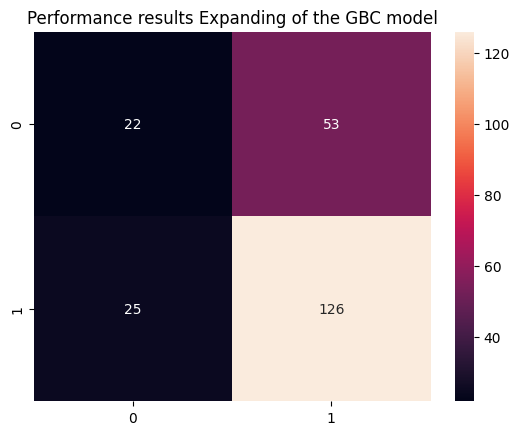


Feature Importance of the model



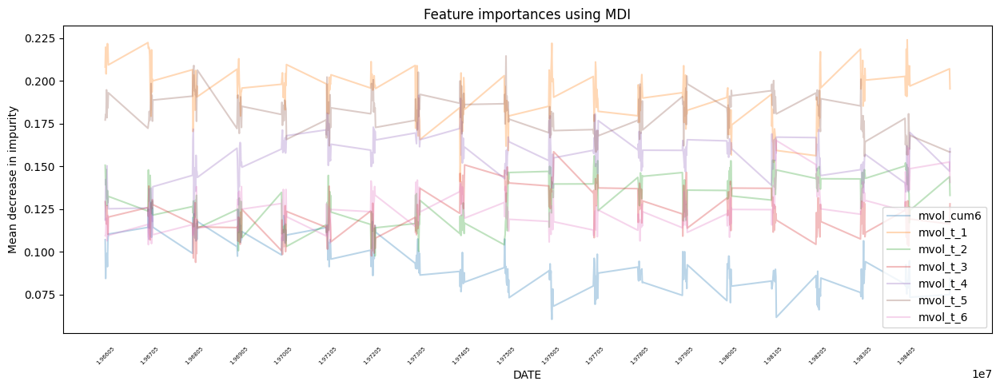

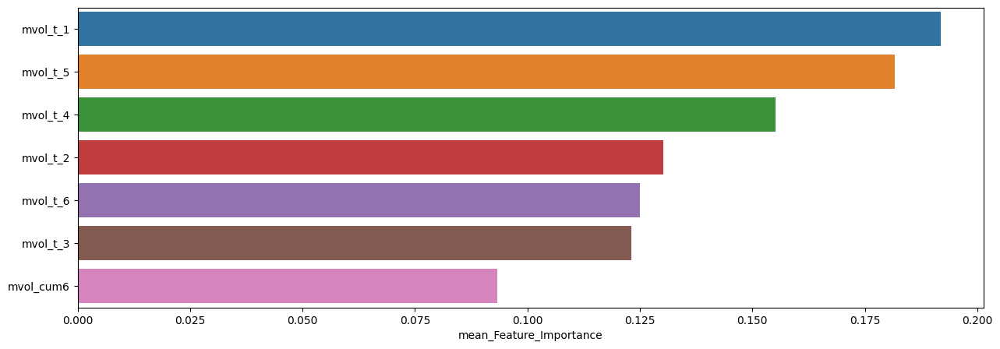

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.191835,0.224043,0.141044
mvol_t_5,0.181619,0.214594,0.155854
mvol_t_4,0.155151,0.191523,0.107244
mvol_t_2,0.130191,0.156112,0.097537
mvol_t_6,0.124954,0.165088,0.104132
mvol_t_3,0.123021,0.158506,0.093788
mvol_cum6,0.093230,0.128986,0.060357



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.27      0.34        70
         1.0       0.72      0.85      0.78       156

    accuracy                           0.67       226
   macro avg       0.58      0.56      0.56       226
weighted avg       0.63      0.67      0.64       226


accuracy : 0.668141592920354

precision : 0.7213114754098361

recall : 0.8461538461538461

F1-Score : 0.7787610619469026



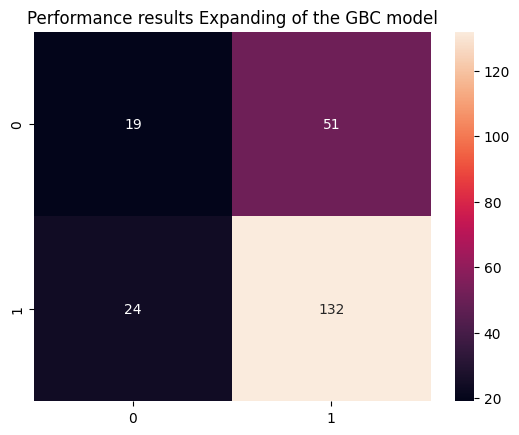


Feature Importance of the model



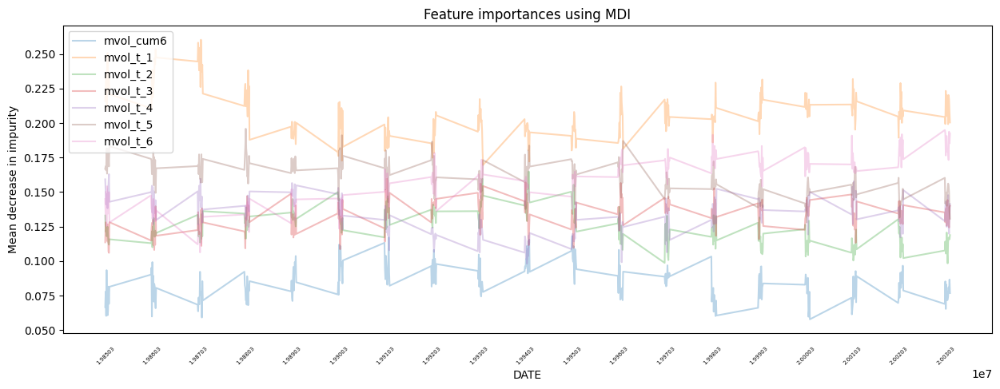

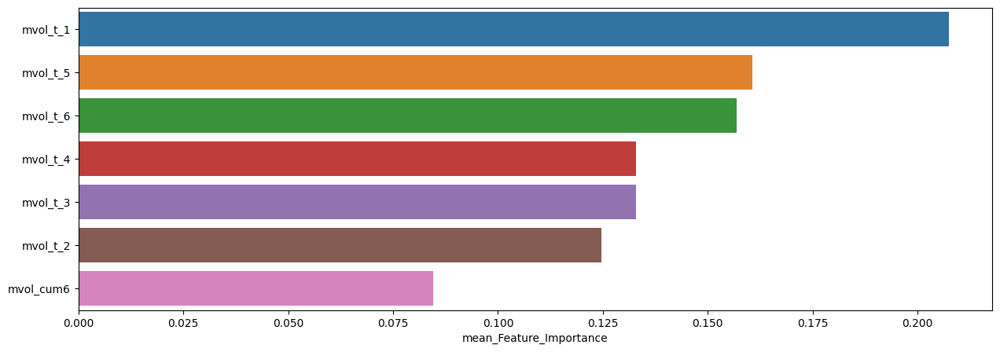

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.207400,0.260297,0.169581
mvol_t_5,0.160570,0.195811,0.127866
mvol_t_6,0.156956,0.194898,0.106243
mvol_t_4,0.132964,0.162897,0.098056
mvol_t_3,0.132867,0.159725,0.105908
mvol_t_2,0.124608,0.164841,0.098325
mvol_cum6,0.084635,0.118115,0.057771



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.19      0.25        96
         1.0       0.57      0.79      0.66       132

    accuracy                           0.54       228
   macro avg       0.48      0.49      0.46       228
weighted avg       0.50      0.54      0.49       228


accuracy : 0.5350877192982456

precision : 0.5714285714285714

recall : 0.7878787878787878

F1-Score : 0.6624203821656051



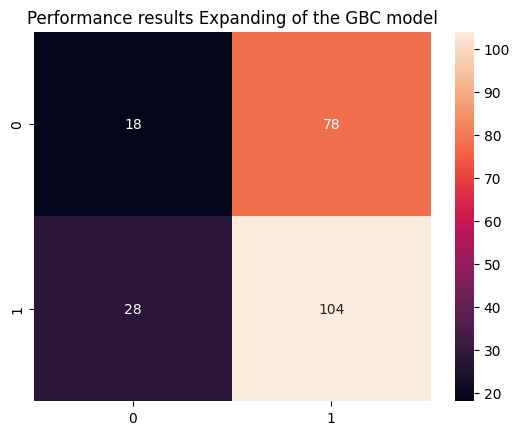


Feature Importance of the model



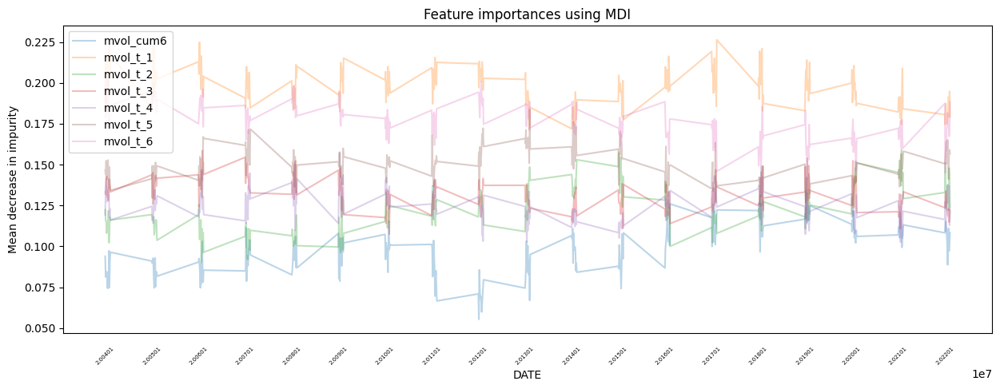

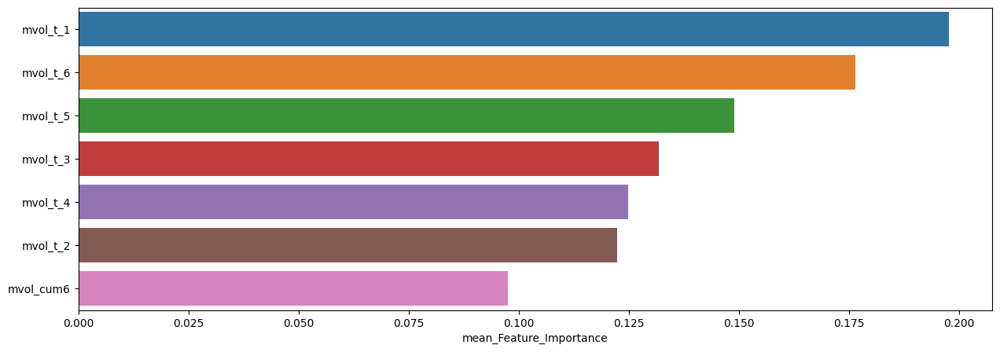

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.197711,0.226343,0.171344
mvol_t_6,0.176468,0.206059,0.140579
mvol_t_5,0.149081,0.183627,0.124639
mvol_t_3,0.131868,0.158519,0.107640
mvol_t_4,0.124878,0.157732,0.102584
mvol_t_2,0.122461,0.158830,0.090215
mvol_cum6,0.097533,0.132409,0.055377


In [54]:
slice_feature_importance(Expanding_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



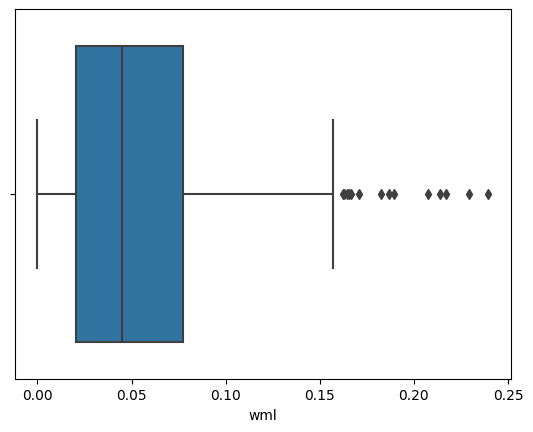

,count,mean,std,min,25%,50%,75%,max
wml,477.0,0.054109,0.043732,0.000007,0.020483,0.044931,0.077097,0.239571



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



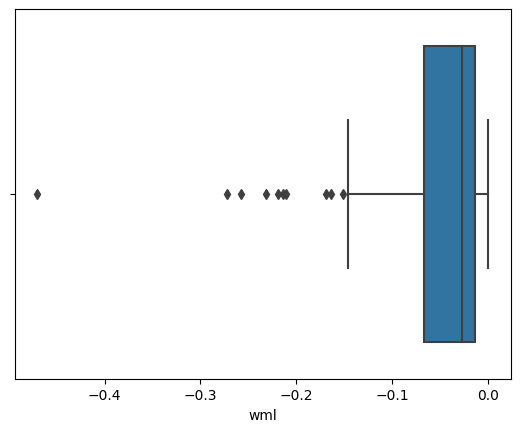

,count,mean,std,min,25%,50%,75%,max
wml,80.0,-0.060816,0.080046,-0.469903,-0.067657,-0.027861,-0.013899,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



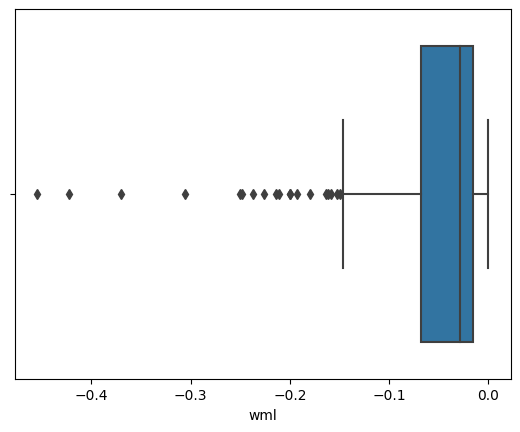

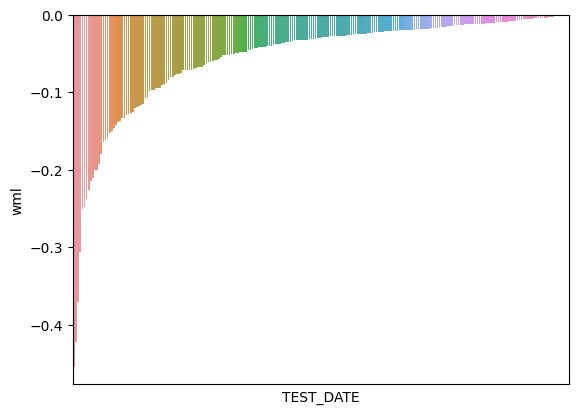

,count,mean,std,min,25%,50%,75%,max
wml,236.0,-0.054784,0.068108,-0.454349,-0.068119,-0.029076,-0.015243,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



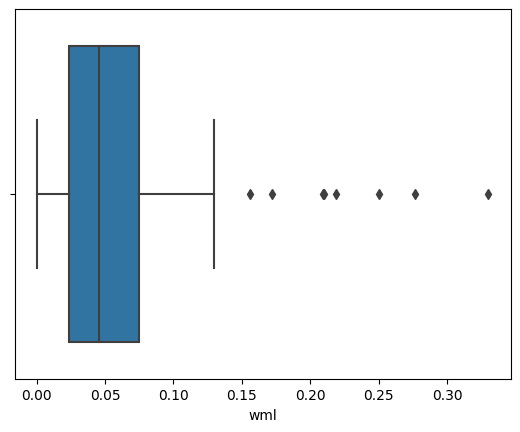

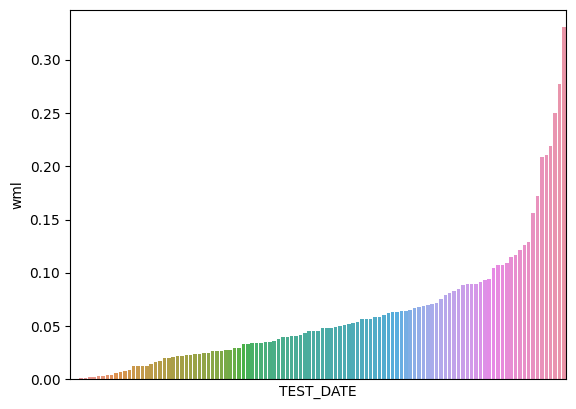

,count,mean,std,min,25%,50%,75%,max
wml,113.0,0.060067,0.058024,0.000577,0.023542,0.045577,0.075043,0.330163


In [55]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Expanding_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.67654

최근 누적 수익률

  2022년-12월 -> 45260.15
  2022년-11월 -> 40778.50
  2022년-10월 -> 40778.50
  2022년-09월 -> 40778.50
  2022년-08월 -> 37073.63

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 62910.52
  2등 : 2009년-02월 -> 56988.80
  3등 : 2002년-08월 -> 53194.52
  4등 : 2002년-07월 -> 53194.52
  5등 : 2001년-09월 -> 52689.93
  6등 : 2002년-10월 -> 50759.38
  7등 : 2009년-01월 -> 50744.62
  8등 : 2002년-06월 -> 50435.49
  9등 : 2008년-11월 -> 50413.64
  10등 : 2008년-12월 -> 49220.37



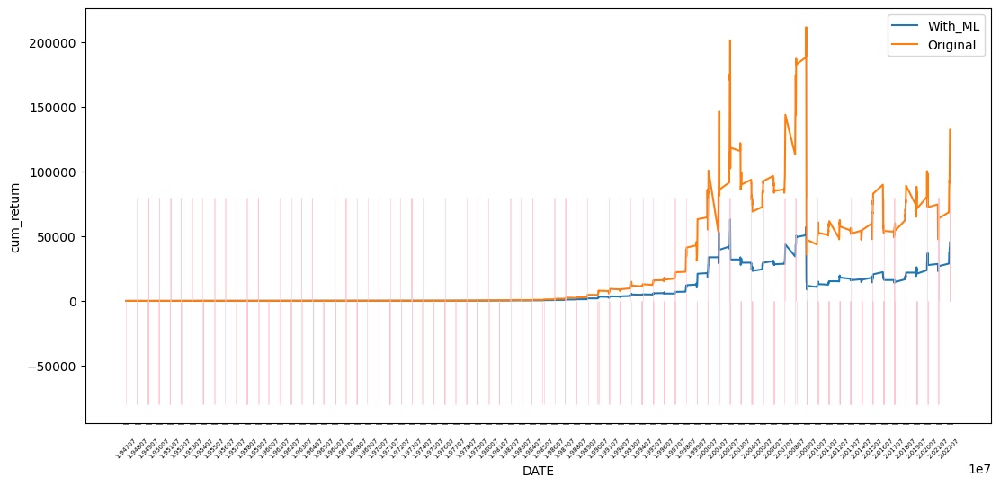

In [56]:
GBC_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.73458

최근 누적 수익률

  2022년-12월 -> 8306.57
  2022년-11월 -> 7700.13
  2022년-10월 -> 7544.36
  2022년-09월 -> 7108.00
  2022년-08월 -> 6677.75

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 9914.35
  2등 : 2009년-01월 -> 9169.06
  3등 : 2008년-11월 -> 9160.47
  4등 : 2002년-09월 -> 9139.52
  5등 : 2008년-12월 -> 8959.30
  6등 : 2008년-06월 -> 8544.50
  7등 : 2008년-10월 -> 8508.45
  8등 : 2022년-12월 -> 8306.57
  9등 : 2008년-09월 -> 8213.32
  10등 : 2002년-07월 -> 8113.28



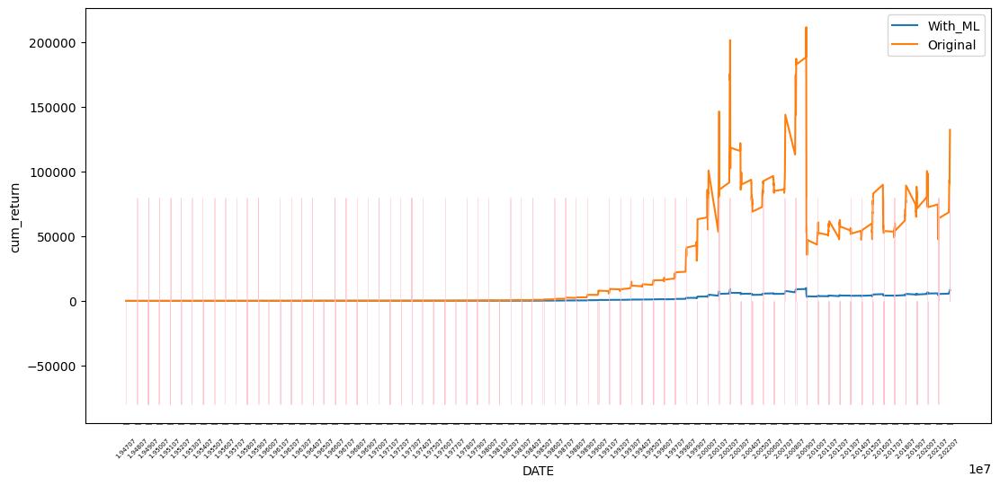

In [57]:
GBC_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                  WML,
                                                  'GBC_PROB_POS_WML',
                                                  GBC_A0_P1,
                                                  GBC_A1_P0,
                                                  plot=True)

### XGB

In [58]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : No

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.34      0.36       316
         1.0       0.67      0.70      0.68       590

    accuracy                           0.58       906
   macro avg       0.52      0.52      0.52       906
weighted avg       0.57      0.58      0.57       906


accuracy : 0.5772626931567328

precision : 0.666131621187801

recall : 0.7033898305084746

F1-Score : 0.6842539159109645



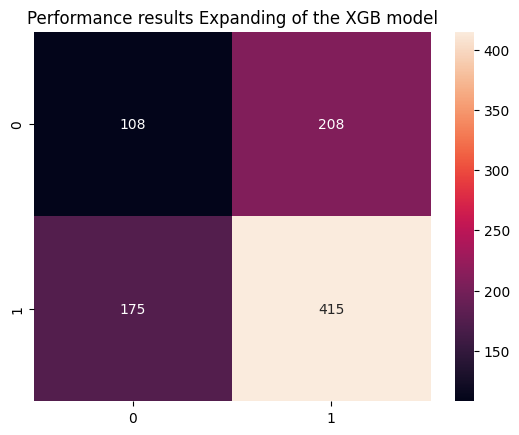


Feature Importance of the model



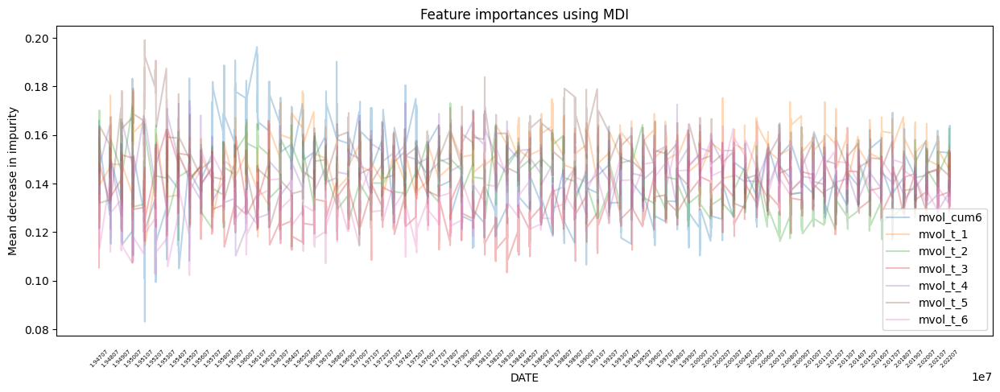

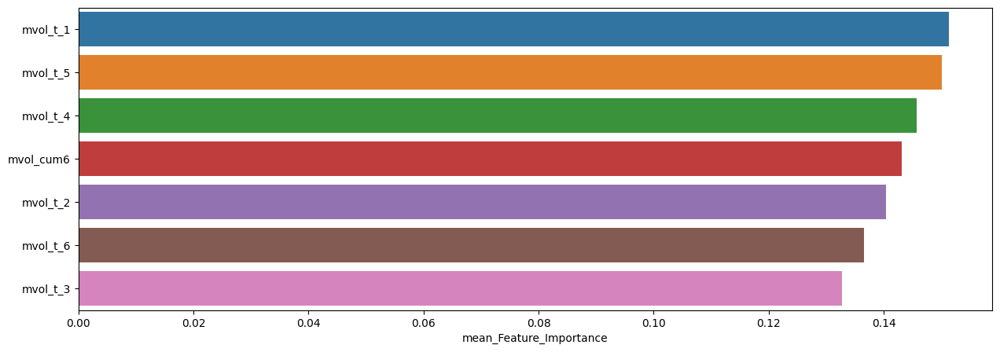

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.151295,0.177999,0.114372
mvol_t_5,0.150135,0.199084,0.114019
mvol_t_4,0.145776,0.174002,0.110210
mvol_cum6,0.143127,0.196298,0.083044
mvol_t_2,0.140343,0.173159,0.114376
mvol_t_6,0.136610,0.165494,0.102178
mvol_t_3,0.132715,0.165860,0.103335


In [59]:
Expanding_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.36      0.37        75
         1.0       0.69      0.72      0.71       151

    accuracy                           0.60       226
   macro avg       0.54      0.54      0.54       226
weighted avg       0.59      0.60      0.60       226


accuracy : 0.6017699115044248

precision : 0.6942675159235668

recall : 0.7218543046357616

F1-Score : 0.7077922077922078



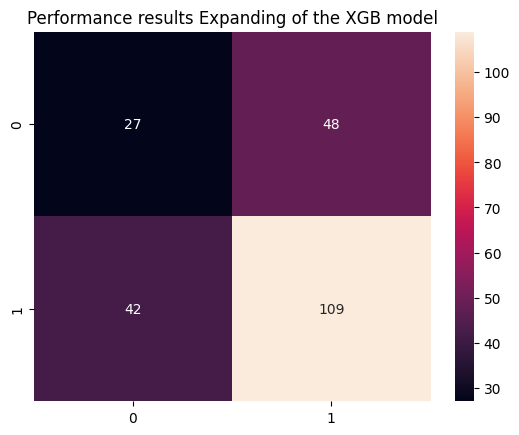


Feature Importance of the model



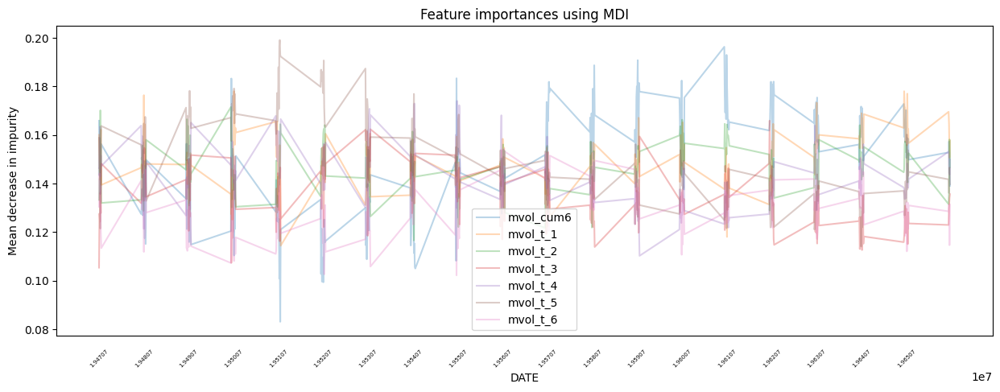

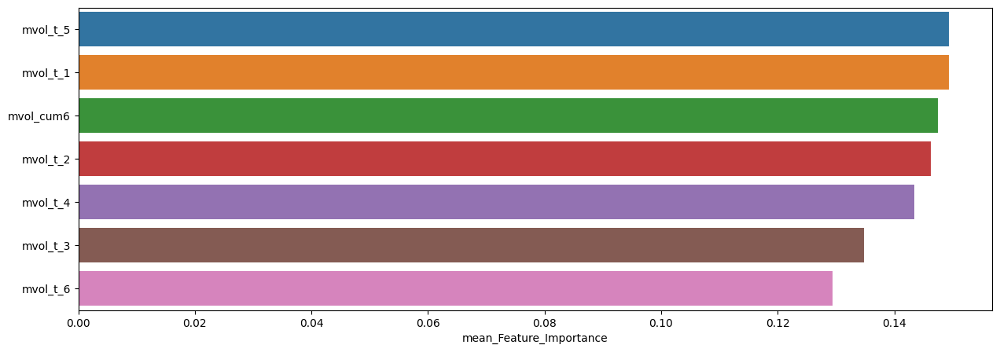

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.149332,0.199084,0.114019
mvol_t_1,0.149305,0.177999,0.114372
mvol_cum6,0.147514,0.196298,0.083044
mvol_t_2,0.146212,0.171499,0.116558
mvol_t_4,0.143422,0.174002,0.110210
mvol_t_3,0.134766,0.165860,0.105332
mvol_t_6,0.129449,0.154288,0.102178



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.39      0.39        75
         1.0       0.70      0.72      0.71       151

    accuracy                           0.61       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.60      0.61      0.60       226


accuracy : 0.6061946902654868

precision : 0.7012987012987013

recall : 0.7152317880794702

F1-Score : 0.7081967213114753



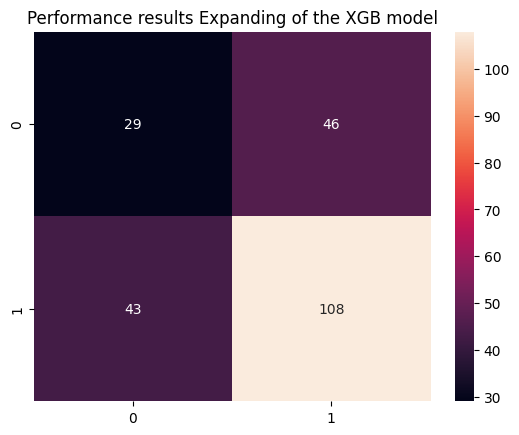


Feature Importance of the model



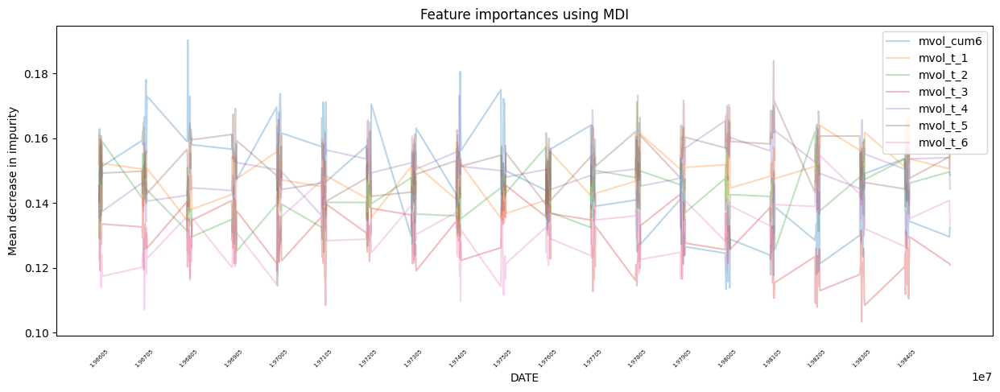

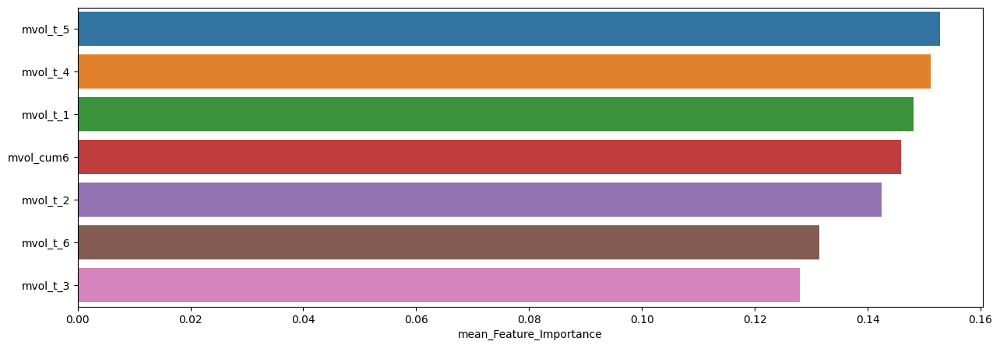

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.152794,0.183842,0.134301
mvol_t_4,0.151182,0.173092,0.132096
mvol_t_1,0.148177,0.169521,0.125568
mvol_cum6,0.145955,0.190227,0.113396
mvol_t_2,0.142506,0.173159,0.114376
mvol_t_6,0.131401,0.154614,0.107069
mvol_t_3,0.127984,0.150594,0.103335



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.37      0.37        70
         1.0       0.71      0.71      0.71       156

    accuracy                           0.60       226
   macro avg       0.54      0.54      0.54       226
weighted avg       0.60      0.60      0.60       226


accuracy : 0.6017699115044248

precision : 0.7142857142857143

recall : 0.7051282051282052

F1-Score : 0.7096774193548389



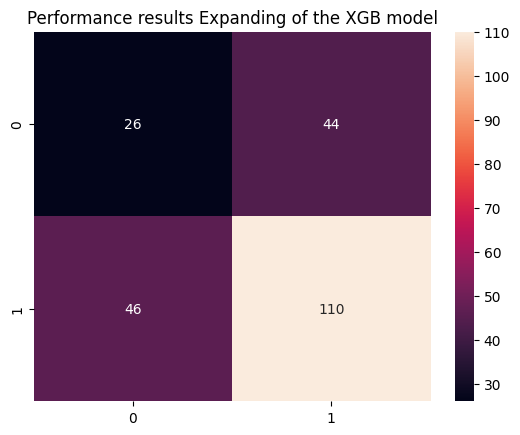


Feature Importance of the model



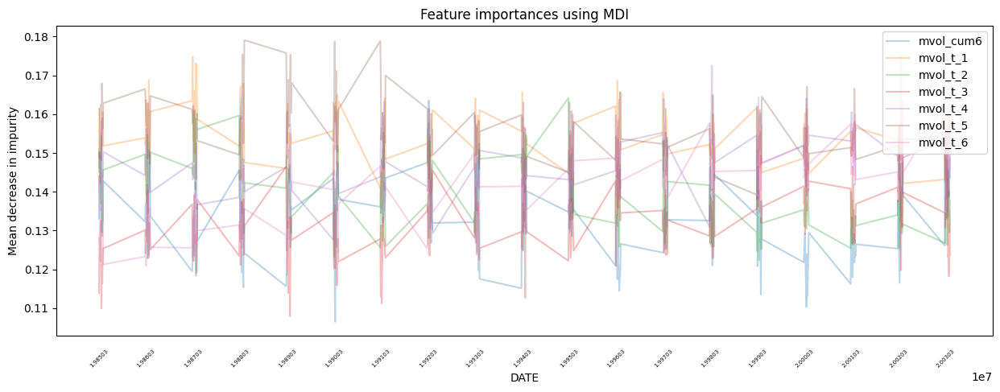

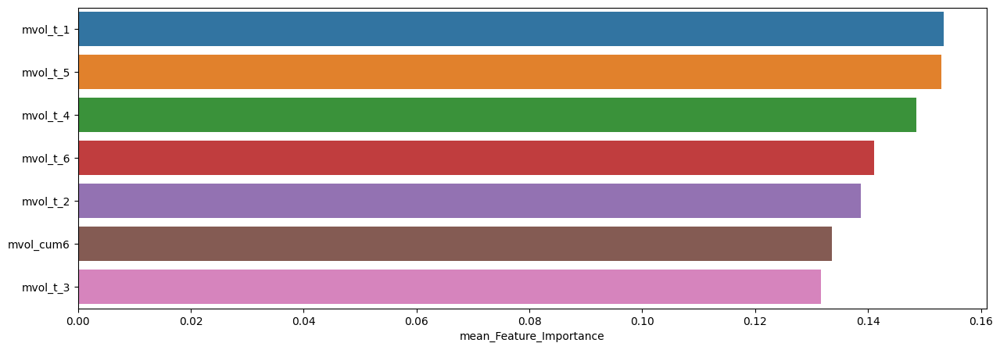

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.153382,0.175235,0.134242
mvol_t_5,0.153038,0.179106,0.129634
mvol_t_4,0.148526,0.172512,0.127607
mvol_t_6,0.141060,0.164412,0.120914
mvol_t_2,0.138781,0.164203,0.122355
mvol_cum6,0.133578,0.163540,0.106508
mvol_t_3,0.131635,0.156743,0.108025



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.27      0.31        96
         1.0       0.56      0.67      0.61       132

    accuracy                           0.50       228
   macro avg       0.46      0.47      0.46       228
weighted avg       0.48      0.50      0.48       228


accuracy : 0.5

precision : 0.5569620253164557

recall : 0.6666666666666666

F1-Score : 0.6068965517241379



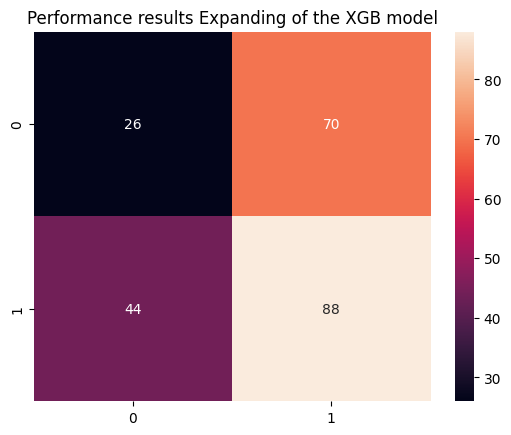


Feature Importance of the model



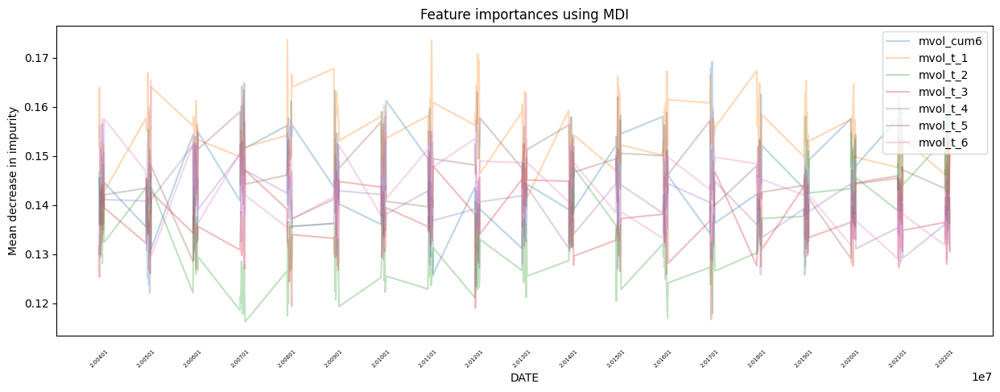

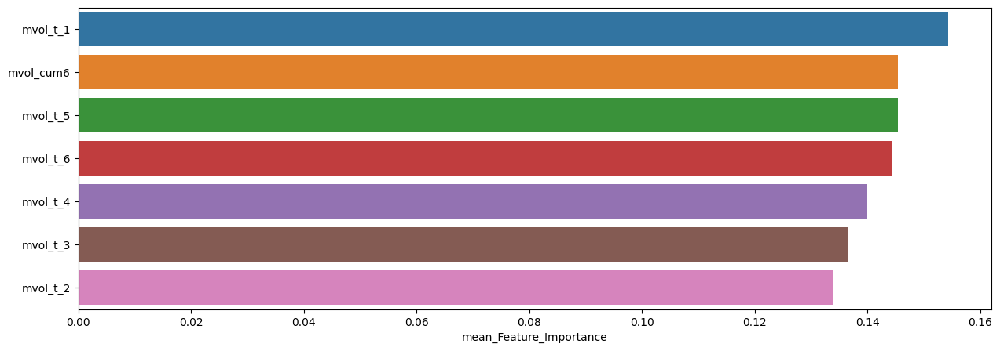

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.154288,0.173604,0.134011
mvol_cum6,0.145440,0.169235,0.122063
mvol_t_5,0.145417,0.164206,0.128465
mvol_t_6,0.144459,0.165494,0.127777
mvol_t_4,0.140026,0.156943,0.125768
mvol_t_3,0.136442,0.153466,0.116667
mvol_t_2,0.133928,0.162667,0.116192


In [60]:
slice_feature_importance(Expanding_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



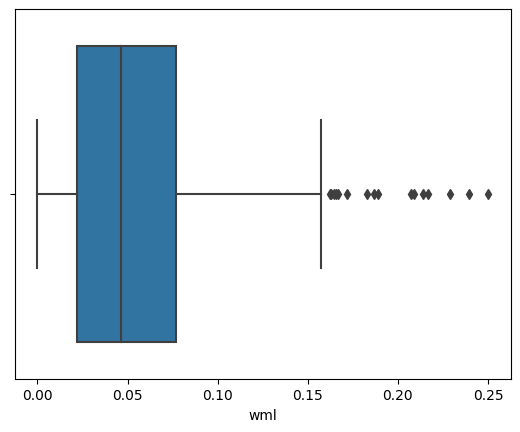

,count,mean,std,min,25%,50%,75%,max
wml,415.0,0.055106,0.045288,0.000007,0.021986,0.046172,0.076866,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



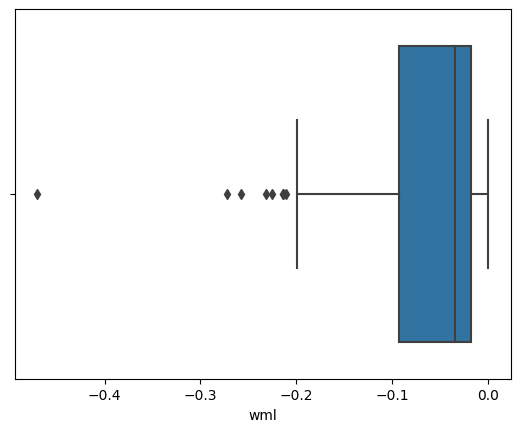

,count,mean,std,min,25%,50%,75%,max
wml,108.0,-0.063946,0.074657,-0.469903,-0.092685,-0.03502,-0.017924,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



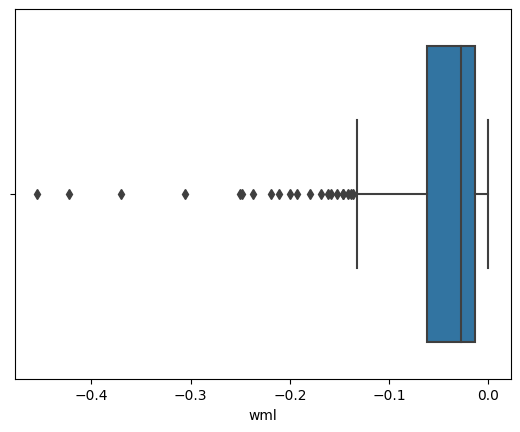

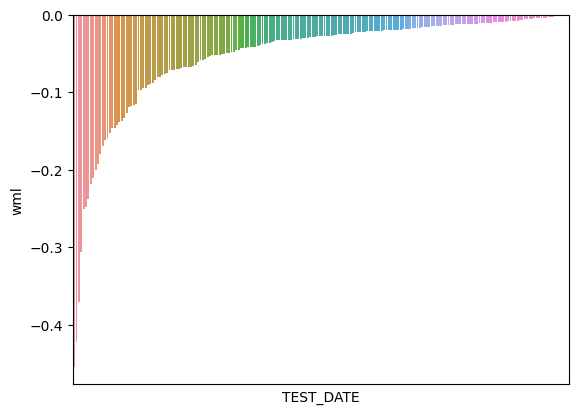

,count,mean,std,min,25%,50%,75%,max
wml,208.0,-0.052346,0.069244,-0.454349,-0.062133,-0.027505,-0.013399,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



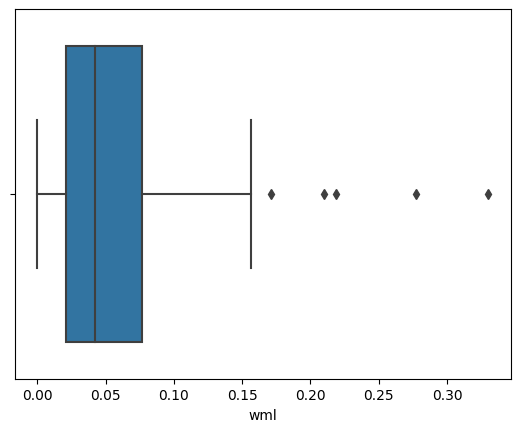

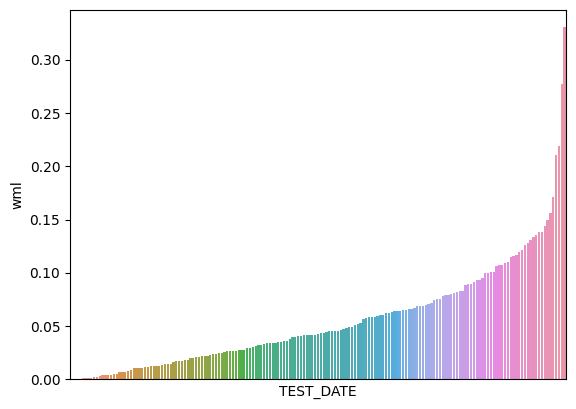

,count,mean,std,min,25%,50%,75%,max
wml,175.0,0.055591,0.050373,0.000128,0.020887,0.042611,0.076854,0.330163


In [61]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Expanding_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.67279

최근 누적 수익률

  2022년-12월 -> 23086.91
  2022년-11월 -> 23086.91
  2022년-10월 -> 23086.91
  2022년-09월 -> 20443.05
  2022년-08월 -> 20443.05

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 29022.96
  2등 : 2002년-09월 -> 28756.65
  3등 : 2008년-11월 -> 26469.43
  4등 : 2009년-01월 -> 25842.90
  5등 : 2008년-12월 -> 25842.90
  6등 : 2002년-07월 -> 24315.34
  7등 : 2002년-08월 -> 24315.34
  8등 : 2008년-10월 -> 24137.82
  9등 : 2008년-09월 -> 24137.82
  10등 : 2008년-08월 -> 24137.82



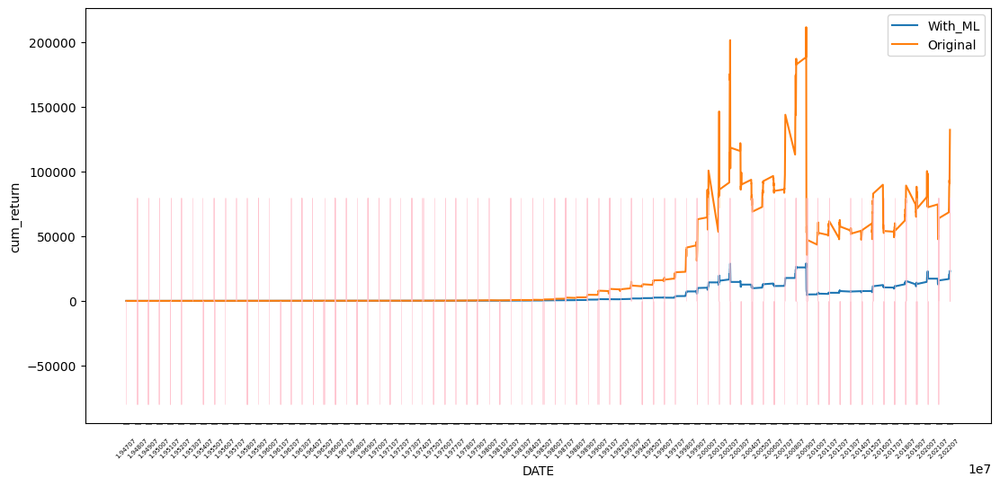

In [62]:
XGB_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.69480

최근 누적 수익률

  2022년-12월 -> 18573.32
  2022년-11월 -> 17666.97
  2022년-10월 -> 17338.88
  2022년-09월 -> 16039.74
  2022년-08월 -> 15684.23

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 20842.31
  2등 : 2002년-09월 -> 19958.75
  3등 : 2008년-11월 -> 19037.49
  4등 : 2009년-01월 -> 18824.12
  5등 : 2008년-12월 -> 18635.88
  6등 : 2022년-12월 -> 18573.32
  7등 : 2022년-11월 -> 17666.97
  8등 : 2008년-10월 -> 17537.14
  9등 : 2022년-10월 -> 17338.88
  10등 : 2002년-07월 -> 17316.34



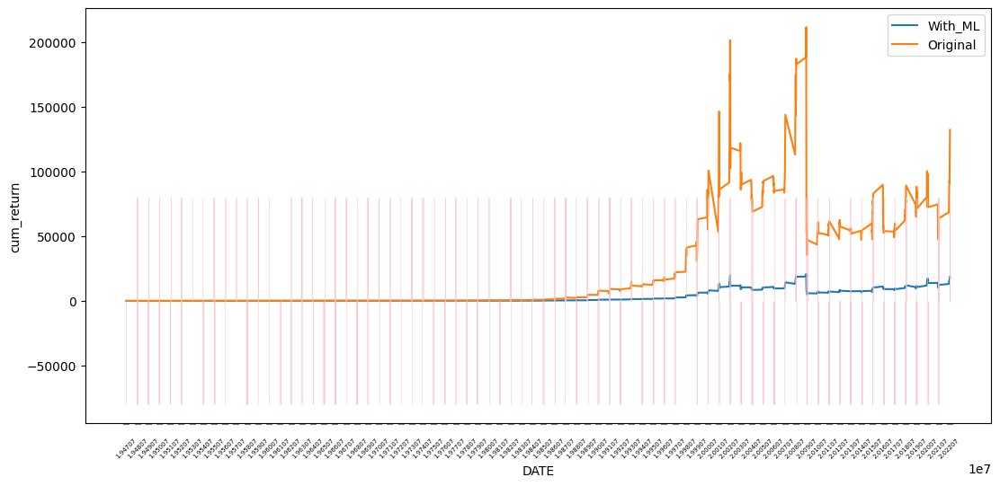

In [63]:
XGB_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [64]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.37      0.39       316
         1.0       0.68      0.73      0.70       590

    accuracy                           0.60       906
   macro avg       0.55      0.55      0.55       906
weighted avg       0.59      0.60      0.59       906


accuracy : 0.6015452538631346

precision : 0.6820349761526232

recall : 0.7271186440677966

F1-Score : 0.7038556193601312



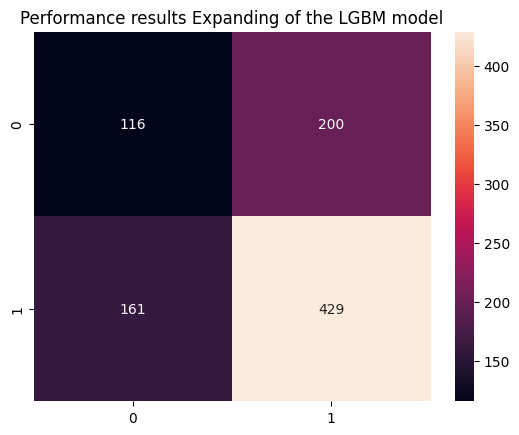


Feature Importance of the model



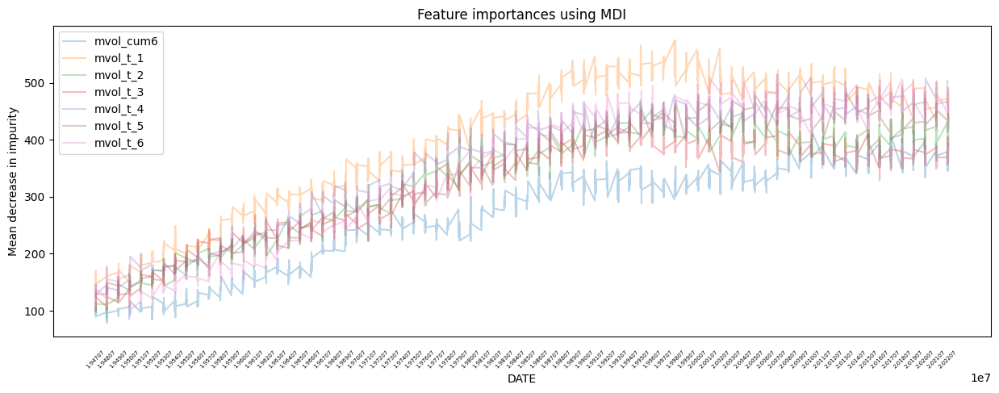

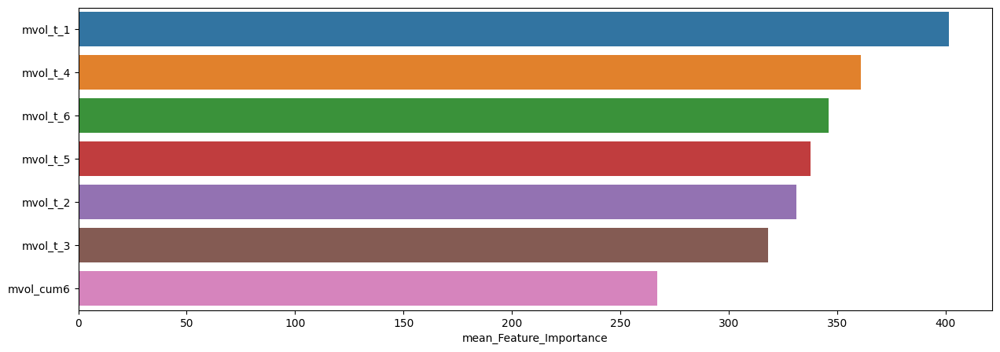

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,401.495585,575,132
mvol_t_4,360.966887,514,117
mvol_t_6,346.134658,508,92
mvol_t_5,337.809051,492,111
mvol_t_2,331.304636,469,86
mvol_t_3,318.199779,448,100
mvol_cum6,267.109272,415,79


In [65]:
Expanding_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.36      0.38        75
         1.0       0.70      0.74      0.72       151

    accuracy                           0.61       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.60      0.61      0.60       226


accuracy : 0.6106194690265486

precision : 0.6981132075471698

recall : 0.7350993377483444

F1-Score : 0.7161290322580645



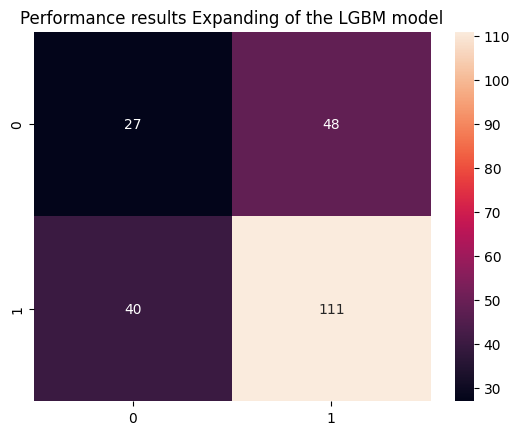


Feature Importance of the model



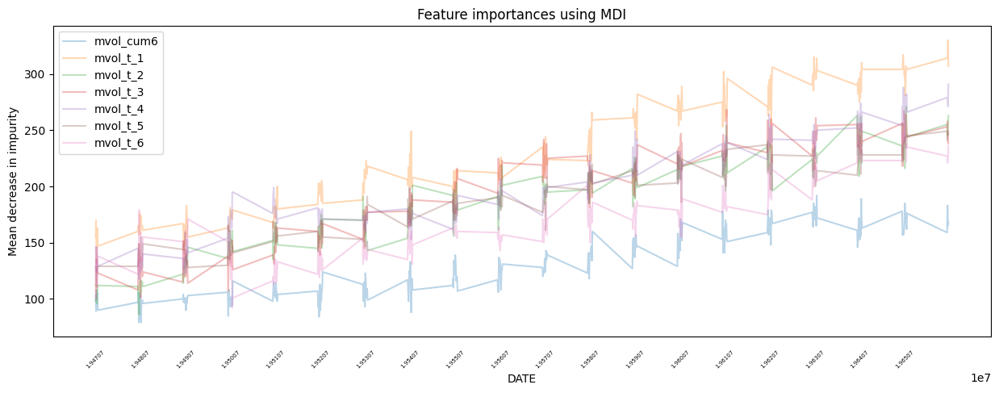

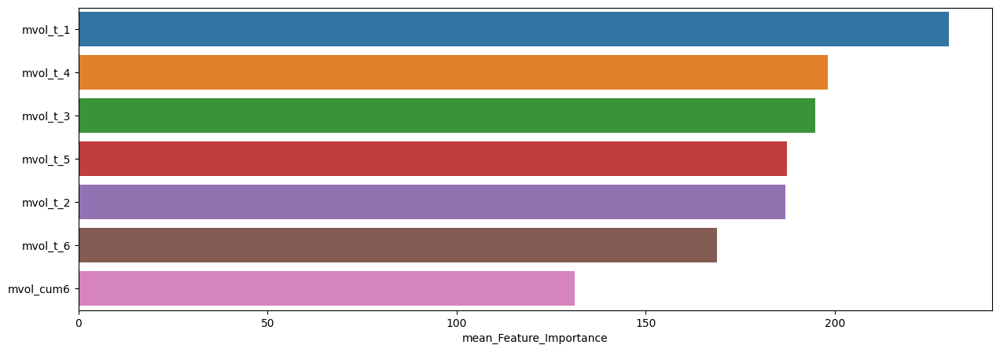

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,230.084071,330,132
mvol_t_4,198.212389,291,117
mvol_t_3,194.809735,268,100
mvol_t_5,187.327434,256,111
mvol_t_2,186.911504,271,86
mvol_t_6,168.920354,256,92
mvol_cum6,131.115044,192,79



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.41      0.42        75
         1.0       0.71      0.72      0.71       151

    accuracy                           0.62       226
   macro avg       0.56      0.56      0.56       226
weighted avg       0.61      0.62      0.61       226


accuracy : 0.6150442477876106

precision : 0.7105263157894737

recall : 0.7152317880794702

F1-Score : 0.7128712871287128



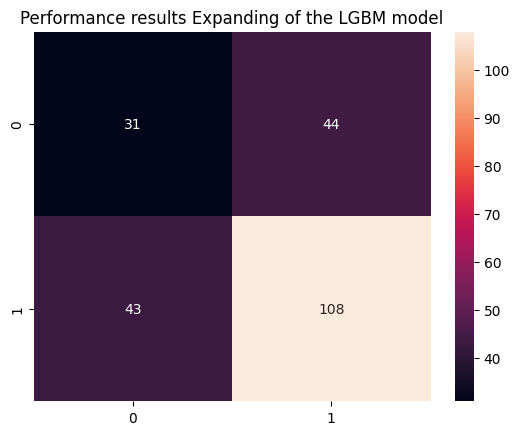


Feature Importance of the model



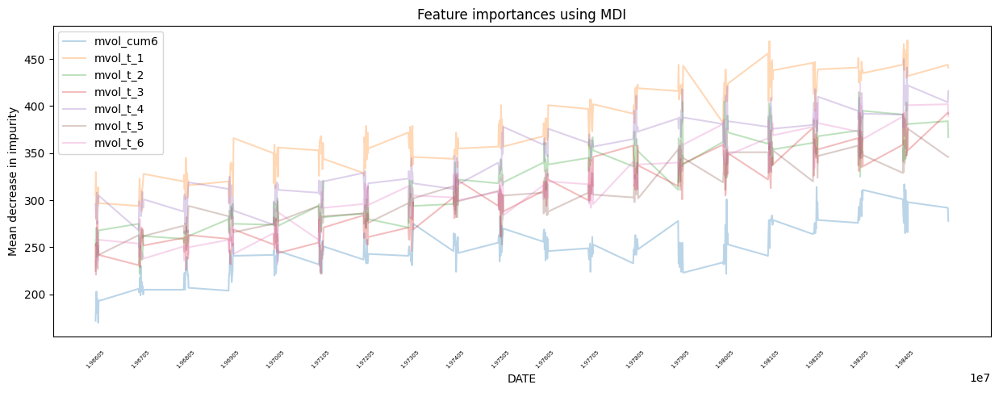

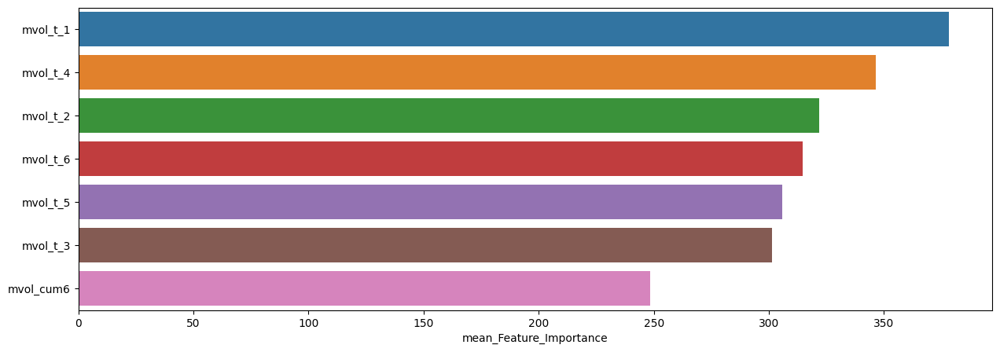

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,378.101770,470,279
mvol_t_4,346.327434,450,266
mvol_t_2,321.694690,415,222
mvol_t_6,314.712389,425,229
mvol_t_5,305.960177,376,225
mvol_t_3,301.384956,393,221
mvol_cum6,248.389381,317,170



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.40      0.42        70
         1.0       0.74      0.77      0.75       156

    accuracy                           0.65       226
   macro avg       0.59      0.58      0.59       226
weighted avg       0.65      0.65      0.65       226


accuracy : 0.6548672566371682

precision : 0.7407407407407407

recall : 0.7692307692307693

F1-Score : 0.7547169811320754



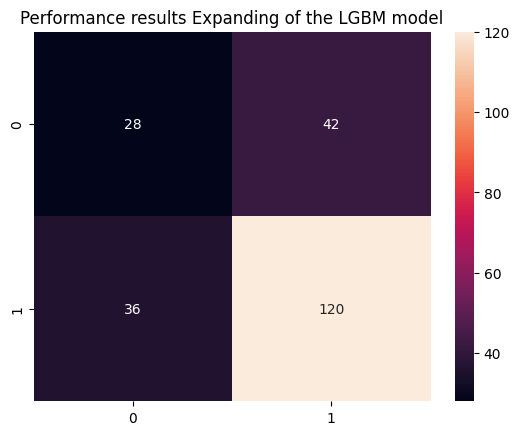


Feature Importance of the model



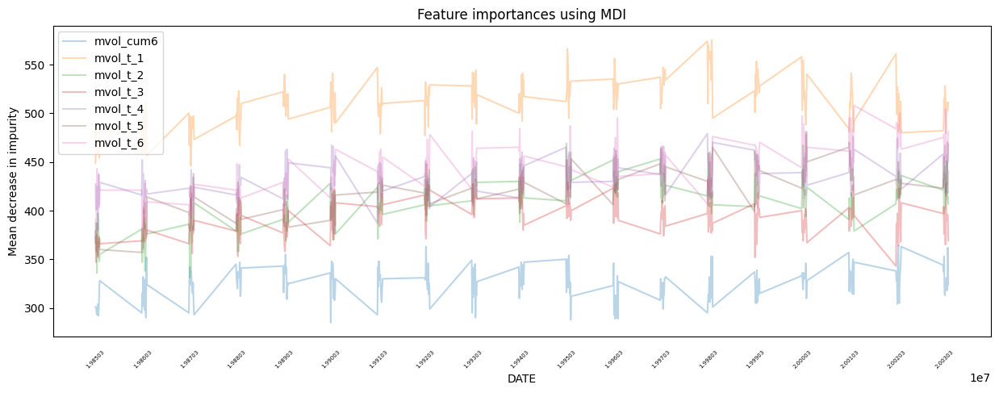

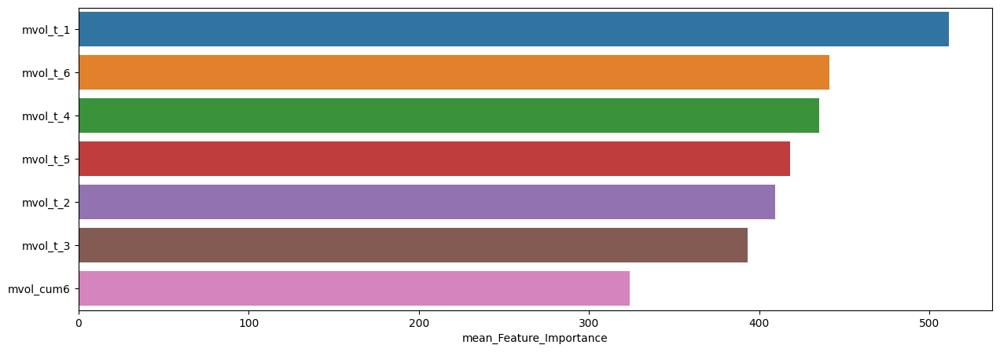

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,511.314159,575,446
mvol_t_6,441.438053,508,370
mvol_t_4,435.194690,479,380
mvol_t_5,418.097345,481,352
mvol_t_2,409.221239,469,331
mvol_t_3,393.141593,448,343
mvol_cum6,324.084071,364,285



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.31      0.36        96
         1.0       0.58      0.68      0.62       132

    accuracy                           0.53       228
   macro avg       0.50      0.50      0.49       228
weighted avg       0.51      0.53      0.51       228


accuracy : 0.5263157894736842

precision : 0.5769230769230769

recall : 0.6818181818181818

F1-Score : 0.6249999999999999



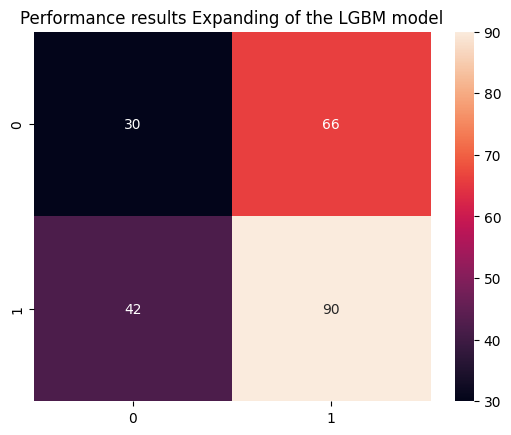


Feature Importance of the model



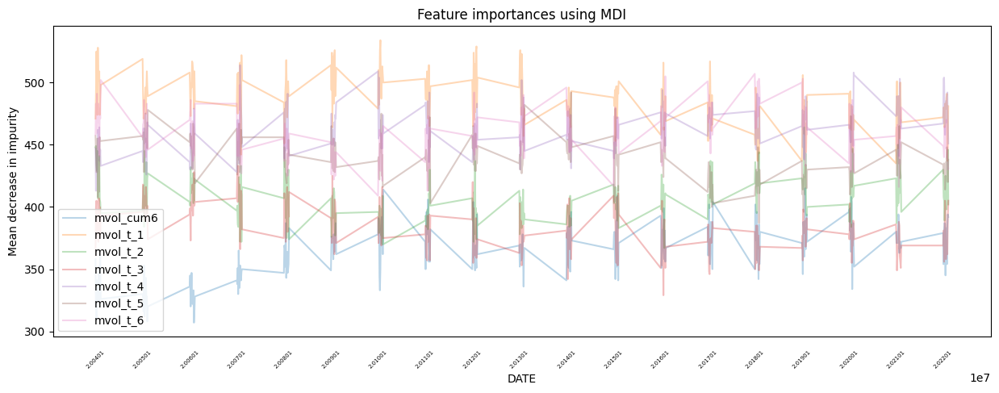

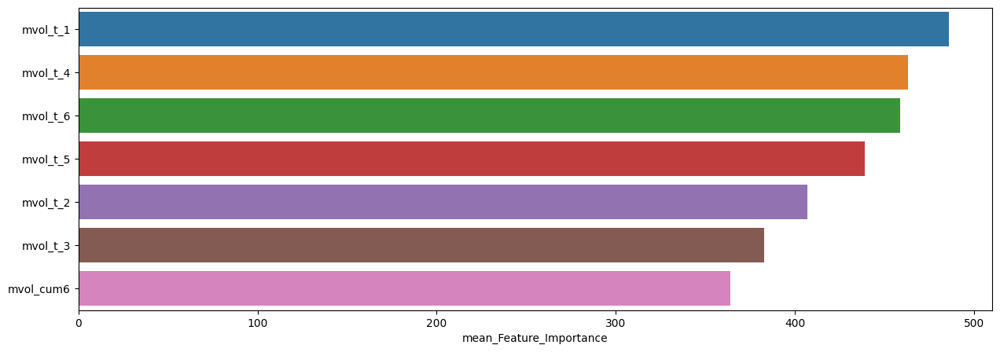

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,485.736842,534,435
mvol_t_4,463.228070,514,413
mvol_t_6,458.473684,507,409
mvol_t_5,438.956140,492,387
mvol_t_2,406.723684,464,367
mvol_t_3,382.890351,433,329
mvol_cum6,363.991228,415,307


In [66]:
slice_feature_importance(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Expanding', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



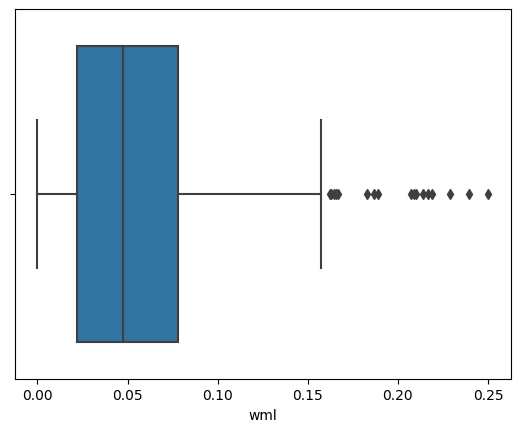

,count,mean,std,min,25%,50%,75%,max
wml,429.0,0.056188,0.046233,0.000007,0.022047,0.047411,0.077913,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



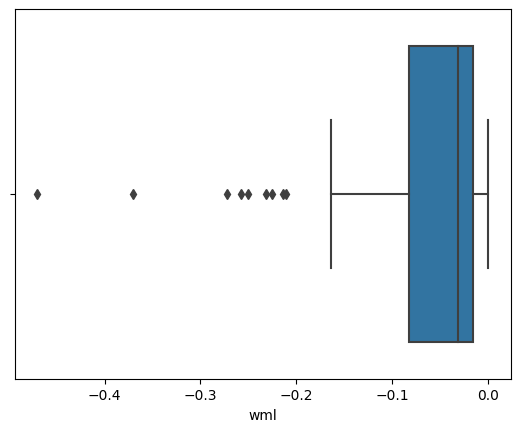

,count,mean,std,min,25%,50%,75%,max
wml,116.0,-0.06297,0.077666,-0.469903,-0.082435,-0.031823,-0.015997,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



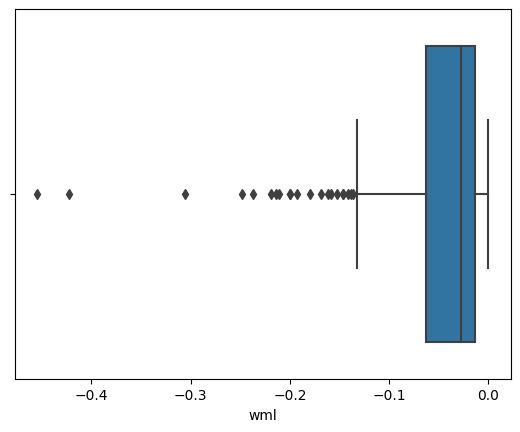

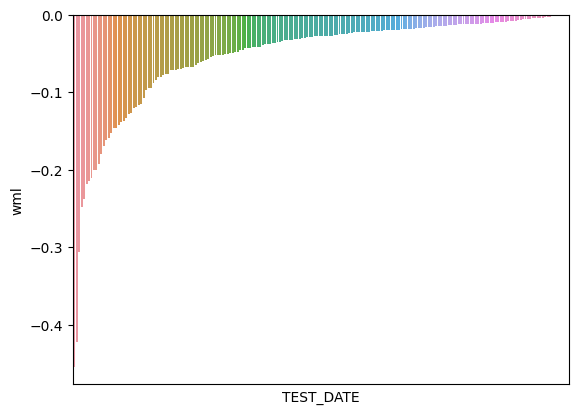

,count,mean,std,min,25%,50%,75%,max
wml,200.0,-0.052449,0.067125,-0.454349,-0.062458,-0.027297,-0.013844,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



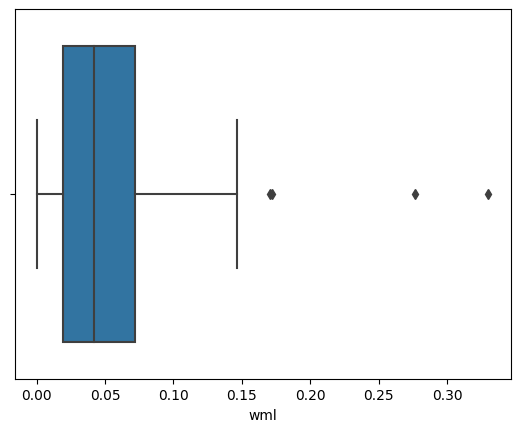

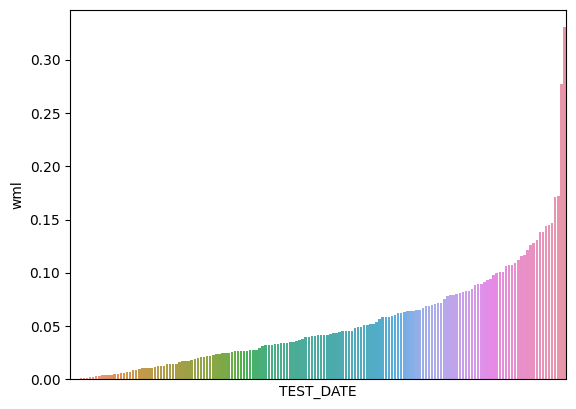

,count,mean,std,min,25%,50%,75%,max
wml,161.0,0.052749,0.048375,0.000577,0.019355,0.041582,0.072117,0.330163


In [67]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Expanding_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.59767

최근 누적 수익률

  2022년-12월 -> 119296.67
  2022년-11월 -> 107484.12
  2022년-10월 -> 107484.12
  2022년-09월 -> 95175.70
  2022년-08월 -> 95175.70

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 119296.67
  2등 : 2009년-02월 -> 111745.54
  3등 : 2020년-08월 -> 108845.19
  4등 : 2020년-09월 -> 108845.19
  5등 : 2020년-10월 -> 108470.15
  6등 : 2022년-11월 -> 107484.12
  7등 : 2022년-10월 -> 107484.12
  8등 : 2008년-11월 -> 101914.08
  9등 : 2007년-12월 -> 99803.52
  10등 : 2008년-12월 -> 99501.85



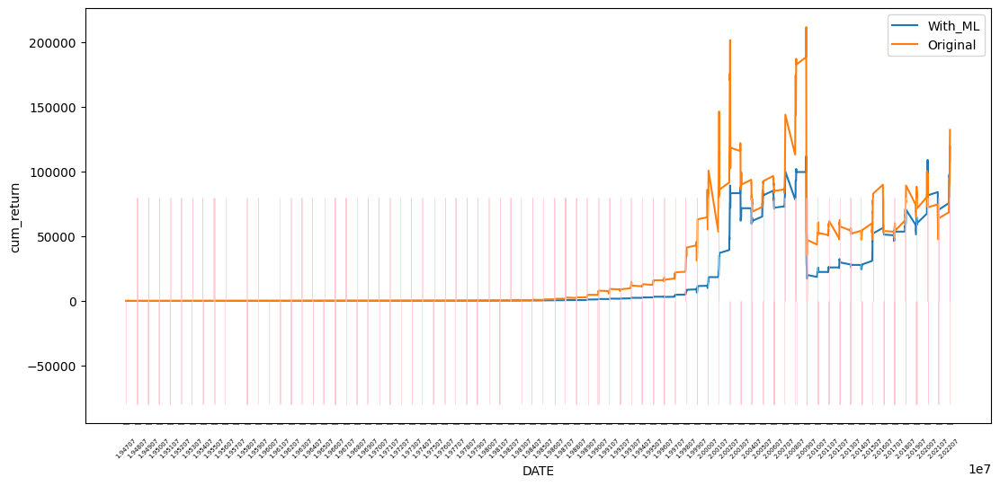

In [68]:
LGBM_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.66245

최근 누적 수익률

  2022년-12월 -> 27044.35
  2022년-11월 -> 25401.63
  2022년-10월 -> 24835.02
  2022년-09월 -> 22585.54
  2022년-08월 -> 21529.34

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 27044.35
  2등 : 2022년-11월 -> 25401.63
  3등 : 2022년-10월 -> 24835.02
  4등 : 2022년-09월 -> 22585.54
  5등 : 2022년-07월 -> 21867.18
  6등 : 2009년-02월 -> 21741.51
  7등 : 2022년-06월 -> 21620.54
  8등 : 2022년-08월 -> 21529.34
  9등 : 2022년-05월 -> 21522.27
  10등 : 2022년-04월 -> 20690.93



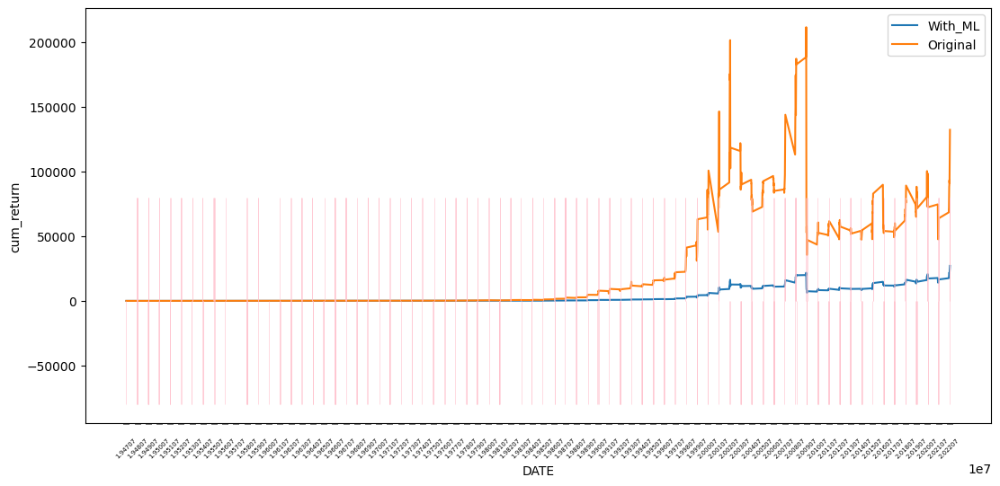

In [69]:
LGBM_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

# Performance

## F1 - Score

RDF의 F1-Score : 0.7241379310344828
GBC의 F1-Score : 0.6950925181013676
XGB의 F1-Score : 0.7027027027027026
LGBM의 F1-Score : 0.7045454545454545



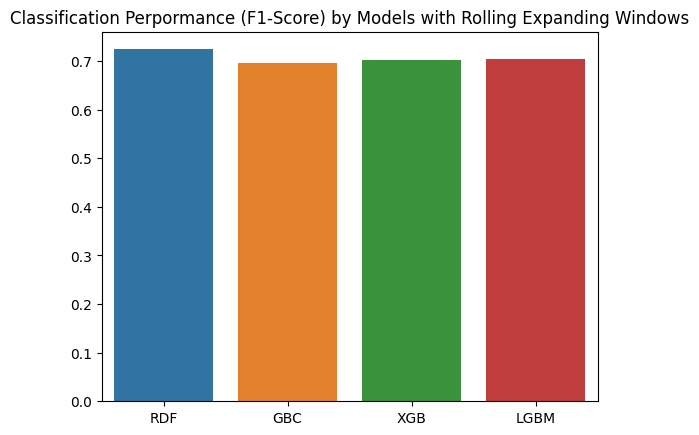

In [70]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

RDF의 F1-Score : 0.7257187257187258
GBC의 F1-Score : 0.7321565617805067
XGB의 F1-Score : 0.6842539159109645
LGBM의 F1-Score : 0.7038556193601312



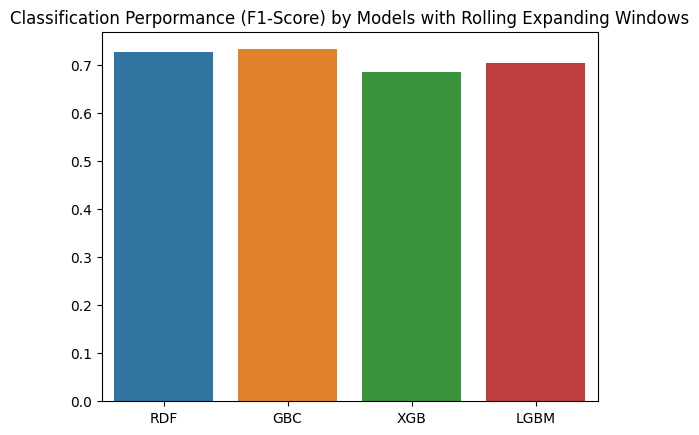

In [71]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [72]:
R_WML = WML.loc[19470731:].copy()
CUM_WML = WML.loc[19470731:].copy()

CUM_WML['wml'] = (1 + CUM_WML.wml).cumprod() - 1
CUM_WML.columns = ['cum_return'] 

last_r = CUM_WML['cum_return'].values[-1]
w_S = (R_WML['wml'].mean()/R_WML['wml'].std()) * math.sqrt(12)

In [73]:
def compare_sharpe_ratio(list_model, list_result, list_cum, dynamic=True):

  print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))

  for model, data, cum in zip(list_model, list_result, list_cum):
    data['wml'] = WML.loc[19470731:]['wml']

    if dynamic == True:

      data[f'{model}_PROB_WML'] = data['wml'] * data[f'{model}_PROB_POS_WML']
      S = (data[f'{model}_PROB_WML'].mean()/data[f'{model}_PROB_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))

      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

    else:

      data[f'{model}_PRED_WML'] = data['wml'] * data[f'{model}_PRED_POS_WML']
      S = (data[f'{model}_PRED_WML'].mean()/data[f'{model}_PRED_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))
      
      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

  sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')
  plt.title('Sharpe Ratio & Cum Return by Model')
  plt.xticks([CUM_WML.index[i] for i in range(0,len(CUM_WML.index), 12)])
  plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=1,
                    width=0.1)
  plt.show()

### Rolling Fixed Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.6863  최종 누적 수익률 : 14148.844359395835
GBC Sharpe Ratio : 0.6633  최종 누적 수익률 : 8744.022622161843
XGB Sharpe Ratio : 0.7468  최종 누적 수익률 : 31659.140501462265
LGBM Sharpe Ratio : 0.7142  최종 누적 수익률 : 23267.149349775485


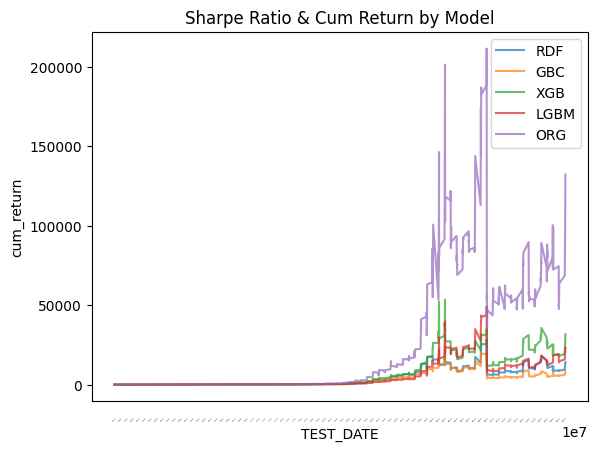

In [74]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_static, GBC_F_CUM_RETURN_static, XGB_F_CUM_RETURN_static, LGBM_F_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7933  최종 누적 수익률 : 7741.7769818393
GBC Sharpe Ratio : 0.7500  최종 누적 수익률 : 7885.19653661707
XGB Sharpe Ratio : 0.7754  최종 누적 수익률 : 17122.972473438567
LGBM Sharpe Ratio : 0.7960  최종 누적 수익률 : 15431.367946496468


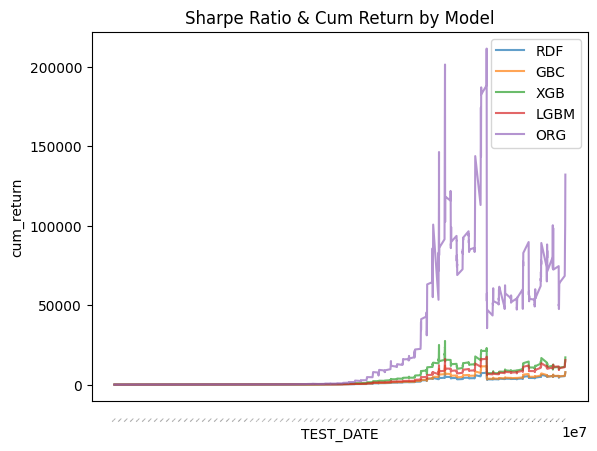

In [78]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_dynamic, GBC_F_CUM_RETURN_dynamic, XGB_F_CUM_RETURN_dynamic, LGBM_F_CUM_RETURN_dynamic],
                     dynamic=True)

### Rolling Expanding Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.8206  최종 누적 수익률 : 127595.48973741558
GBC Sharpe Ratio : 0.7481  최종 누적 수익률 : 45260.1452653864
XGB Sharpe Ratio : 0.7352  최종 누적 수익률 : 23086.908754132623
LGBM Sharpe Ratio : 0.8357  최종 누적 수익률 : 119296.67325790698


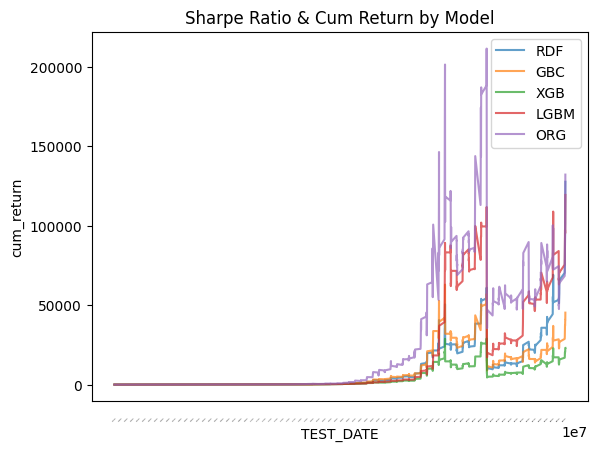

In [76]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_static, GBC_E_CUM_RETURN_static, XGB_E_CUM_RETURN_static, LGBM_E_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.8304  최종 누적 수익률 : 10135.572712303454
GBC Sharpe Ratio : 0.8047  최종 누적 수익률 : 8306.566741970719
XGB Sharpe Ratio : 0.8087  최종 누적 수익률 : 18573.31855868954
LGBM Sharpe Ratio : 0.8623  최종 누적 수익률 : 27044.350823113993


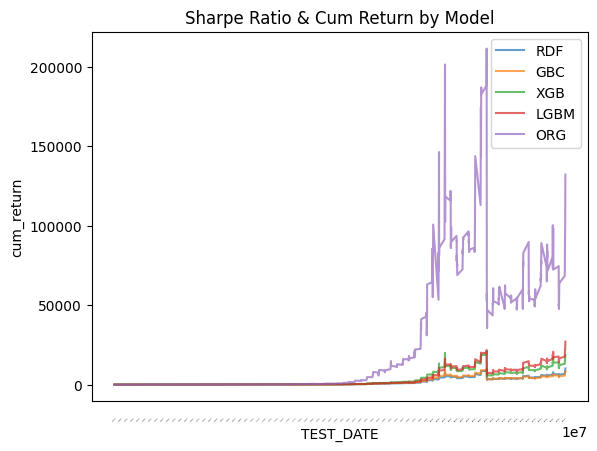

In [79]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_dynamic, GBC_E_CUM_RETURN_dynamic, XGB_E_CUM_RETURN_dynamic, LGBM_E_CUM_RETURN_dynamic],
                     dynamic=True)